# COMP5318 Assignment 2
*Make sure you change the file name with your unikey*


# 1. Data set up


## 1.1 Load Data

*Please upload both datasets (any file format is ok) to your google drive, and load the datasets through google drive file id in your code. If you want to use Jupyter, please submit all the dataset in an additional zip file.*



In [0]:
# import the necessary libraries 
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
% matplotlib inline
import seaborn as sns
from scipy.spatial.distance import cdist

In [0]:
#Download the datasets file from Google Drive
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

id = '1LY0DZdqNfMIVGGe88lzI14zQ66Bpzlhs'
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('Assignment 2 dataset.xlsx')

In [0]:
# Load the data
# Travel Review Dataset
data1 = pd.read_excel('Assignment 2 dataset.xlsx', sheet_name='data1', usecols='B:K')

# ICMLA Dataset
data2 = pd.read_excel('Assignment 2 dataset.xlsx', sheet_name='data2', usecols='B:E')

## 1.2 Data Preprocessing (optional)

***You are required to show your data preprocessing methods for the two datasets (if necessary)***

*You can apply different data preprocessing techniques in different data and clustering models if you need.*


### Travel Review Dataset

There are 980 examples in this dataset, each represents average ratings provided by a traveler on the ten categories. From the data, it can be seen that parks/picnic spots (category 7), beaches (8) and religious institutions (10) were rated highly by travelers (mean>2.5), whereas art galleries (1), restaurants (4) and museums (5) were the least popular (mean <1)

In [6]:
# Check the first five rows of the data
data1.head()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
0,0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
1,1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
2,1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
3,0.45,1.8,0.29,0.57,0.46,1.52,3.18,2.96,1.57,2.86
4,0.51,1.2,1.18,0.57,1.54,2.02,3.18,2.78,1.18,2.54


In [7]:
# Describe basic statistics
data1.describe()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
count,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000
mean,0.893194,1.352612,1.013306,0.532500,0.939735,1.842898,3.180939,2.835061,1.569439,2.799224
std,0.326912,0.478280,0.788607,0.279731,0.437430,0.539538,0.007824,0.137505,0.364629,0.321380
min,0.340000,0.000000,0.130000,0.150000,0.060000,0.140000,3.160000,2.420000,0.740000,2.140000
25%,0.670000,1.080000,0.270000,0.410000,0.640000,1.460000,3.180000,2.740000,1.310000,2.540000
50%,0.830000,1.280000,0.820000,0.500000,0.900000,1.800000,3.180000,2.820000,1.540000,2.780000
75%,1.020000,1.560000,1.572500,0.580000,1.200000,2.200000,3.180000,2.910000,1.760000,3.040000
max,3.220000,3.640000,3.620000,3.440000,3.300000,3.760000,3.210000,3.390000,3.170000,3.660000


**Data Transformation**  
Because distance-based algorithms would be used to cluster the data, all feature columns were normalized (to between zero and one) using sklearn MinMaxScaler to avoid the dominance of large value attributes when calculating distance. Whilst the feature values all range between 0 and 4, we found normalizing the data helped with the clustering outcome.  

*The MinMaxScaler* normalize the data by scaling each feature individually such that they are in the given range, e.g. between zero and one. The transformation is given by: (1) X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0)), and (2) X_scaled = X_std * (max - min) + min.

In [0]:
# convert the data into a numpy array
X = np.array(data1)

# normalize the data using MinMaxScaler from sklearn
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_norm = scaler.fit_transform(X)

### ICMLA Datasets

There are 105 examples in this dataset, each represents an accepted paper in the 2014 ICMLA conference, including its ID, paper title, author's keywords, and abstracts, with the column ‘session’ provided as the gold clusters.

In [9]:
# Check the first five rows of the data
data2.head()

,paper_title,author_keywords,abstract,session
0,Ensemble Statistical and Heuristic Models for ...,"statistical word alignment, ensemble learning,...",Statistical word alignment models need large a...,Ensemble Methods
1,Improving Spectral Learning by Using Multiple ...,"representation, spectral learning, discrete Fo...",Spectral learning algorithms learn an unknown ...,Ensemble Methods
2,Applying Swarm Ensemble Clustering Technique f...,"Software defect prediction, Particle swarm opt...",Number of defects remaining in a system provid...,Ensemble Methods
3,Reducing the Effects of Detrimental Instances,"filtering, label noise, instance weighting",Not all instances in a data set are equally be...,Ensemble Methods
4,Concept Drift Awareness in Twitter Streams,"Twitter, Adaptation models, Time-frequency ana...",Learning in non-stationary environments is not...,Ensemble Methods


In addition to the title, keywords and abstract columns, we created a ‘combine’ column that includes texts from the other three columns. This allowed us to try different feature columns to ensure the best one was chosen for our clustering algorithm. Furthermore, the 'session' column (the gold clusters) was converted into numbers (0-23) using the sklearn LabelEncoder class so it can be processed for model evaluation.

In [0]:
# combine the three features into one column so they can be processed by 
# the vectorizer (further down)
data2['combine'] = data2['paper_title'] + data2['author_keywords'] + data2['abstract']

# use LabelEncoder to convert the gold clusters 'session' to numbers
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()

# Assigning numerical values and storing in another column
data2['session_code'] = labelencoder.fit_transform(data2['session'])

In [11]:
# convert each column into an array so they can be processed by the algorithm
# the feature columns
X2 = np.array(data2)
X2_title = np.array(data2['paper_title'])
X2_keywords = np.array(data2['author_keywords'])
X2_abstract = np.array(data2['abstract'])
X2_combine = np.array(data2['combine'])

# the gold clusters
y2_string = np.array(data2['session'])
y2 = np.array(data2['session_code'])
np.unique(y2) # there are 24 true clusters in this dataset

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

Because clustering requires a distance measure between samples, we pre-processed the text in each feature column and constructed a numerical representation using the natural language tool kit (nltk) library. First, we performed tokenisation by breaking down the text into sentence, and then word units. Then, we cleaned the data by removing all tokens containing non-letter characters using the re (regular expression) package and performed stemming using Snowball stemming to produce root forms. Finally, we convert them into a numerical representation by constructing an ordered vector of term frequency - inverse document frequency (TF-IDF) for each unique word in the corpus.

In [12]:
# text data preprocessing
import nltk
from nltk.stem.snowball import SnowballStemmer
import re # regular expression

# create an instance of SnowballStemmer
stemmer = SnowballStemmer("english")
nltk.download('punkt')

# function to tokenize and stem text data
def tokenize_and_stem(text):
  # first tokenize by sentence, then by word to ensure that punctuation 
  # is caught as its own token
  tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
  filtered_tokens = []
  # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
  for token in tokens:
      if re.search('[a-zA-Z]', token):
          filtered_tokens.append(token)
  stems = [stemmer.stem(t) for t in filtered_tokens]
  return stems

# function to vectorize text data
def transvector(X):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.metrics.pairwise import cosine_similarity
  import seaborn as sns

  # using TfidfVectorizer to vectorize the text data
  tfidf_vectorizer = TfidfVectorizer(max_df=0.81, max_features=200000,
                                  min_df=0.08, stop_words='english',
                                  use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))
  # the above min and max_df have been chosen by our algorithm to work well with
  # the 'combine' feature column (see training session for the testing)

  tfidf_matrix = tfidf_vectorizer.fit_transform(X)
  return (1 - cosine_similarity(tfidf_matrix))

# function to do PCA analysis 
# (analyse how many feature columns explain the variance in the data)
# using sklearn PCA class
def pca_analysis(X):
  from sklearn.decomposition import PCA
  pca = PCA()
  X_pca = pca.fit(X)

  # calculate the explained variance ratio and analyse how many features 
  # are required to explain at least 90% variance in the data
  print("Explained Variance Ratio:")
  var = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3))
  print(var)
  for n, v in enumerate(var):
    if v>0.9:
      n_comp = n + 1
      break
  plt.ylabel('% Variance Explained')
  plt.xlabel('# of Features')
  plt.title('PCA Analysis')
  plt.plot(var)
  plt.show()
  return n_comp

# function to reduce number of features using PCA based on the above analysis
# using sklearn PCA class
def reduce(X,n_component):

  # PCA usually performs better when the data is centered, so the data
  # will be centered first before the number of features is reduced
  from sklearn.decomposition import PCA
  pca = PCA(n_components=n_component)
  X_centered = X - X.mean(axis=0) # repositioning it around x=0
  pca.fit(X_centered)
  X_pca = pca.transform(X_centered)

  return X_pca

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [13]:
# use the above text pre-processing funtions to convert text data into numerics
X_title = transvector(X2_title)
X_keywords = transvector(X2_keywords)
X_abstract = transvector(X2_abstract)
X_combine = transvector(X2_combine)
X_keywords.shape # the data now has 105 feature columns

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['abov', 'afterward', 'alon', 'alreadi', 'alway', 'ani', 'anoth', 'anyon', 'anyth', 'anywher', 'becam', 'becaus', 'becom', 'befor', 'besid', 'cri', 'describ', 'dure', 'els', 'elsewher', 'empti', 'everi', 'everyon', 'everyth', 'everywher', 'fifti', 'forti', 'henc', 'hereaft', 'herebi', 'howev', 'hundr', 'inde', 'mani', 'meanwhil', 'moreov', 'nobodi', 'noon', 'noth', 'nowher', 'onc', 'onli', 'otherwis', 'ourselv', 'perhap', 'pleas', 'sever', 'sinc', 'sincer', 'sixti', 'someon', 'someth', 'sometim', 'somewher', 'themselv', 'thenc', 'thereaft', 'therebi', 'therefor', 'togeth', 'twelv', 'twenti', 'veri', 'whatev', 'whenc', 'whenev', 'wherea', 'whereaft', 'wherebi', 'wherev', 'whi', 'yourselv'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/sklearn/

(105, 105)

Because the resulted numerical representations contained 105 feature columns, and such high dimensional data can cause storage, processing time and visualization problems, the sklearn Principal Component Analysis was used to analyse the number of features required to explain at least 90% variance in the data, then the number of features were reduced accordingly (eg, for keywords and combine columns, 20 and 51 features explain at least 90% of the variance in the those columns, so the number of features were reduced to 20 and 51, respectively).

Explained Variance Ratio:
[0.47  0.695 0.788 0.851 0.899 0.938 0.969 0.992 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999]


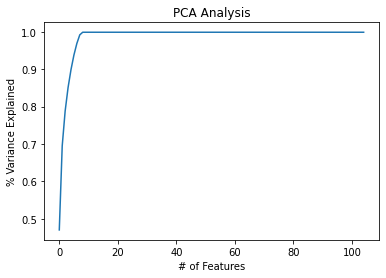

6


In [14]:
# use the above PCA analysis function to analyse the number of features required to explain 90% variance in X_title 
n_comp = pca_analysis(X_title)
print(n_comp)

# based on the above analysis, reduce the number of features on X_title to 6 features using PCA
X_title_pca = reduce(X_title,n_comp)

Explained Variance Ratio:
[0.397 0.573 0.686 0.76  0.819 0.871 0.913 0.942 0.961 0.978 0.991 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999
 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999 0.999]


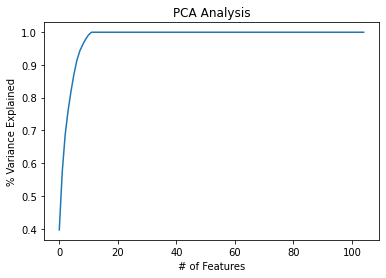

7


In [15]:
# use the above PCA analysis function to analyse the number of features required to explain 90% variance in X_keywords 
n_comp = pca_analysis(X_keywords)
print(n_comp)

# based on the above analysis, reduce the number of features on X_keywords to 7 features
X_keywords_pca = reduce(X_keywords,n_comp)

Explained Variance Ratio:
[0.106 0.199 0.268 0.324 0.378 0.423 0.463 0.5   0.531 0.561 0.59  0.615
 0.639 0.662 0.683 0.702 0.72  0.736 0.752 0.767 0.781 0.794 0.807 0.818
 0.829 0.84  0.85  0.859 0.868 0.876 0.884 0.891 0.898 0.904 0.91  0.916
 0.921 0.926 0.931 0.935 0.939 0.943 0.947 0.95  0.953 0.956 0.959 0.962
 0.965 0.967 0.969 0.971 0.973 0.975 0.977 0.979 0.981 0.982 0.983 0.984
 0.985 0.986 0.987 0.988 0.989 0.99  0.991 0.992 0.993 0.994 0.995 0.995
 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995
 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995
 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995 0.995]


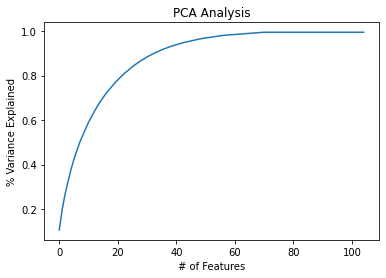

34


In [16]:
# use the above PCA analysis function to analyse the number of features required to explain 90% variance in X_abstract
n_comp = pca_analysis(X_abstract)
print(n_comp)

# based on the above analysis, reduce the number of features on X_abstract to 34 features
X_abstract_pca = reduce(X_abstract,n_comp)

Explained Variance Ratio:
[0.141 0.246 0.317 0.383 0.433 0.48  0.525 0.559 0.59  0.617 0.643 0.667
 0.688 0.709 0.729 0.746 0.762 0.777 0.791 0.805 0.817 0.828 0.839 0.849
 0.858 0.867 0.875 0.883 0.89  0.897 0.904 0.91  0.916 0.921 0.926 0.931
 0.936 0.94  0.944 0.948 0.952 0.955 0.958 0.961 0.964 0.967 0.969 0.971
 0.973 0.975 0.977 0.979 0.981 0.983 0.984 0.985 0.986 0.987 0.988 0.989
 0.99  0.991 0.992 0.993 0.994 0.995 0.996 0.997 0.998 0.998 0.998 0.998
 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998
 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998
 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998 0.998]


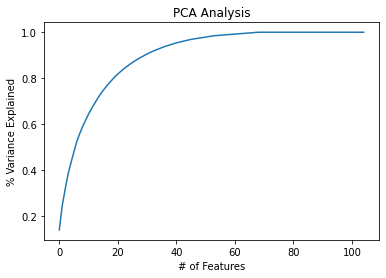

31


In [17]:
# use the above PCA analysis function to analyse the number of features required to explain 90% variance in X_combine
n_comp = pca_analysis(X_combine)
print(n_comp)

# based on the above analysis, reduce the number of features on X_combine to 31 features
X_combine_pca = reduce(X_combine,n_comp)



---


# 2. K-means Clustering

## 2.1 Travel Review Dataset

### Functions

In [0]:
# function to train k-means clustering using manhattan/cosine/euclidean distance
from sklearn.metrics import pairwise_distances_argmin

def find_clusters(X, metric, n_clusters, rseed=2):
    # 1. Randomly choose clusters
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]
    
    while True:
        # 2a. Assign labels based on closest center (E-Step)
        # metric can be  'cosine', 'euclidean', 'manhattan'
        labels = pairwise_distances_argmin(X, centers, metric=metric)
        
        # 2b. Find new centers from means of points (M-Step)
        new_centers = np.array([X[labels == i].mean(0)
                                for i in range(n_clusters)])

        # 2c. Check for convergence
        if np.all(centers == new_centers):
            break
        centers = new_centers
    
    # calculate inertia (the sum of squared errors between each point and its cluster centroid)
    # use zip to pair X and labels, then use for loop to iterate over them to calc the inertia
    # please refer to https://scikit-learn.org/stable/modules/clustering.html for further detail about inertia
    inertias = sum(((centers[label] - x)**2).sum()
                    for x, label in zip(X, labels)) 

    return centers, labels, inertias

# function to plot inertias to identify the turning point in the curve (the elbow)
# to detemine the number of k
def plot_elbow(inertias,k_range,elbow,ymin,ymax,xtext,ytext,title=""):
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, k_range), inertias, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Inertia", fontsize=14)
  plt.xticks(np.arange(0, k_range, step=2))
  plt.annotate('Elbow',
              xy=(elbow, inertias[elbow-1]),
              xytext=(xtext, ytext),
              textcoords='figure fraction',
              fontsize=16,
              arrowprops=dict(facecolor='black', shrink=0.1)
              )
  plt.axis([0, k_range, ymin, ymax])
  plt.title(title, size=12)
  plt.show()

# function to plot inertias to identify the turning point in the curve (the elbow)
# to detemine the number of k (can be used to plot two different inertias)
def plot_2elbow(inertias1,inertias2,k_range,elbow1,elbow2,ymin,ymax, xtext1, ytext1, xtext2, ytext2, title=""):
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, k_range), inertias1, "bo-" , label='Euclidean', color='green')
  plt.plot(range(1, k_range), inertias2, "bo-", label='Manhattan', color='blue')
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Inertia", fontsize=14)
  plt.xticks(np.arange(0, k_range, step=2))
  plt.annotate('Elbow1', # first elbow
              xy=(elbow1, inertias1[elbow1-1]),
              xytext=(xtext1, ytext1),
              textcoords='figure fraction',
              fontsize=16,
              arrowprops=dict(facecolor='black', shrink=0.1)
              )
  plt.annotate('Elbow2', # second elbow
              xy=(elbow2, inertias2[elbow2-1]),
              xytext=(xtext2, ytext2),
              textcoords='figure fraction',
              fontsize=16,
              arrowprops=dict(facecolor='black', shrink=0.1)
              )
  plt.axis([0, k_range, ymin, ymax])
  plt.title(title, size=12)
  plt.legend()
  plt.show()

# function to calculate and plot silhouette score
def calc_and_plot_silhouette(X, distance, labels, k_range, ymin, ymax, model=None, title=''):
  # using silhouette scores to detemine the number of k
  from sklearn.metrics import silhouette_score

  # the sklearn k-means is used for euclidean distance
  # manual find_clusters k-means is used for manhattan/cosine distance
  # calculate the solhouette scores on different k's
  if distance == 'eucledian':
    silhouette_scores = [silhouette_score(X, mod.labels_)
                      for mod in model[1:]]
  else:
    silhouette_scores = [silhouette_score(X, labels[k]) for k in range(1, k_range-1)]

  # plot the silhouette scores
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), silhouette_scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Silhouette score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

  return silhouette_scores

# function for plotting the silhouette coefficients for each k
# this code was adopted from COMP5310 - Principles of Data Science tutorial,
# week 8 by Dr Ali Anaissi, and adjusted for this assignment
def plot_silhouette(X, no_cluster, labels1, labels2):
  from sklearn.metrics import silhouette_samples
  from sklearn.metrics import silhouette_score

  import matplotlib.cm as cm
  range_n_clusters = range(2,no_cluster+1)

  for n_clusters in range_n_clusters:
      # Create a subplot with 1 row and 2 columns
      fig, (ax1, ax2) = plt.subplots(1, 2)
      fig.set_size_inches(12, 5)

      # The 1st subplot is the silhouette plot for model 1
      # The silhouette coefficient can range from -1, 1 but in this example we
      # only plot within [-0.1, 1]
      ax1.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      cluster_labels = labels1[n_clusters]

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print("\nAverage silhouette score (model 1): {:.4f}".format(silhouette_avg))

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.Spectral(float(i) / n_clusters)
          ax1.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for model 1")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhoutte score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      # The 2nd subplot is the silhouette plot for model 2
      # The silhouette coefficient can range from -1, 1 but in this example we
      # only plot within [-0.1, 1]
      ax2.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax2.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      cluster_labels = labels2[n_clusters]

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print("Average silhouette score (model 2): {:.4f}".format(silhouette_avg))

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.Spectral(float(i) / n_clusters)
          ax2.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax2.set_title("The silhouette plot for model 2")
      ax2.set_xlabel("The silhouette coefficient values")
      ax2.set_ylabel("Cluster label")

      # The vertical line for average silhoutte score of all the values
      ax2.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax2.set_yticks([])  # Clear the yaxis labels / ticks
      ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      plt.suptitle(("Silhouette analysis for KMeans clustering "
                    "with k = %d" % n_clusters),
                  fontsize=14, fontweight='bold')

      plt.show()

# function to plot the calinski-harabasz score using matplotlib
# see https://matplotlib.org/ for further info
def plot_calinski(chscores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), chscores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Calinski-Harabasz score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])

# function to plot the calinski-harabasz score using matplotlib
# see https://matplotlib.org/ for further info
def plot_2calinski(chscores1, chscores2, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), chscores1, "bo-", label='Euclidean', color='green')
  plt.plot(range(2, k_range), chscores2, "bo-", label='Manhattan', color='blue')
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Calinski-Harabasz score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.legend()
  
# function to plot the davies-bouldin score using matplotlib
# see https://matplotlib.org/ for further info
def plot_davies(dbscores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), dbscores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Davies-Bouldin score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])

# function to plot two different Davies-Bouldin scores using matplotlib
# see https://matplotlib.org/ for further info
def plot_2davies(dbscores1, dbscores2, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), dbscores1, "bo-", label='Euclidean', color='green')
  plt.plot(range(2, k_range), dbscores2, "bo-", label='Manhattan', color='blue')
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Davies-Bouldin score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.legend()

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=''):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=42)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train K-means clustering

Fifty eight models were trained on this dataset using k=1-29 and two distance measures. The Euclidean distance, which measures the straight-line distance between two points, is the common metric to use for k-means. The Manhattan (or Cityblock) distance, which measures the absolute or distance in blocks between any two points in a city, was included as a comparison. 

**K-means clustering using Euclidean distance**

In [0]:
# train k-means clustering using euclidean distance and different number of k's
k_range = 30 # set the number of k's
X1_data = X_norm # set the data to use (here we use the normalized data)

# use the sklearn KMeans class to create the models
from sklearn.cluster import KMeans

# fit the models (using k=1-29)
kmeans_euclidean = [KMeans(n_clusters=k, random_state=42).fit(X1_data)
                for k in range(1, k_range)]

# get the labels from the models
labels_euclidean = [model.fit_predict(X1_data) for model in kmeans_euclidean]

# get the inertias
inertias_euclidean = [model.inertia_ for model in kmeans_euclidean]

**K-means clustering using Manhattan distance**

In [0]:
# train k-means clustering using manhattan distance and different number of k's
k_range2 = 30 # set the number of k's

# use the find_clusters function to create the models (using k=1-29)
clusters_manhattan = [find_clusters(X1_data, 'manhattan', n_clusters=k)
                for k in range(1, k_range2)]

# get the centroids
centers_manhattan = [clusters_manhattan[k][0] for k in range(0, k_range2-1)]

# get the labels
labels_manhattan = [clusters_manhattan[k][1] for k in range(0, k_range2-1)]

# get the inertias
inertias_manhattan = [clusters_manhattan[k][2] for k in range(0, k_range2-1)]

### First evaluation 

**The Elbow Method**  
The elbow method, which observes the marginal reduction of the sum of within-cluster variances (the inertia), was used to determine the appropriate number of clusters to use for this dataset.

In [21]:
# create a dataframe to show the change in inertias for k-means euclidean
df_inertia = pd.DataFrame(inertias_euclidean, columns=['inertia'])
df_inertia['difference'] = -(df_inertia.diff()) # calculate the difference
df_inertia.head(14)

,inertia,difference
0,235.629278,NaN
1,168.075115,67.554163
2,146.428224,21.646890
3,134.887950,11.540275
4,126.321167,8.566783
5,118.973156,7.348011
6,113.794057,5.179099
7,109.906226,3.887831
8,104.918161,4.988065
9,101.262739,3.655422


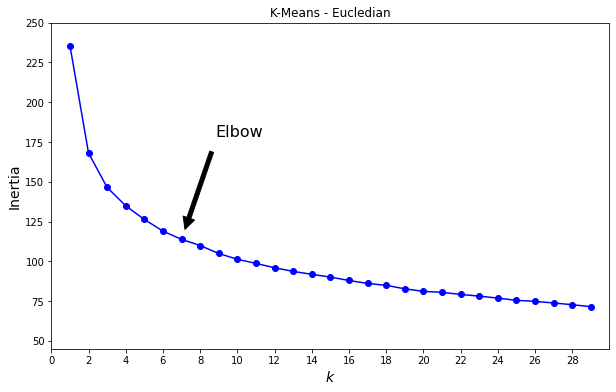

In [22]:
# plot the inertias for the k-means euclidean using the plot_elbow function
plot_elbow(inertias_euclidean,k_range,elbow=7,ymin=45,ymax=250, xtext=0.35, ytext=0.65, title="K-Means - Eucledian")

In [23]:
# create a dataframe to show the change in inertias for k-means manhattan
df_inertia2 = pd.DataFrame(inertias_manhattan, columns=['inertia'])
df_inertia2['difference'] = -(df_inertia2.diff()) # calculate the difference
df_inertia2.head(14)

,inertia,difference
0,235.629278,NaN
1,170.059027,65.570251
2,148.336010,21.723017
3,136.686933,11.649077
4,130.828513,5.858420
5,127.150791,3.677722
6,119.957103,7.193688
7,114.576860,5.380243
8,111.696253,2.880607
9,106.892404,4.803849


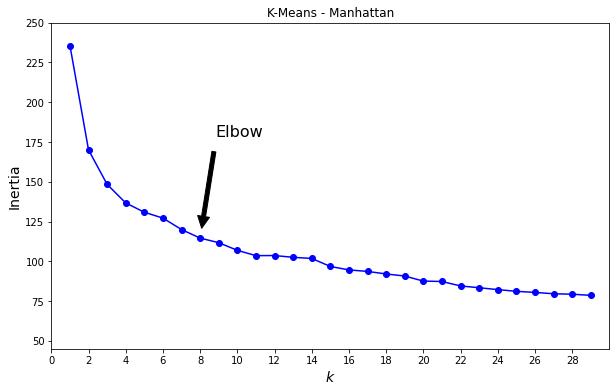

In [24]:
# plot the inertias for the k-means manhattan using the plot_elbow function
plot_elbow(inertias_manhattan,k_range2,elbow=8,ymin=45,ymax=250, xtext=0.35, ytext=0.65, title="K-Means - Manhattan")

From the inertia plot, it can be seen that the inertia dropped very quickly as k was increased to 7 (Euclidean) and 8 (Manhattan), but started to flatten out after those points. This suggested a good choice of k=7 for Euclidean and k=8 for Manhattan.

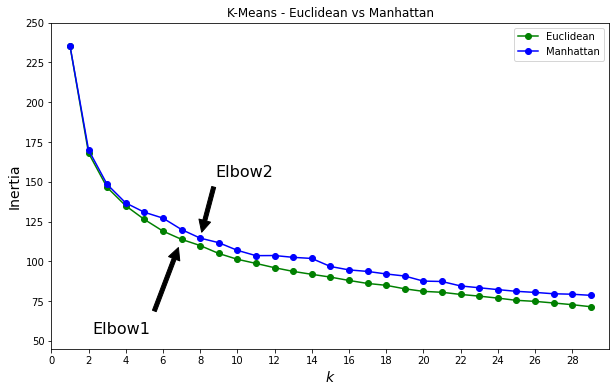

In [25]:
# plot the inertias for both k-means euclidean and manhattan using the plot_2elbow function
plot_2elbow(inertias_euclidean,inertias_manhattan,k_range,elbow1=7,elbow2=8,ymin=45,ymax=250, 
           xtext1=0.15, ytext1=0.15, xtext2=0.35, ytext2=0.55, title="K-Means - Euclidean vs Manhattan")

### Second evaluation 

**The Silhouette Method**  
the silhouette coefficient, ranges from -1 (bad) to 1 (good), measures the compactness of a cluster to which a point belongs and the separation of that point from all other clusters (and the silhouette score is the mean silhouette coefficient over all points in the data).

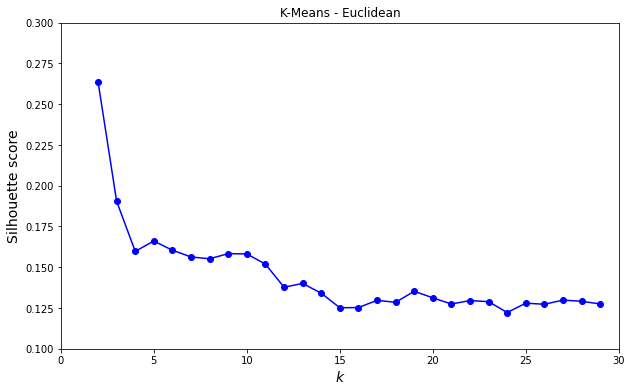

Silhouette scores (k=5): 0.1661
Silhouette scores (k=6): 0.1604
Silhouette scores (k=7): 0.1563
Silhouette scores (k=8): 0.1552
Silhouette scores (k=9): 0.1584
Silhouette scores (k=10): 0.1582


In [26]:
# plot the silhouette scores for kmeans with Euclidean distance (k=2-29) using calc_and_plot_silhouette function
ss_au = calc_and_plot_silhouette(X1_data, 'eucledian', labels_euclidean, k_range, ymin=0.1, ymax=0.3, model=kmeans_euclidean, title="K-Means - Euclidean")
# print the good result(s)
print("Silhouette scores (k=5): {:.04f}".format(ss_au[3]))
print("Silhouette scores (k=6): {:.04f}".format(ss_au[4]))
print("Silhouette scores (k=7): {:.04f}".format(ss_au[5]))
print("Silhouette scores (k=8): {:.04f}".format(ss_au[6]))
print("Silhouette scores (k=9): {:.04f}".format(ss_au[7]))
print("Silhouette scores (k=10): {:.04f}".format(ss_au[8]))

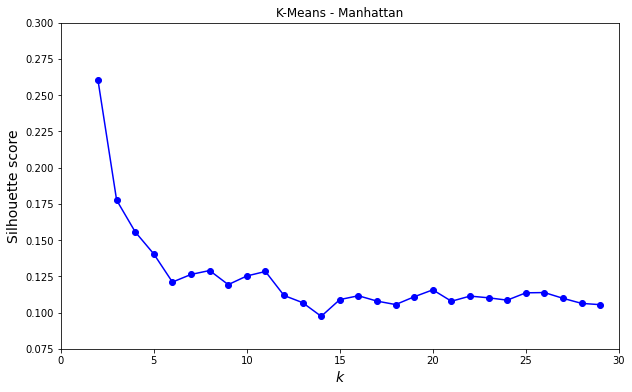

Silhouette scores (k=5): 0.1404
Silhouette scores (k=6): 0.1210
Silhouette scores (k=7): 0.1263
Silhouette scores (k=8): 0.1290
Silhouette scores (k=9): 0.1193
Silhouette scores (k=10): 0.1252
Silhouette scores (k=11): 0.1284


In [27]:
# plot the silhouette scores for kmeans with Manhattan distance (k=2-29) using calc_and_plot_silhouette function
ss_man = calc_and_plot_silhouette(X1_data, 'manhattan', labels_manhattan, k_range2, ymin=0.075, ymax=0.3, title="K-Means - Manhattan")
# print the good result(s)
print("Silhouette scores (k=5): {:.04f}".format(ss_man[3]))
print("Silhouette scores (k=6): {:.04f}".format(ss_man[4]))
print("Silhouette scores (k=7): {:.04f}".format(ss_man[5]))
print("Silhouette scores (k=8): {:.04f}".format(ss_man[6]))
print("Silhouette scores (k=9): {:.04f}".format(ss_man[7]))
print("Silhouette scores (k=10): {:.04f}".format(ss_man[8]))
print("Silhouette scores (k=11): {:.04f}".format(ss_man[9]))

Unfortunately, all models produced low silhouette scores (less than 0.2 for k>=3), though the silhouette coefficient plots showed quite well separated clusters for k=7 and k=8.


Average silhouette score (model 1): 0.1905
Average silhouette score (model 2): 0.1775


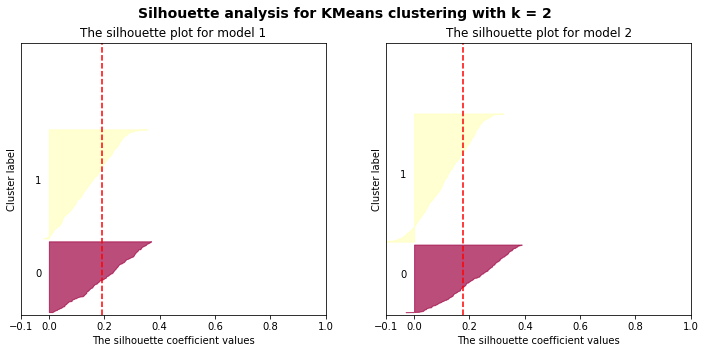


Average silhouette score (model 1): 0.1597
Average silhouette score (model 2): 0.1556


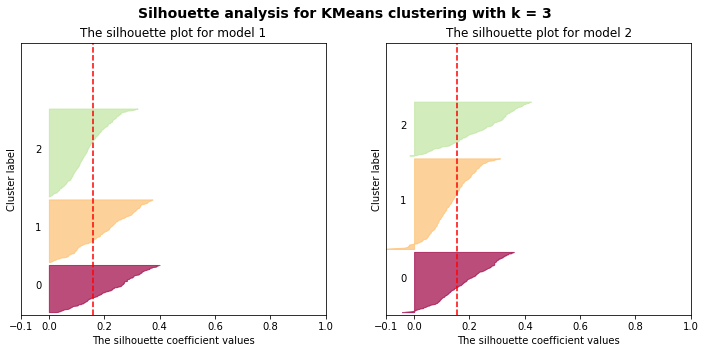


Average silhouette score (model 1): 0.1661
Average silhouette score (model 2): 0.1404


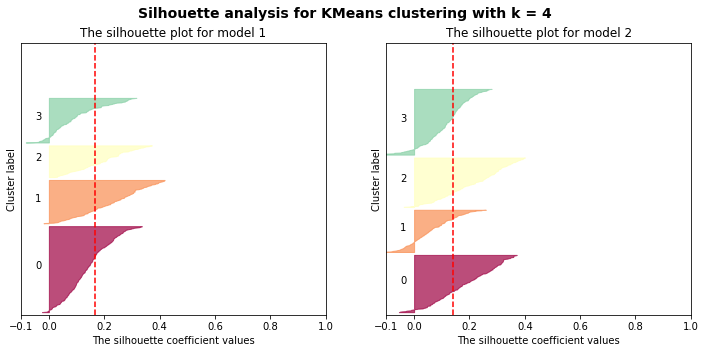


Average silhouette score (model 1): 0.1604
Average silhouette score (model 2): 0.1210


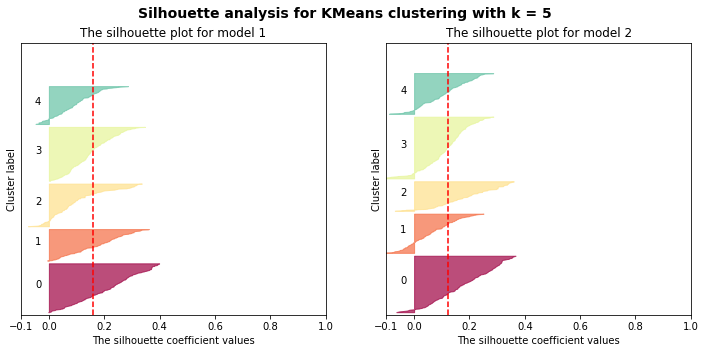


Average silhouette score (model 1): 0.1563
Average silhouette score (model 2): 0.1263


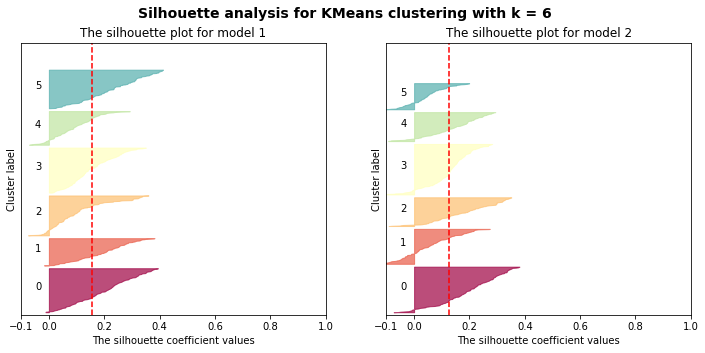


Average silhouette score (model 1): 0.1552
Average silhouette score (model 2): 0.1290


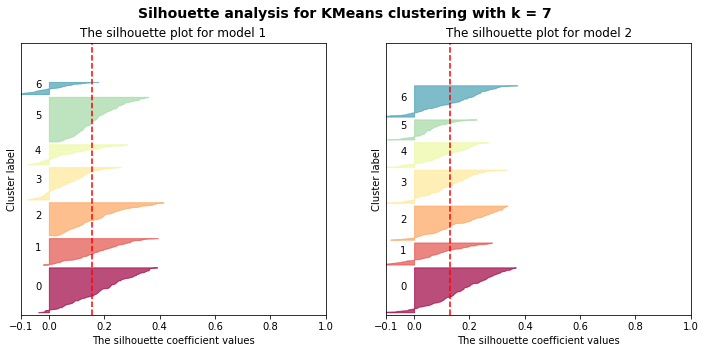


Average silhouette score (model 1): 0.1584
Average silhouette score (model 2): 0.1193


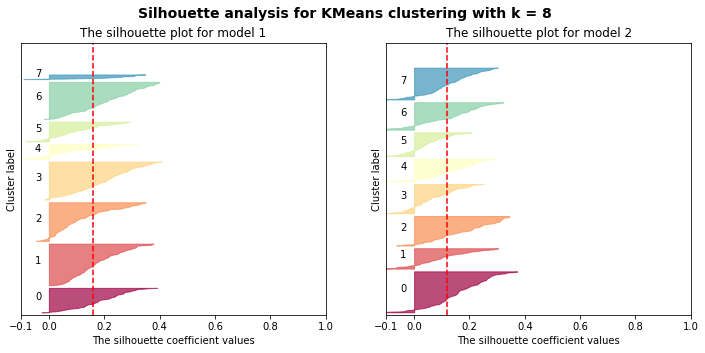


Average silhouette score (model 1): 0.1582
Average silhouette score (model 2): 0.1252


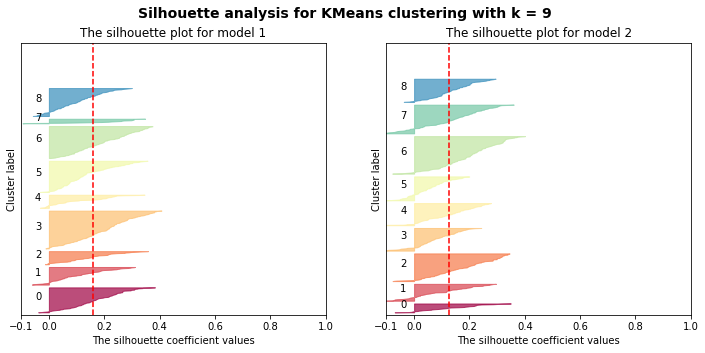


Average silhouette score (model 1): 0.1519
Average silhouette score (model 2): 0.1284


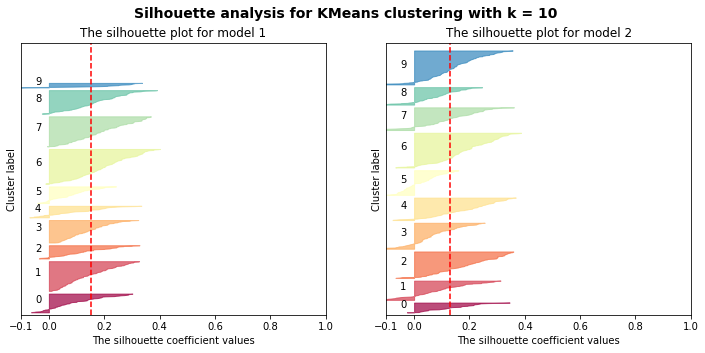


Average silhouette score (model 1): 0.1378
Average silhouette score (model 2): 0.1118


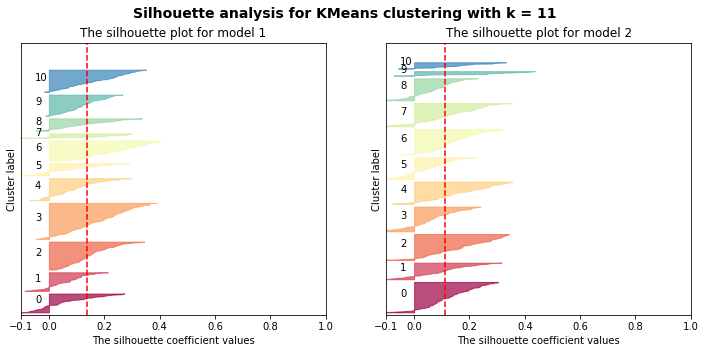


Average silhouette score (model 1): 0.1401
Average silhouette score (model 2): 0.1068


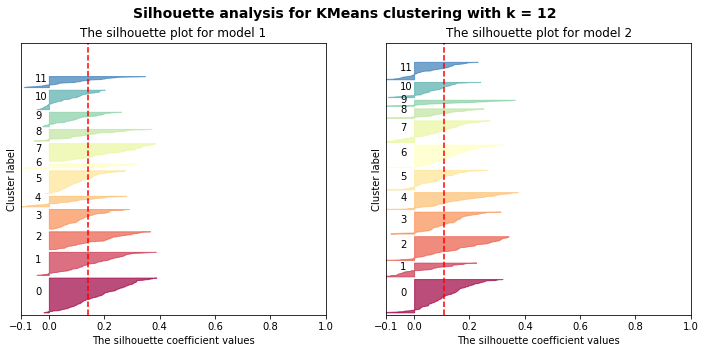

In [28]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k-means euclidean vs manhattan for k=2-12
plot_silhouette(X1_data, no_cluster=12, labels1=labels_euclidean, labels2=labels_manhattan)

### Third evaluation 

**The Davies-Bouldin Score and the Calinksi-Harabasz Score**  
The Davies-Bouldin score measures the average ‘similarity’ between clusters, as defined by the distance between clusters with the size of the clusters (a lower score, close to 0, indicates better separation between the clusters). The Calinksi-Harabasz score measures the ratio between the within and the between-cluster dispersions (higher score means dense and well separated clusters).

In [29]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# create empty lists for each variable
ks = []
dbs_euclideans = []
dbs_manhattans = []
chs_euclideans = []
chs_manhattans = []

# use for-loop to iterate and calculate the scores for k=2-15
for k in range(1, 15):
  dbse = davies_bouldin_score(X1_data,labels_euclidean[k])
  dbsm = davies_bouldin_score(X1_data,labels_manhattan[k])
  chse = calinski_harabasz_score(X1_data,labels_euclidean[k])
  chsm = calinski_harabasz_score(X1_data,labels_manhattan[k])
  # store the k's and the results in the list for plotting
  ks.append(k+1)
  dbs_euclideans.append(dbse)
  dbs_manhattans.append(dbsm)
  chs_euclideans.append(chse)
  chs_manhattans.append(chsm)

# convert them into a dataframe using pandas
df_scores = pd.DataFrame({"k":ks, "dbs_euclidean":dbs_euclideans, 
                          "dbs_manhattan":dbs_manhattans, 
                          "chs_euclidean":chs_euclideans, 
                          "chs_manhattan":chs_manhattans})
df_scores

,k,dbs_euclidean,dbs_manhattan,chs_euclidean,chs_manhattan
0,2,1.436956,1.440336,393.085984,377.090864
1,3,1.775837,1.788993,297.584123,287.474103
2,4,1.934513,2.014551,242.975834,235.496125
3,5,1.745027,2.109233,210.921517,195.257027
4,6,1.792986,2.242149,191.006218,166.193298
5,7,1.755151,2.139070,173.626042,156.373991
6,8,1.805458,1.998823,158.840353,146.704953
7,9,1.637260,2.052955,151.213685,134.672117
8,10,1.633089,1.922064,143.011408,129.803182
9,11,1.684360,1.887406,134.502174,123.599305


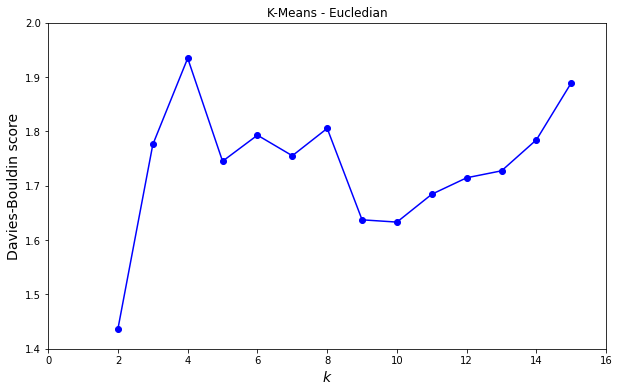

In [30]:
# plot the Davies-Bouldin scores for k-means euclidean using plot_davies function (for k=2-15)
plot_davies(dbs_euclideans, k_range=16, ymin=1.4, ymax=2, title='K-Means - Eucledian')

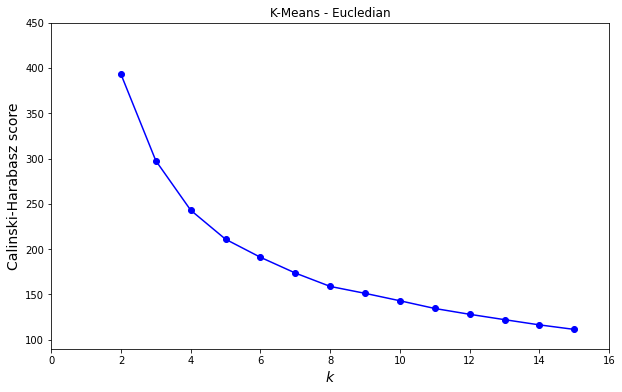

In [31]:
# plot the Calinski-Harabasz scores for k-means euclidean using plot_calinski function (for k=2-15)
plot_calinski(chs_euclideans, k_range=16, ymin=90, ymax=450, title='K-Means - Eucledian')

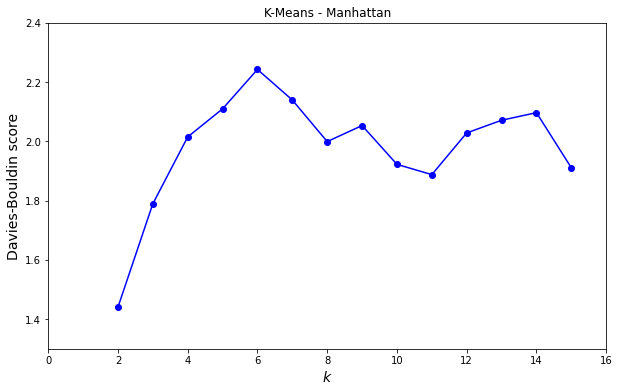

In [32]:
# plot the Davies-Bouldin scores for k-means manhattan using plot_davies function (for k=2-15)
plot_davies(dbs_manhattans, k_range=16, ymin=1.3, ymax=2.4, title='K-Means - Manhattan')

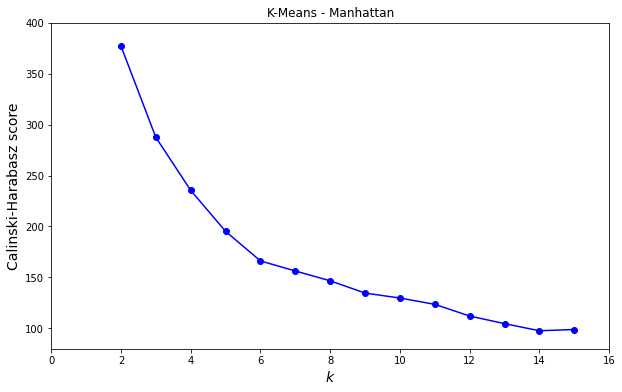

In [33]:
# plot the Calinski-Harabasz scores for k-means manhattan using plot_calinski function (for k=2-15)
plot_calinski(chs_manhattans, k_range=16, ymin=80, ymax=400, title='K-Means - Manhattan')

Overall, the Euclideans produced better separated clusters than the Manhattans (as indicated by the lower Davies-Bouldin scores). Ignoring k=2-3, the Euclideans produced the lowest score at k=9 (1.64) and Manhattan at k=11 (1.89). Similarly, the Calinksi-Harabasz scores suggested the Euclideans formed more dense and better separated clusters than the Manhattans, though the scores were decreasing as k was increased.

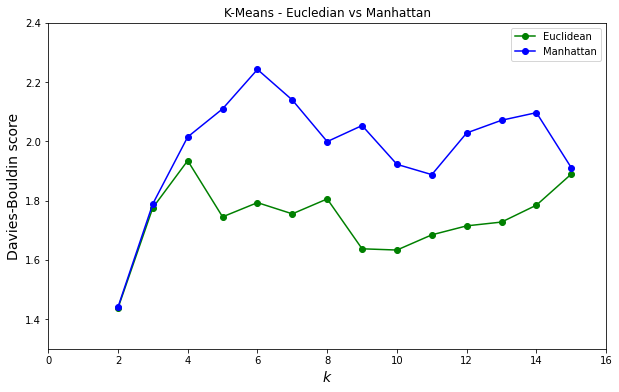

In [34]:
# plot the Davies-Bouldin scores for k-means euclidean vs manhattan (for k=2-15)
plot_2davies(dbs_euclideans, dbs_manhattans, k_range=16, ymin=1.3, ymax=2.4, title='K-Means - Eucledian vs Manhattan')

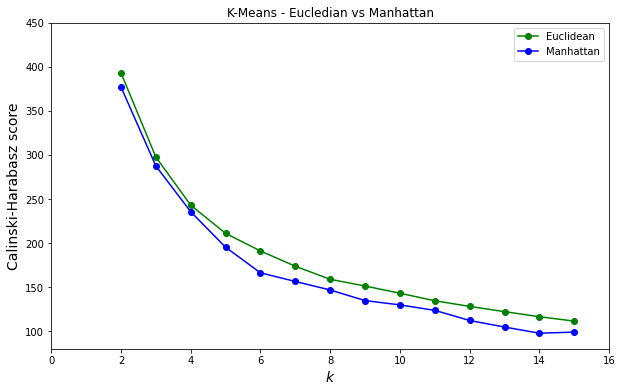

In [35]:
# plot the Calinski-Harabasz scores for k-means euclidean vs manhattan (for k=2-15)
plot_2calinski(chs_euclideans, chs_manhattans, k_range=16, ymin=80, ymax=450, title='K-Means - Eucledian vs Manhattan')

### Plot clusters

**t-SNE projections**  
The k-means models plot reasonably well on the t-SNE projections. Whilst not perfect, the clusters formed were quite dense and reasonably well separated, especially for the Euclidean.

CPU times: user 2 µs, sys: 2 µs, total: 4 µs
Wall time: 7.39 µs


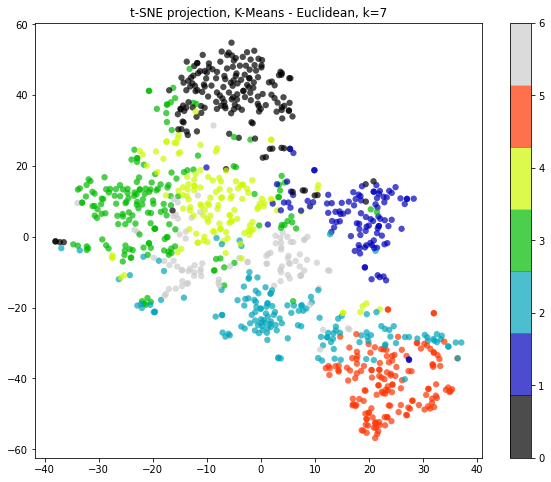

In [36]:
# use tSNE projection to plot the clusters for k-means euclidean, k=7
plot_tsne(X1_data,k=7,label=labels_euclidean[6], title='K-Means - Euclidean')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


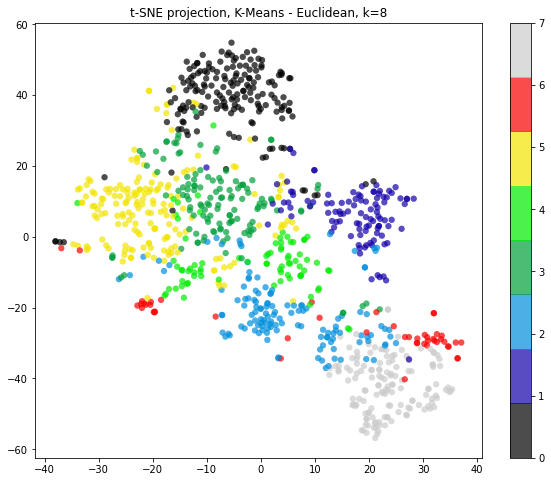

In [37]:
# use tSNE projection to plot the clusters for k-means euclidean, k=8
plot_tsne(X1_data,k=8,label=labels_euclidean[7], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.87 µs


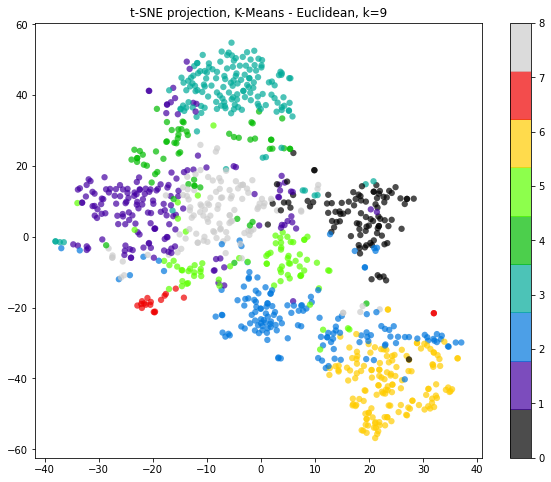

In [38]:
# use tSNE projection to plot the clusters for k-means euclidean, k=9
plot_tsne(X1_data,k=9,label=labels_euclidean[8], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 18.4 µs


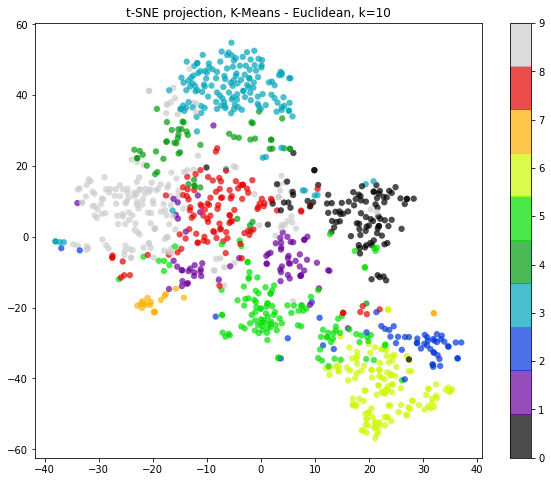

In [39]:
# use tSNE projection to plot the clusters for k-means euclidean, k=10
plot_tsne(X1_data,k=10,label=labels_euclidean[9], title='K-Means - Euclidean')

CPU times: user 5 µs, sys: 1e+03 ns, total: 6 µs
Wall time: 12.4 µs


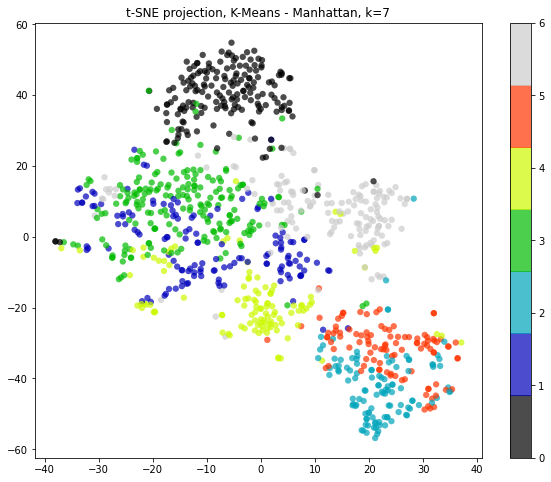

In [40]:
# use tSNE projection to plot the clusters for k-means manhattan, k=7
plot_tsne(X1_data,k=7,label=labels_manhattan[6], title='K-Means - Manhattan')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 8.11 µs


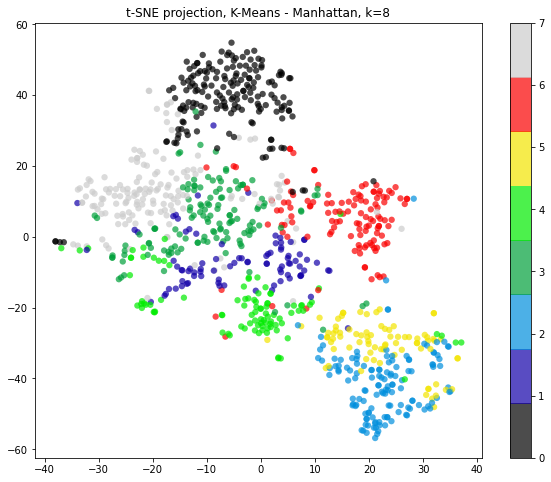

In [41]:
# use tSNE projection to plot the clusters for k-means manhattan, k=8
plot_tsne(X1_data,k=8,label=labels_manhattan[7], title='K-Means - Manhattan')

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 7.63 µs


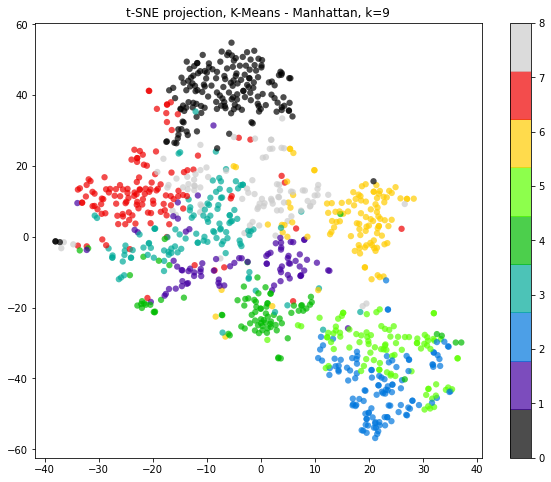

In [42]:
# use tSNE projection to plot the clusters for k-means manhattan, k=9
plot_tsne(X1_data,k=9,label=labels_manhattan[8], title='K-Means - Manhattan')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


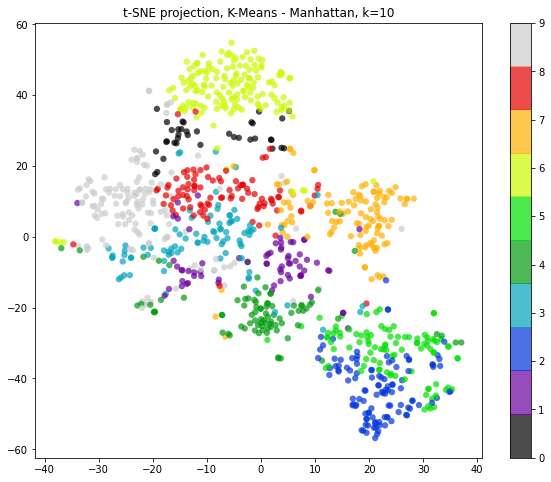

In [43]:
# use tSNE projection to plot the clusters for k-means manhattan, k=10
plot_tsne(X1_data,k=10,label=labels_manhattan[9], title='K-Means - Manhattan')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


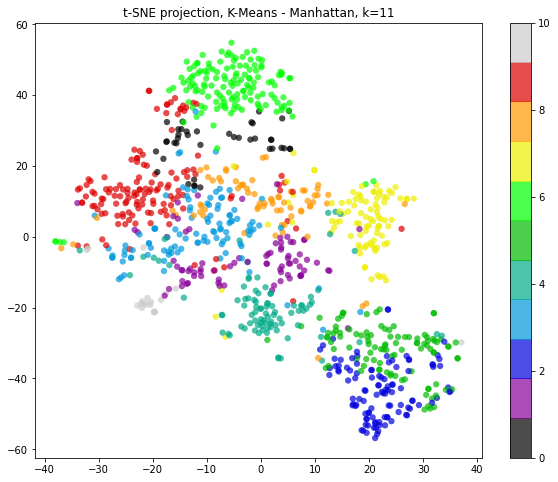

In [44]:
# use tSNE projection to plot the clusters for k-means manhattan, k=11
plot_tsne(X1_data,k=11,label=labels_manhattan[10], title='K-Means - Manhattan')

## 2.2 ICMLA Dataset

### Functions

In [0]:
# function to turn off deprecation warning
# refer to the following for more detail:
# https://docs.python.org/3/library/warnings.html
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

# function for data preprocessing using TfidfVectorizer
def transvector2(X,max,min):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.metrics.pairwise import cosine_similarity
  import seaborn as sns

  tfidf_vectorizer = TfidfVectorizer(max_df=max, max_features=200000,
                                  min_df=min, stop_words='english',
                                  use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))

  tfidf_matrix = tfidf_vectorizer.fit_transform(X)
  return (1 - cosine_similarity(tfidf_matrix))

# function to train k-means clustering using manhattan/cosine/euclidean distance
from sklearn.metrics import pairwise_distances_argmin

# function to train k-means clustering using manhattan/cosine/euclidean distance
from sklearn.metrics import pairwise_distances_argmin

def find_clusters(X, metric, n_clusters, rseed=2):
    # 1. Randomly choose clusters
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]
    
    while True:
        # 2a. Assign labels based on closest center (E-Step)
        # metric can be  'cosine', 'euclidean', 'manhattan'
        labels = pairwise_distances_argmin(X, centers, metric=metric)
        
        # 2b. Find new centers from means of points (M-Step)
        new_centers = np.array([X[labels == i].mean(0)
                                for i in range(n_clusters)])

        # 2c. Check for convergence
        if np.all(centers == new_centers):
            break
        centers = new_centers
    
    # calculate inertia (the sum of squared errors between each point and its cluster centroid)
    # use zip to pair X and labels, then use for loop to iterate over them to calc the inertia
    # please refer to https://scikit-learn.org/stable/modules/clustering.html for further detail about inertia
    inertias = sum(((centers[label] - x)**2).sum()
                    for x, label in zip(X, labels))

    return centers, labels, inertias

# function for plotting the silhouette coefficients for each k
# this code was adopted from COMP5310 - Principles of Data Science tutorial,
# week 8 by Dr Ali Anaissi, and adjusted for this assignment
def plot_silhouette2(X, no_cluster, labels1, labels2):
  from sklearn.metrics import silhouette_samples
  from sklearn.metrics import silhouette_score

  import matplotlib.cm as cm
  range_n_clusters = range(19,no_cluster+1)

  for n_clusters in range_n_clusters:
      # Create a subplot with 1 row and 2 columns
      fig, (ax1, ax2) = plt.subplots(1, 2)
      fig.set_size_inches(12, 5)

      # The 1st subplot is the silhouette plot for model 1
      # The silhouette coefficient can range from -1, 1 but in this example we
      # only plot within [-0.1, 1]
      ax1.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      cluster_labels = labels1[n_clusters]

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print("\nAverage silhouette score (model 1): {:.4f}".format(silhouette_avg))

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.Spectral(float(i) / n_clusters)
          ax1.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for model 1")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhoutte score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      # The 2nd subplot is the silhouette plot for model 2
      # The silhouette coefficient can range from -1, 1 but in this example we
      # only plot within [-0.1, 1]
      ax2.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax2.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      cluster_labels = labels2[n_clusters]

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print("Average silhouette score (model 2): {:.4f}".format(silhouette_avg))

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.Spectral(float(i) / n_clusters)
          ax2.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax2.set_title("The silhouette plot for model 2")
      ax2.set_xlabel("The silhouette coefficient values")
      ax2.set_ylabel("Cluster label")

      # The vertical line for average silhoutte score of all the values
      ax2.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax2.set_yticks([])  # Clear the yaxis labels / ticks
      ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      plt.suptitle(("Silhouette analysis for KMeans clustering "
                    "with k = %d" % n_clusters),
                  fontsize=14, fontweight='bold')

      plt.show()

# function to plot completeness using matplotlib
def plot_completeness2(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(np.arange(2, k_range, 2), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Completeness score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

# function to plot homogeneity using matplotlib
def plot_homogeneity2(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(np.arange(2, k_range, 2), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Homogeneity score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=''):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=42)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train K-means clustering  

Note that the below code takes a while to run. It is used to determine the optimum max_df and min_df parameters in the TfidfVectorizer as measured by the completeness and homogeneity scores. **You can skip this code if you don't want to wait for too long.**

In [46]:
# trying differnt min and max df
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, completeness_score, homogeneity_score

# set the maximum values as zero
accu_max = 0
complete_max = 0
homo_max = 0

# set the range of max_df and min_df that we want to test
max_range = np.arange(0.7,1,0.01)
min_range = np.arange(0,0.3,0.01)

# use for-loop to iterate the above max and min values
for max in max_range:
  for min in min_range:
    # use transvector2 function to vectorize the text data using selected
    # min and max values
    X = transvector2(X2_combine,max,min) 
    # tried different X's, X_combine gave the highest scores

    # use PCA to analyse how many features are required to
    # explain 90% of the variance in the data
    pca = PCA()
    pca.fit(X)
    var = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3))
    for n, v in enumerate(var):
      if v>0.9:
        n_comp = n+1
        break

    # use PCA to reduce the number of features
    pca = PCA(n_components=n_comp)
    pca.fit(X)
    X_pca = pca.transform(X)

    # fit the k-means euclidean model for k=24
    k = 24
    X_data = X_pca
    kmeans_euclidean224 = KMeans(n_clusters=k, random_state=42)
    kmeans_euclidean224.fit(X_data)
    y_kmeans_euclidean224 = kmeans_euclidean224.predict(X_data)

    # calculate the accuracy and store the max amount
    accu = accuracy_score(y2, y_kmeans_euclidean224)
    if accu>accu_max:
      accu_max = accu
      max_accu = max
      min_accu = min
      
    # calculate the completeness score and store the max amount
    complete = completeness_score(y2, y_kmeans_euclidean224)
    if complete>complete_max:
      complete_max = complete
      max_c = max
      min_c = min
    
    # calculate the homogeneity score and store the max amount
    homogeneity = homogeneity_score(y2, y_kmeans_euclidean224)
    if homogeneity>homo_max:
      homo_max = homogeneity
      max_h = max
      min_h = min
      
# print the results
print("Accuracy: {:.4f}".format(accu_max))
print("max:{:.4f}".format(max_accu))
print("min:{:.4f}".format(min_accu))

print("Completeness: {:.4f}".format(complete_max))
print("max:{:.4f}".format(max_c))
print("min:{:.4f}".format(min_c))

print("Homogeneity: {:.4f}".format(homo_max))
print("max:{:.4f}".format(max_h))
print("min:{:.4f}".format(min_h))

Accuracy: 0.1714
max:0.7100
min:0.0300
Completeness: 0.6056
max:0.8100
min:0.0800
Homogeneity: 0.5974
max:0.8100
min:0.0800


Ninety eight k-means models were trained on Dataset 2 using k=1-49 and two distance measures. The Euclidean distance was again used as the base metric. Here, the Cosine metric was used as a comparison as it tends to work well with text or sparse data (even if two points were far away by the Euclidean distance, they might still be considered close by this distance measure if the angle between the two points was narrow).  

The ‘combine’ column, which included texts from ‘keywords’, ‘title’, ‘abstract’, was used as the X input because it gave the best overall outcome in our testing.

In [0]:
# train k-means clustering using euclidean distance and different number of k's
k_range = 50 # set the number of k's
X_data = X_combine_pca # use combine_PCA data

# use sklearn k-means to fit k-means using euclidean distance measure (k=1-49)
from sklearn.cluster import KMeans
kmeans_euclidean2 = [KMeans(n_clusters=k, random_state=42).fit(X_data) for k in range(1, k_range)]

# obtain the labels
labels_euclidean2 = [model.fit_predict(X_data) for model in kmeans_euclidean2]

# obtain the inertias
inertias_euclidean2 = [model.inertia_ for model in kmeans_euclidean2]

In [0]:
# train k-means using euclidean distance measure with k=24 clusters
# to be compred with the gold clusters (24 clusters)
k = 24
kmeans_euclidean224 = KMeans(n_clusters=k, random_state=42)
labels_euclidean224 = kmeans_euclidean224.fit_predict(X_data)

In [0]:
# train k-means clustering using cosine distance and different number of k's
k_range2 = 50 # set the number of k's
X_data2 = X_combine_pca # use combine_PCA data

# use try-except to catch error when processing data. depending on the data, 
# sometimes the cosine can be unstable and generating NaN values
# https://www.w3schools.com/python/python_try_except.asp
try:
  # use find_clusters function to fit the k-means using cosine distance measure
  clusters_cosine2 = [find_clusters(X_data2, 'cosine', n_clusters=k)
                  for k in range(1, k_range2)]
 
  # obtain the centroid
  centers_cosine2 = [clusters_cosine2[k][0] for k in range(0, k_range2-1)]

  # obtain the labels
  labels_cosine2 = [clusters_cosine2[k][1] for k in range(0, k_range2-1)]

  # obtain the inertias
  inertias_cosine2 = [clusters_cosine2[k][2] for k in range(0, k_range2-1)]
except:
  print("Unable to generate clusters. Please try different X_data2 or different distance measure.")

In [0]:
# train k-means using cosine distance measure with k=24 clusters
# to be compared with the gold clusters (24 clusters)
clusters_cosine2c24 = find_clusters(X_data2, 'cosine', 24)

centers_cosine2c24 = clusters_cosine2c24[0]
labels_cosine2c24 = clusters_cosine2c24[1]
inertias_cosine2c24 = clusters_cosine2c24[2]

### First evaluation

**The Silhouette Method**  
the silhouette coefficient, ranges from -1 (bad) to 1 (good), measures the compactness of a cluster to which a point belongs and the separation of that point from all other clusters (and the silhouette score is the mean silhouette coefficient over all points in the data).

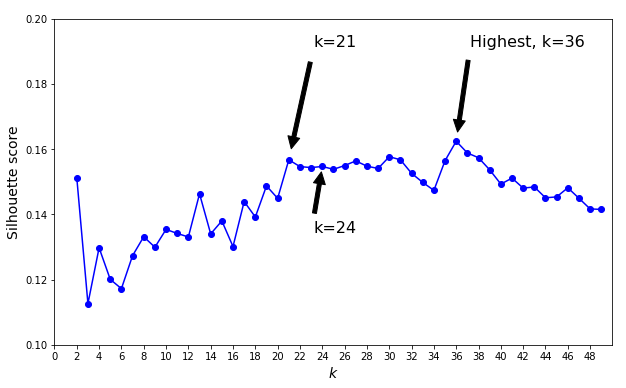

Silhouette scores (k=21): 0.1567
Silhouette scores (k=24): 0.1547
Silhouette scores (k=36): 0.1624


In [51]:
# kmeans with Euclidean distance
# using silhouette scores to detemine the number of k
from sklearn.metrics import silhouette_score
silhouette_scores_euclidean2 = [silhouette_score(X_data, model.labels_)
                     for model in kmeans_euclidean2[1:k_range]]

# plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, k_range), silhouette_scores_euclidean2, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.xticks(np.arange(0, k_range, step=2))
plt.axis([0, k_range, 0.10, 0.20])
plt.annotate('Highest, k=36', # show highest silhouette score
             xy=(36, silhouette_scores_euclidean2[34]),
             xytext=(0.75, 0.88),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.annotate('k=24', # show silhouette score for k=24
             xy=(24, silhouette_scores_euclidean2[22]),
             xytext=(0.5, 0.4),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.annotate('k=21', # show silhouette score for k=29
             xy=(21, silhouette_scores_euclidean2[19]),
             xytext=(0.5, 0.88),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.show()

# print the good result(s)
print("Silhouette scores (k=21): {:.04f}".format(silhouette_scores_euclidean2[19]))
print("Silhouette scores (k=24): {:.04f}".format(silhouette_scores_euclidean2[22]))
print("Silhouette scores (k=36): {:.04f}".format(silhouette_scores_euclidean2[34]))

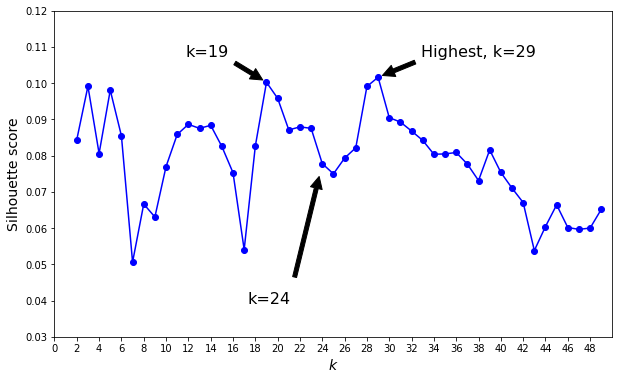

Silhouette scores (k=19): 0.1002
Silhouette scores (k=24): 0.0778
Silhouette scores (k=29): 0.1016


In [52]:
# kmeans with cosine distance
# using silhouette scores to detemine the number of k
from sklearn.metrics import silhouette_score
silhouette_scores_cosine2 = [silhouette_score(X_data2, labels_cosine2[k]) for k in range(1, 49)]

#plot_silhouette_scores(silhouette_scores_manhattan)
plt.figure(figsize=(10, 6))
plt.plot(range(2, 50), silhouette_scores_cosine2, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.xticks(np.arange(0, k_range2, step=2))
plt.axis([0, 50, 0.03, 0.12])
plt.annotate('Highest, k=29', # show highest silhouette score
             xy=(29, silhouette_scores_cosine2[27]),
             xytext=(0.68, 0.85),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.annotate('k=24', # show silhouette score for k=24
             xy=(24, silhouette_scores_cosine2[22]),
             xytext=(0.4, 0.2),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.annotate('k=19', # show silhouette score for k=19
             xy=(19, silhouette_scores_cosine2[17]),
             xytext=(0.3, 0.85),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.show()

# print the good result(s)
print("Silhouette scores (k=19): {:.04f}".format(silhouette_scores_cosine2[17]))
print("Silhouette scores (k=24): {:.04f}".format(silhouette_scores_cosine2[22]))
print("Silhouette scores (k=29): {:.04f}".format(silhouette_scores_cosine2[27]))


Average silhouette score (model 1): 0.1449
Average silhouette score (model 2): 0.0958


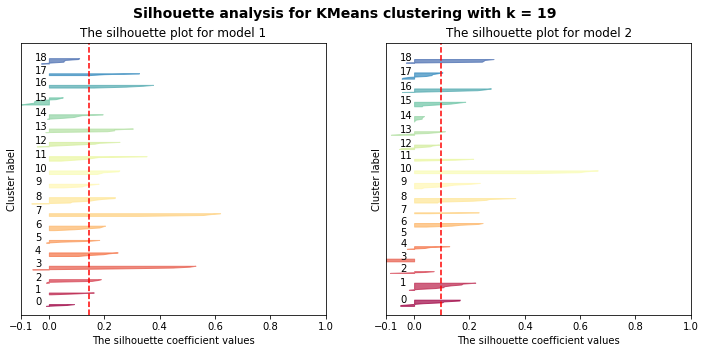


Average silhouette score (model 1): 0.1567
Average silhouette score (model 2): 0.0871


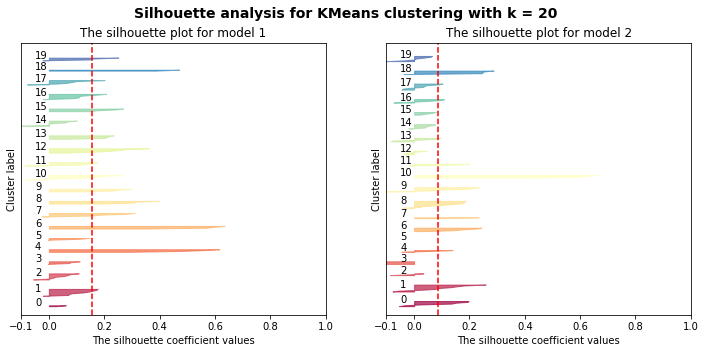


Average silhouette score (model 1): 0.1546
Average silhouette score (model 2): 0.0879


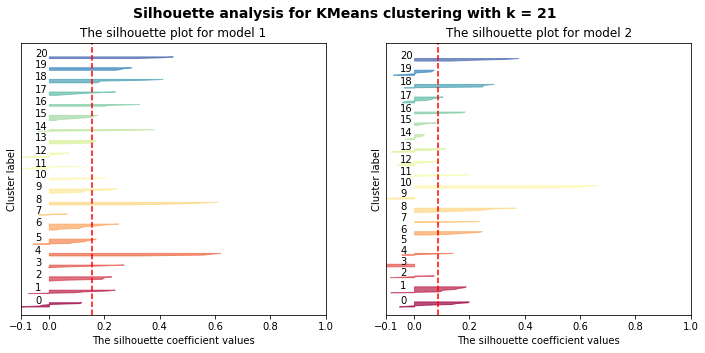


Average silhouette score (model 1): 0.1543
Average silhouette score (model 2): 0.0875


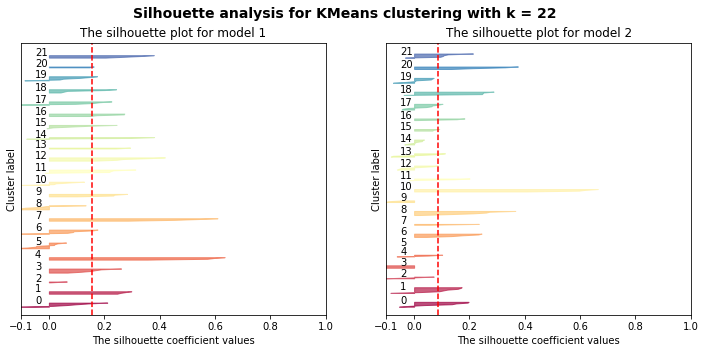


Average silhouette score (model 1): 0.1547
Average silhouette score (model 2): 0.0778


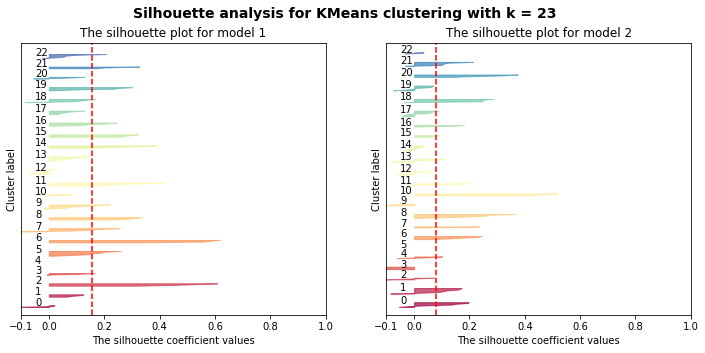


Average silhouette score (model 1): 0.1538
Average silhouette score (model 2): 0.0750


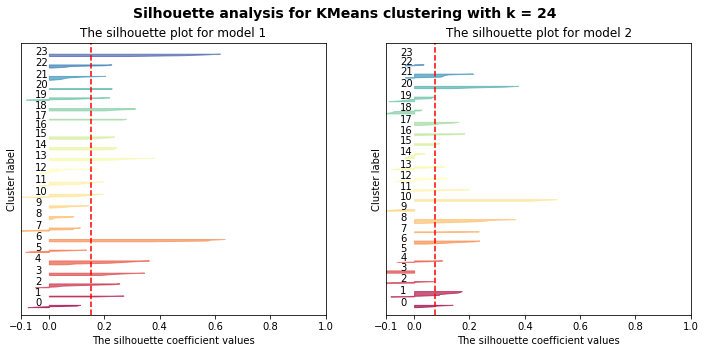


Average silhouette score (model 1): 0.1550
Average silhouette score (model 2): 0.0793


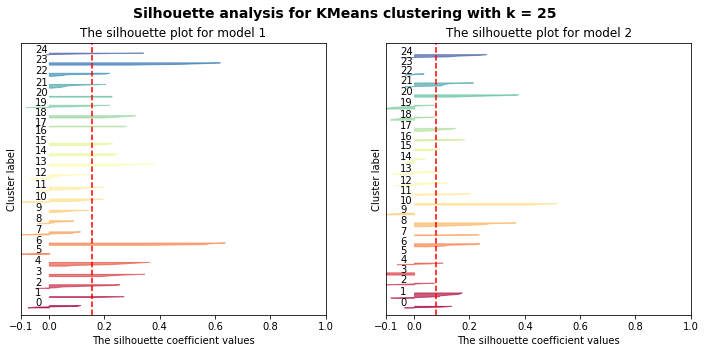


Average silhouette score (model 1): 0.1564
Average silhouette score (model 2): 0.0822


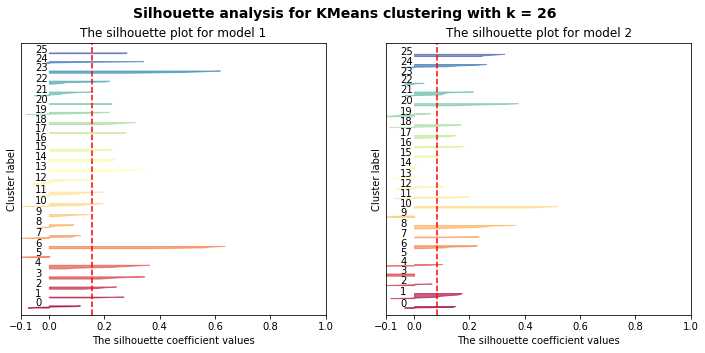


Average silhouette score (model 1): 0.1548
Average silhouette score (model 2): 0.0991


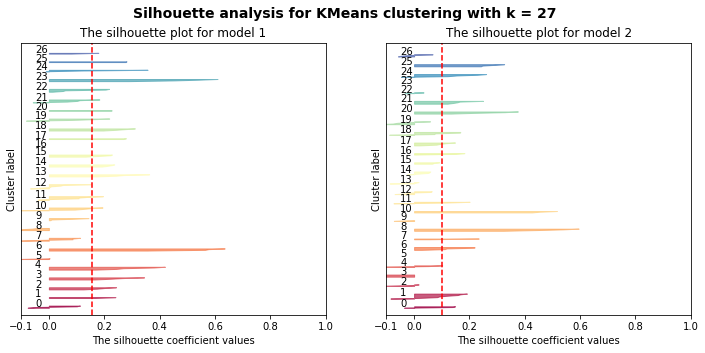


Average silhouette score (model 1): 0.1541
Average silhouette score (model 2): 0.1016


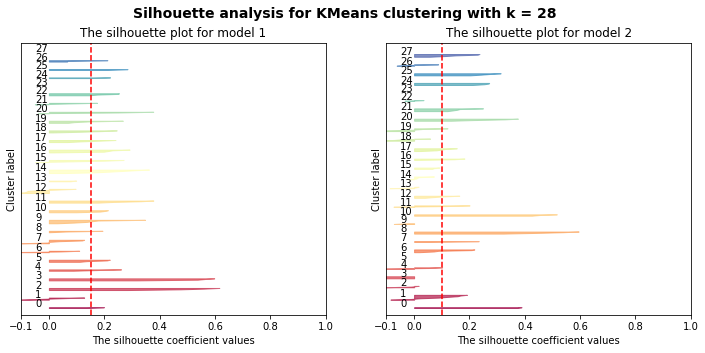


Average silhouette score (model 1): 0.1577
Average silhouette score (model 2): 0.0905


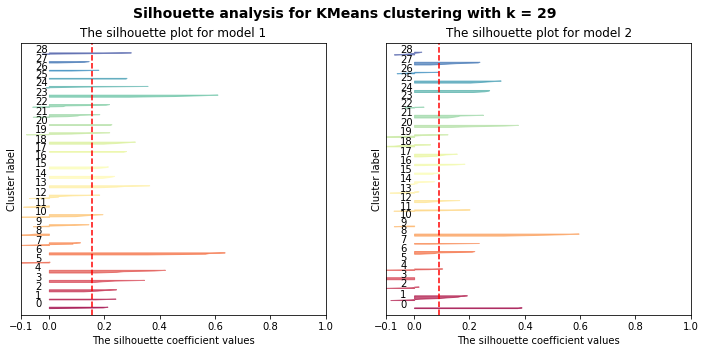


Average silhouette score (model 1): 0.1567
Average silhouette score (model 2): 0.0893


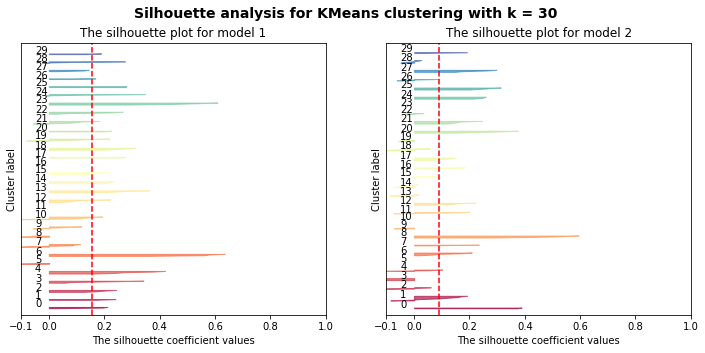


Average silhouette score (model 1): 0.1526
Average silhouette score (model 2): 0.0868


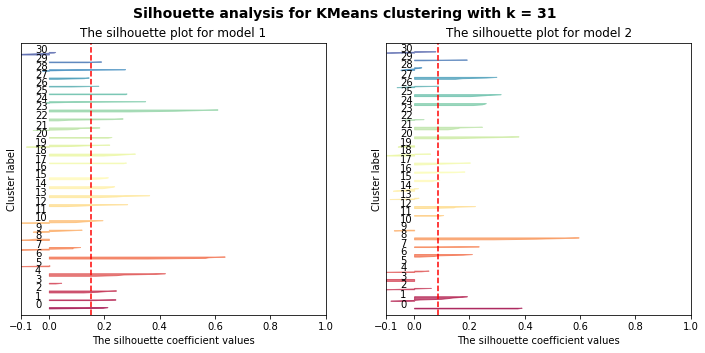


Average silhouette score (model 1): 0.1498
Average silhouette score (model 2): 0.0842


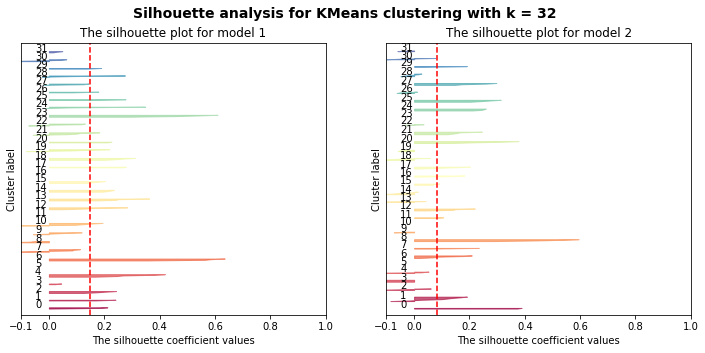


Average silhouette score (model 1): 0.1474
Average silhouette score (model 2): 0.0804


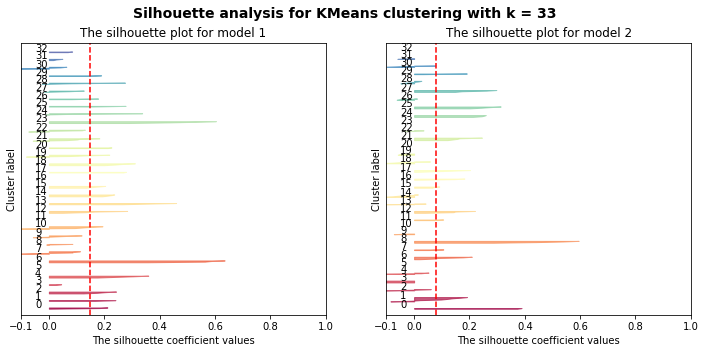


Average silhouette score (model 1): 0.1565
Average silhouette score (model 2): 0.0805


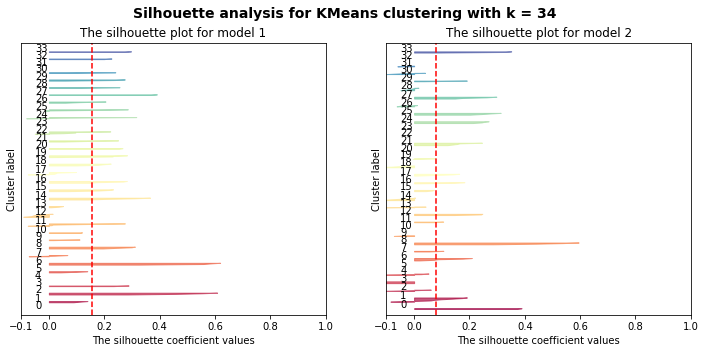


Average silhouette score (model 1): 0.1624
Average silhouette score (model 2): 0.0809


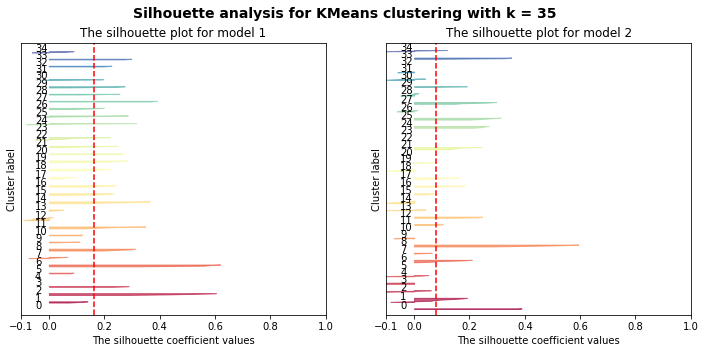


Average silhouette score (model 1): 0.1588
Average silhouette score (model 2): 0.0777


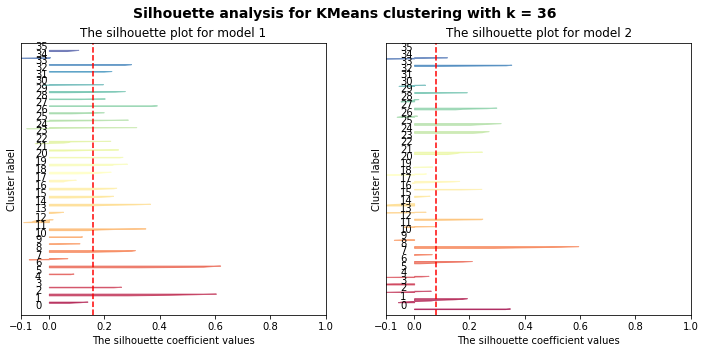

In [53]:
plot_silhouette2(X_data, 36, labels_euclidean2, labels_cosine2)

### Second evaluation 

**The Completeness Score**  
The completeness score measures the degree to which all points of a given class belong to the same cluster (a score of 1 means perfectly complete labeling).

In [54]:
# calculate the completeness and homogeneity scores for both models with k=2-48 (2 steps)
from  sklearn.metrics import completeness_score, homogeneity_score

# set an empty list for each variable
ks = []
complete_euclideans = []
complete_cosines = []
homo_euclideans = []
homo_cosines = []

# use for loop to calculate the scores for all k
for k in range(1, 49, 2):
  comp_eu = completeness_score(y2, labels_euclidean2[k])
  comp_co = completeness_score(y2, labels_cosine2[k])
  homo_eu = homogeneity_score(y2, labels_euclidean2[k])
  homo_co = homogeneity_score(y2, labels_cosine2[k])
  
  # store the k's and scores for each iteration in the list
  ks.append(k+1)
  complete_euclideans.append(comp_eu)
  complete_cosines.append(comp_co)
  homo_euclideans.append(homo_eu)
  homo_cosines.append(homo_co)

# create a dataframe using pandas to show the results
df_scores2 = pd.DataFrame({"k":ks, "completeness_euclidean":complete_euclideans, "completeness_cosines":complete_cosines, 
                           "homogeneity_euclideans":homo_euclideans, "homogeneity_cosines":homo_cosines})
df_scores2

,k,completeness_euclidean,completeness_cosines,homogeneity_euclideans,homogeneity_cosines
0,2,0.585970,0.306342,0.090153,0.066738
1,4,0.421106,0.357319,0.151228,0.152740
2,6,0.505761,0.434965,0.260263,0.241011
3,8,0.510553,0.516255,0.317248,0.325441
4,10,0.525276,0.481175,0.365347,0.334768
5,12,0.542419,0.523547,0.419864,0.398371
6,14,0.518510,0.545460,0.420758,0.446957
7,16,0.538494,0.552170,0.465632,0.476606
8,18,0.570144,0.565922,0.505076,0.500566
9,20,0.560604,0.561677,0.523101,0.516710


Overall, the scores indicated that the clusters produced by the Euclideans were more complete and homogeneous. This in in line with the labelling, where more data points from the same session such as Neural Networks I and II were grouped together by the Euclidean, and more of its clusters contain only data points from a single class.

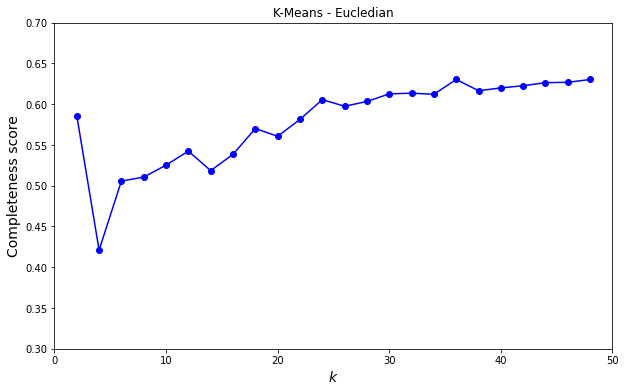

In [55]:
# plot the completeness scores for the k-means euclidean
plot_completeness2(complete_euclideans, k_range=50, ymin=0.3, ymax=0.7, title='K-Means - Eucledian')

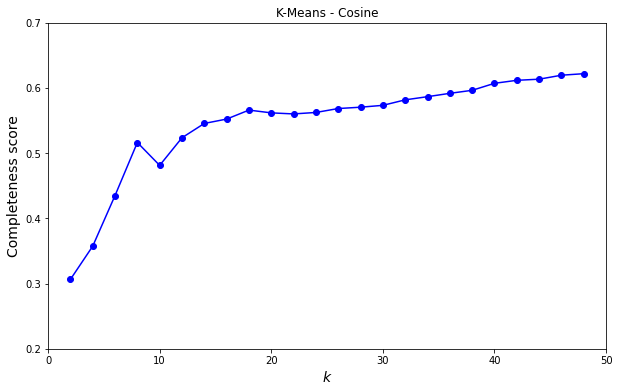

In [56]:
# plot the completeness scores for the k-means cosine
plot_completeness2(complete_cosines, k_range=50, ymin=0.2, ymax=0.7, title='K-Means - Cosine')

### Third evaluation

**The Homogeneity Score**  
The homogeneity score measures the degree to which all of the clusters contain only points of a single class (a score of 1 means perfectly homogeneous labeling).

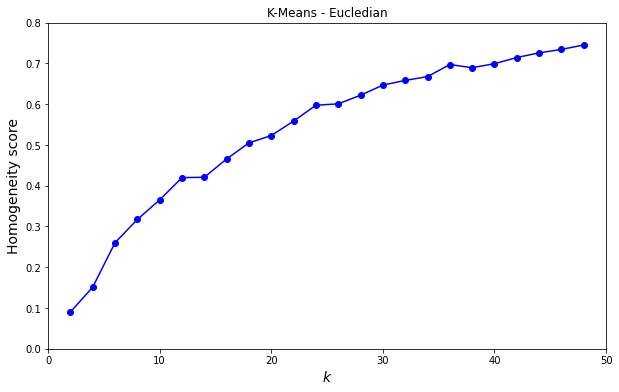

In [57]:
# plot the homogeneity scores for the k-means euclidean
plot_homogeneity2(homo_euclideans, k_range=50, ymin=0, ymax=0.8, title='K-Means - Eucledian')

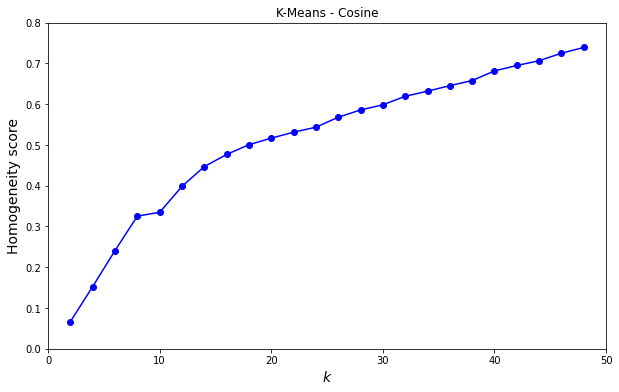

In [58]:
# plot the completeness scores for the k-means cosine
plot_homogeneity2(homo_cosines, k_range=50, ymin=0, ymax=0.8, title='K-Means - Cosine')

### Plot clusters

**t-SNE projections**  
On the t-SNE projections, both models showed well separated clusters at lower k’s, though as k gets larger, the additional clusters were harder to identify.  At k=24, the clusters produced by the Euclidean showed better separated clusters than the Cosine.

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


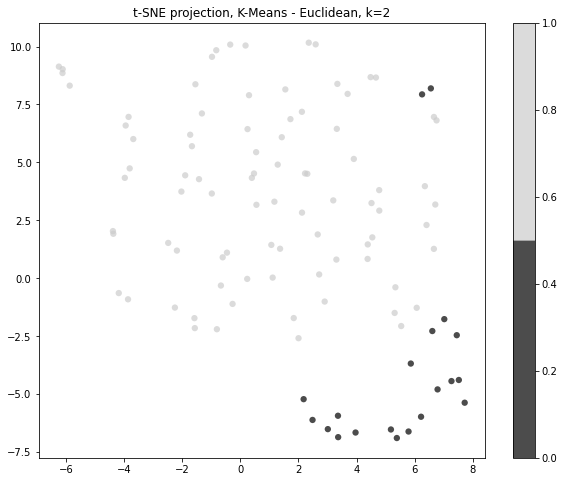

In [59]:
# use tSNE projection to plot the clusters for k-means euclidean, k=2
plot_tsne(X_data2,k=2,label=labels_euclidean2[1], title='K-Means - Euclidean')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


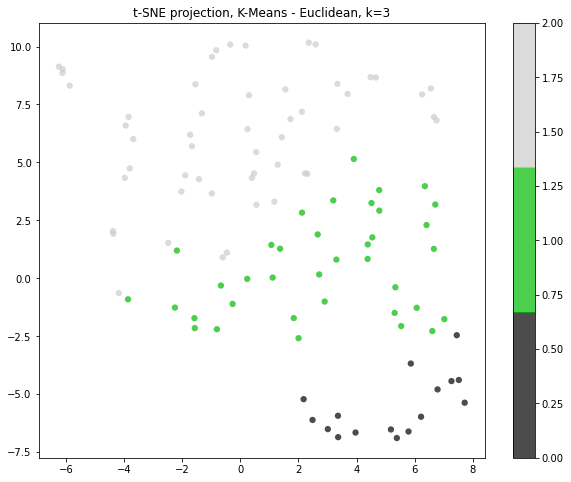

In [60]:
# use tSNE projection to plot the clusters for k-means euclidean, k=3
plot_tsne(X_data2,k=3,label=labels_euclidean2[2], title='K-Means - Euclidean')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.48 µs


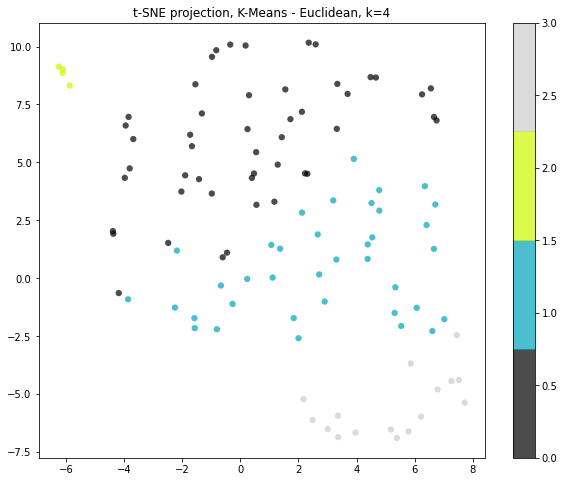

In [61]:
# use tSNE projection to plot the clusters for k-means euclidean, k=4
plot_tsne(X_data2,k=4,label=labels_euclidean2[3], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.44 µs


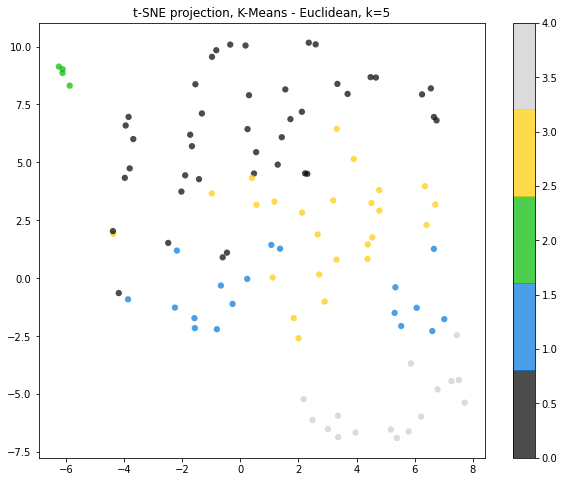

In [62]:
# use tSNE projection to plot the clusters for k-means euclidean, k=5
plot_tsne(X_data2,k=5,label=labels_euclidean2[4], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


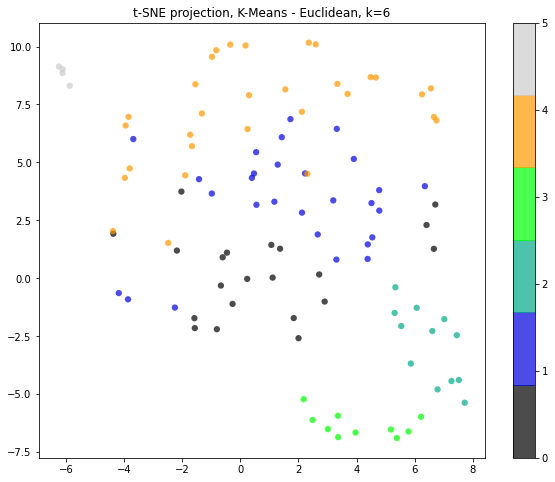

In [63]:
# use tSNE projection to plot the clusters for k-means euclidean, k=6
plot_tsne(X_data2,k=6,label=labels_euclidean2[5], title='K-Means - Euclidean')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.96 µs


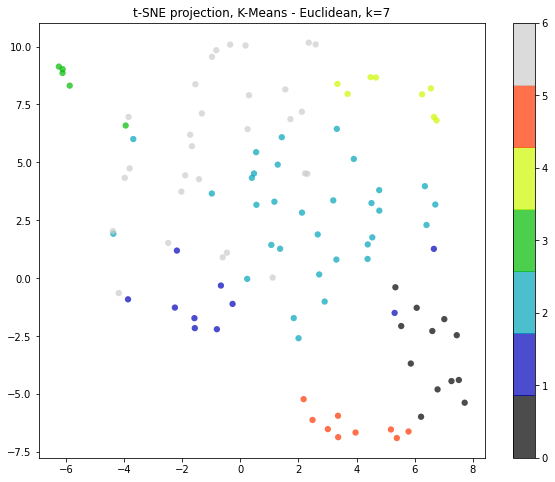

In [64]:
# use tSNE projection to plot the clusters for k-means euclidean, k=7
plot_tsne(X_data2,k=7,label=labels_euclidean2[6], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs


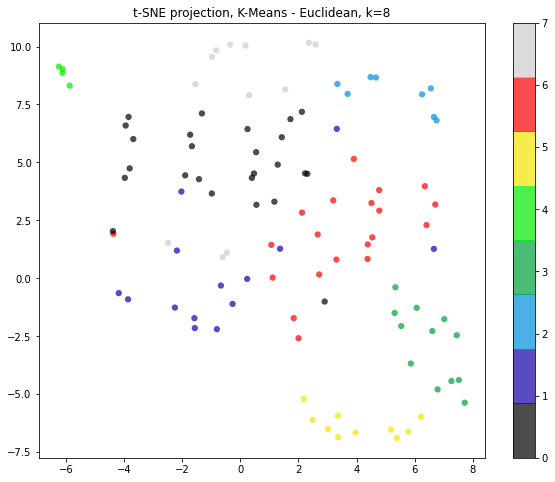

In [65]:
# use tSNE projection to plot the clusters for k-means euclidean, k=8
plot_tsne(X_data2,k=8,label=labels_euclidean2[7], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


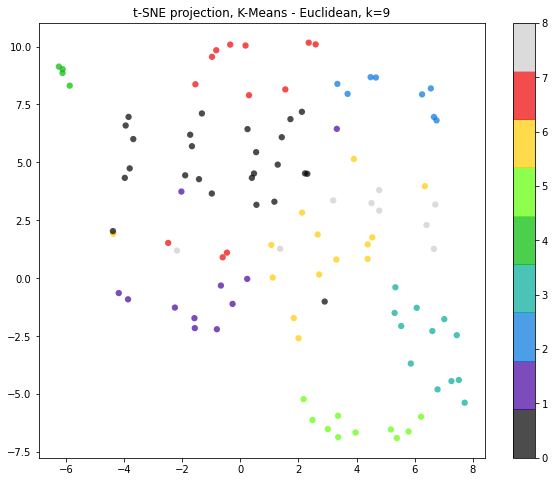

In [66]:
# use tSNE projection to plot the clusters for k-means euclidean, k=9
plot_tsne(X_data2,k=9,label=labels_euclidean2[8], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.39 µs


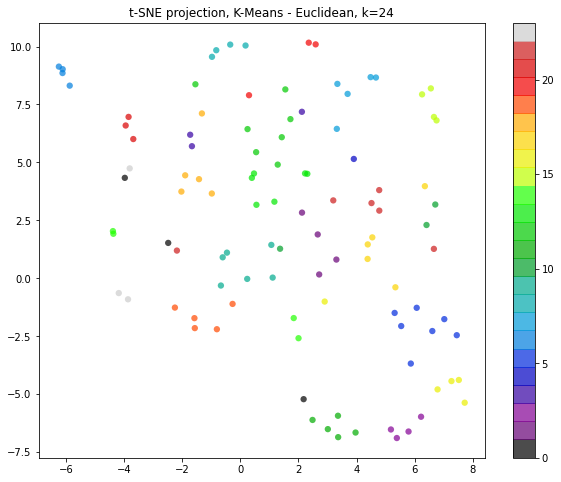

In [67]:
# use tSNE projection to plot the clusters for k-means euclidean, k=24
plot_tsne(X_data2,k=24,label=labels_euclidean2[23], title='K-Means - Euclidean')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


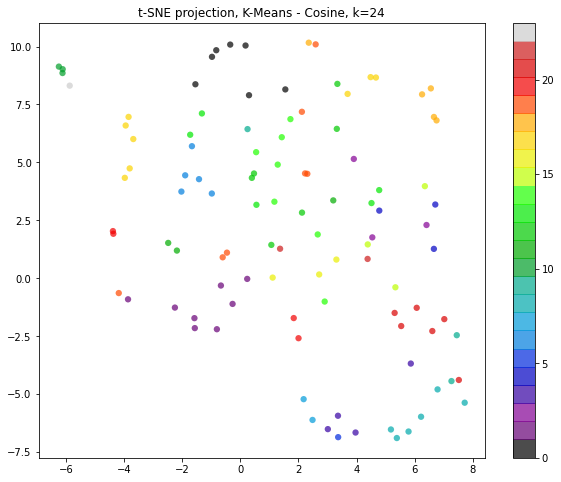

In [68]:
# use tSNE projection to plot the clusters for k-means cosine, k=24
plot_tsne(X_data2,k=24,label=labels_cosine2[23], title='K-Means - Cosine')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.87 µs


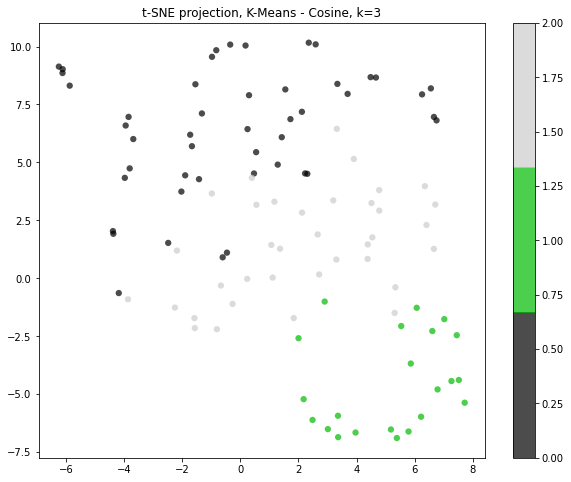

In [69]:
# use tSNE projection to plot the clusters for k-means cosine, k=3
plot_tsne(X_data2,k=3,label=labels_cosine2[2], title='K-Means - Cosine')

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 7.15 µs


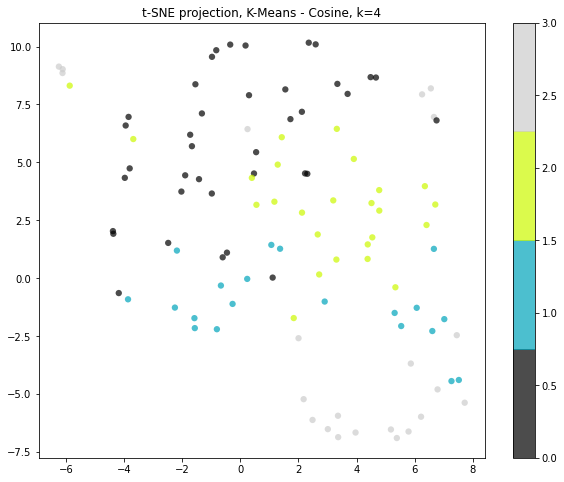

In [70]:
# use tSNE projection to plot the clusters for k-means cosine, k=4
plot_tsne(X_data2,k=4,label=labels_cosine2[3], title='K-Means - Cosine')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


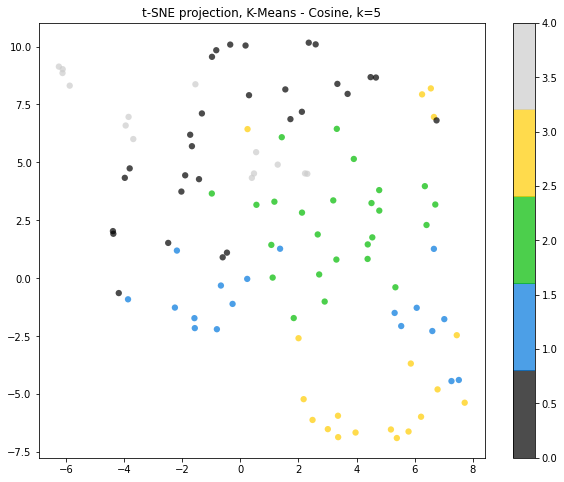

In [71]:
# use tSNE projection to plot the clusters for k-means cosine, k=5
plot_tsne(X_data2,k=5,label=labels_cosine2[4], title='K-Means - Cosine')

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.34 µs


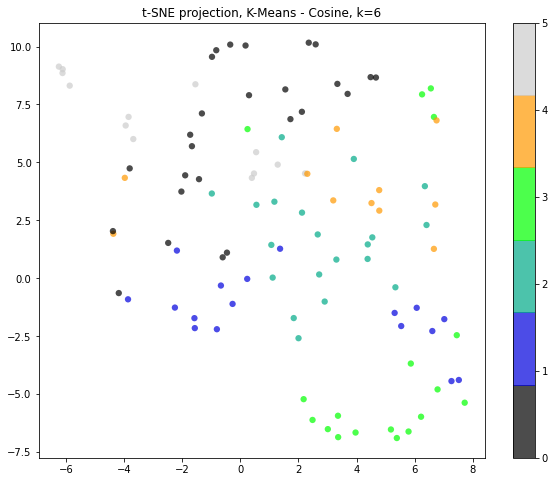

In [72]:
# use tSNE projection to plot the clusters for k-means cosine, k=6
plot_tsne(X_data2,k=6,label=labels_cosine2[5], title='K-Means - Cosine')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.25 µs


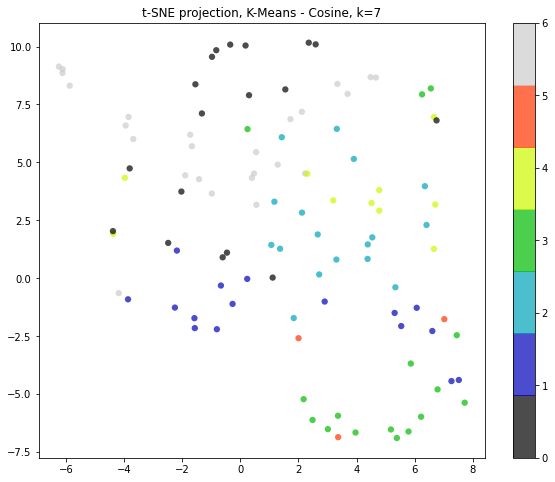

In [73]:
# use tSNE projection to plot the clusters for k-means cosine, k=7
plot_tsne(X_data2,k=7,label=labels_cosine2[6], title='K-Means - Cosine')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.44 µs


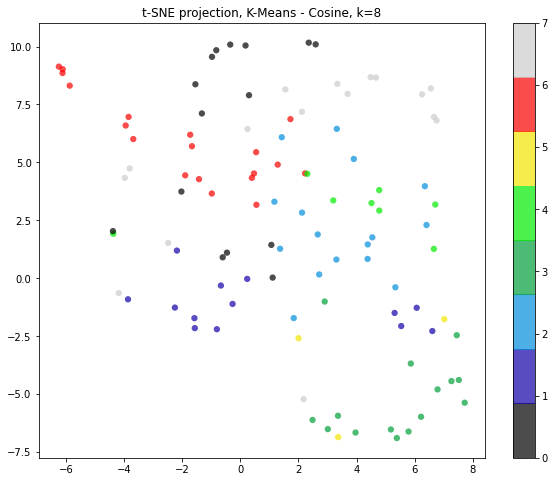

In [74]:
# use tSNE projection to plot the clusters for k-means cosine, k=8
plot_tsne(X_data2,k=8,label=labels_cosine2[7], title='K-Means - Cosine')

**Labelling tables**  
In the below dataframe tables, it can be seen that more data points from the same session such as Neural Networks I and II were grouped together by the Euclidean, and more of its clusters contain only data points from a single class.

In [75]:
# create a dataframe using pandas to show the resulting clustering for k-means euclidean, k=24
pd.set_option('display.max_rows', 105) # set the settings to we can see 105 rows (https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.set_option.html)
data2_label24e = pd.DataFrame({"label":labels_euclidean2[23], "session":y2_string})
data2_label24e.sort_values(by='label')

,label,session
94,0,Adaptive Data-Driven Modeling in Dynamic Envir...
38,0,Medicine and Bioinformatics
46,0,Information Retrieval I
0,1,Ensemble Methods
102,1,Machine learning of graphical models in static...
3,1,Ensemble Methods
70,1,Machine Learning for Predictive Models II
25,2,Neural Network II
29,2,Neural Network II
20,2,Neural Networks I


In [76]:
# create a dataframe using pandas to show the resulting clustering for k-means cosine, k=24
data2_label24c = pd.DataFrame({"label":labels_cosine2[23], "session":y2_string})
data2_label24c.sort_values(by='label')

,label,session
52,0,Science and Industry
73,0,Machine Learning Applications in Education I
79,0,Machine Learning Applications in Education II
80,0,Machine Learning Applications in Education II
84,0,Machine Learning in Information and System Sec...
35,0,Medicine and Bioinformatics
93,0,"Machine Learning Algorithms, Systems and Appli..."
66,1,Machine Learning for Predictive Models I
53,1,Science and Industry
71,1,Machine Learning for Predictive Models II




---


# 3. Hierachical Clustering

## 3.1 Travel Review Dataset

### Functions

In [0]:
# function to calculate and plot silhouette score
def calc_and_plot_silhouette2(X, labels, k_range, ymin, ymax, title=""):
  # using silhouette scores to detemine the number of k
  from sklearn.metrics import silhouette_score
  silhouette_scores = [silhouette_score(X, labels[k]) for k in range(1, k_range-1)]

  # plot the silhouette scores
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), silhouette_scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Silhouette score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

  return silhouette_scores

# function for plotting the silhouette scores for each k
# this code was adopted from COMP5310 - Principles of Data Science tutorial,
# week 8 by Dr Ali Anaissi, and adjusted for this assignment
def plot_silhouette2(X, labels, k1, k2):
  from sklearn.metrics import silhouette_samples
  from sklearn.metrics import silhouette_score

  import matplotlib.cm as cm
  range_n_clusters = [k1,k2]

  for n_clusters in range_n_clusters:
      # Create a subplot with 1 row and 2 columns
      fig, ax = plt.subplots(1, 1)
      fig.set_size_inches(10, 10)

      # The silhouette plot
      # The silhouette coefficient can range from -1, 1 but in this example we
      # only plot within [-0.1, 1]
      ax.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      cluster_labels = labels[n_clusters]

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.Spectral(float(i) / n_clusters)
          ax.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax.set_xlabel("The silhouette coefficient values")
      ax.set_ylabel("Cluster label")

      # The vertical line for average silhoutte score of all the values
      ax.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax.set_yticks([])  # Clear the yaxis labels / ticks
      ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      plt.suptitle(("Silhouette analysis for Agglomerative clustering "
                    "with k = %d" % n_clusters),
                  fontsize=14, fontweight='bold')

      plt.show()

# function to plot the calinski-harabasz score using matplotlib
# see https://matplotlib.org/ for further info
def plot_calinski(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Calinski-Harabasz score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])

# function to plot Davies-Bouldin scores using matplotlib
# see https://matplotlib.org/ for further info
def plot_davies(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(range(2, k_range), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Davies-Bouldin score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=None):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=42)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train Hierarchical clustering 

Over 260 models were trained on Dataset 1 using k=1-29, three similarity measures and three distance metrics. The Cosine similarity looks at the angle between two vectors, whereas the Euclidean (the straight line) and Manhattan (the distance in blocks) look at the distance between two points. The single-link uses the smallest distance, the average-link uses the average distance, and the complete-link uses the largest distance, when measuring distance between a point in a cluster and a point in other clusters.

In [78]:
# use sklearn Agglomerative clustering to fit hiearchical model
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html
from sklearn.cluster import AgglomerativeClustering

k_range3 = 30 # set range of k's
X1_data1 = X_norm # set the data to use

# set the metrics and linkages to use
affinities = ['euclidean','manhattan','cosine']
linkages = ['single','complete','average']

# create an empty list and dictionary to store the results
names = []
agglo_models = dict()

# use for loop to iterate the metrics and linkages and fit the models
for affin in affinities:
  for linka in linkages:
    agglo_cluster = [AgglomerativeClustering(n_clusters=k, affinity=affin, linkage=linka) for k in range(1, k_range3)]
    
    # predict the labels
    labels_agglo = [model.fit_predict(X1_data1) for model in agglo_cluster]

    # store and print the names
    name = affin + '-' + linka
    names.append(name)
    print(name)

    # store the results in the dictionary
    agglo_models[name] = [agglo_cluster, labels_agglo]

euclidean-single
euclidean-complete
euclidean-average
manhattan-single
manhattan-complete
manhattan-average
cosine-single
cosine-complete
cosine-average


In [79]:
# check the results
print(agglo_models['cosine-complete'][0][4])
print(agglo_models['cosine-complete'][1][4])

AgglomerativeClustering(affinity='cosine', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='complete', memory=None, n_clusters=5)
[0 0 0 1 0 3 3 1 0 2 0 1 0 0 0 0 0 0 0 0 0 3 3 3 0 0 0 0 3 0 0 0 0 0 1 1 0
 3 0 0 3 3 1 1 1 3 1 1 1 0 3 0 2 0 3 3 0 1 0 0 0 4 1 1 1 4 0 1 0 1 0 0 1 0
 0 0 3 0 3 3 4 1 1 0 4 3 0 3 0 1 3 1 0 0 0 1 0 0 0 2 1 1 0 1 3 0 0 3 4 1 1
 0 1 0 0 0 1 1 0 0 0 2 0 0 0 1 1 0 3 1 0 0 0 0 3 0 0 0 1 3 3 1 3 1 1 1 2 0
 1 0 1 1 1 1 0 0 1 3 0 0 0 3 1 1 0 1 0 1 0 1 2 4 1 3 1 1 1 1 1 1 1 0 0 0 0
 0 2 1 0 3 0 0 3 3 2 1 0 0 1 0 0 1 0 1 1 1 0 1 0 3 0 0 1 1 3 0 3 1 0 0 2 0
 0 3 0 3 0 0 1 0 1 0 1 1 2 2 0 1 0 4 0 0 1 3 3 1 4 0 3 2 0 1 0 0 1 3 3 0 4
 0 0 0 0 1 3 0 0 1 1 0 3 1 0 0 0 3 0 2 0 2 0 1 0 0 0 1 0 1 3 3 0 3 1 1 3 0
 1 0 0 1 3 0 0 1 0 1 1 0 4 0 1 1 0 0 2 0 0 1 0 3 1 3 4 1 0 0 0 0 0 0 2 0 4
 0 1 0 0 3 2 4 0 0 0 0 0 3 1 1 0 0 4 1 0 1 3 3 1 0 1 0 1 0 0 3 1 0 0 1 0 0
 0 0 0 0 1 0 0 1 1 2 3 3 1 0 3 0 0 0 1 1 0

### First evaluation 

**The Silhouette Method**  
the silhouette coefficient, ranges from -1 (bad) to 1 (good), measures the compactness of a cluster to which a point belongs and the separation of that point from all other clusters (and the silhouette score is the mean silhouette coefficient over all points in the data).

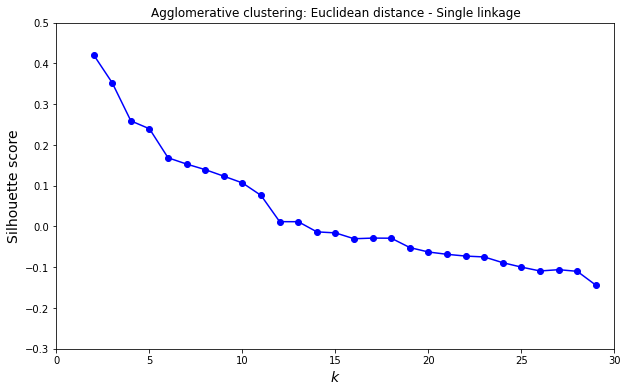

Silhouette score (k=4): 0.2591
Silhouette score (k=5): 0.2397
Silhouette score (k=6): 0.1685
Silhouette score (k=7): 0.1531


In [80]:
# plot the silhouette score for Agglomerative clustering with Euclidean distance - Single linkage
ss_eu_single = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['euclidean-single'][1], 
                          k_range=k_range3, ymin=-0.3, ymax=0.5, title="Agglomerative clustering: Euclidean distance - Single linkage")
# print the good result(s)
print("Silhouette score (k=4): {:0.4f}".format(ss_eu_single[2]))
print("Silhouette score (k=5): {:0.4f}".format(ss_eu_single[3]))
print("Silhouette score (k=6): {:0.4f}".format(ss_eu_single[4]))
print("Silhouette score (k=7): {:0.4f}".format(ss_eu_single[5]))

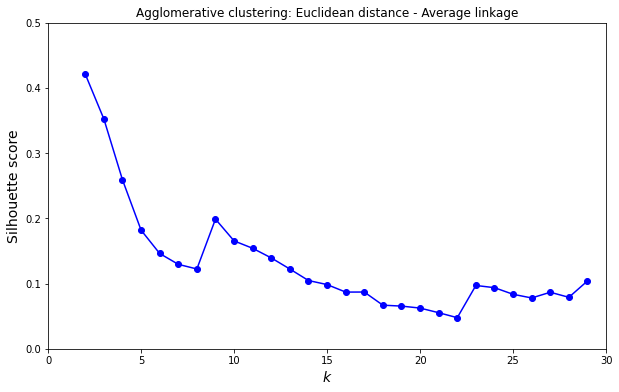

Silhouette score (k=4): 0.2591
Silhouette score (k=9): 0.1988
Silhouette score (k=10): 0.1654
Silhouette score (k=11): 0.1541


In [81]:
# plot the silhouette score for Agglomerative clustering with Euclidean distance - Average linkage
ss_eu_average = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['euclidean-average'][1], 
                          k_range=k_range3, ymin=0, ymax=0.5, title="Agglomerative clustering: Euclidean distance - Average linkage")
# print the good result(s)
print("Silhouette score (k=4): {:0.4f}".format(ss_eu_average[2]))
print("Silhouette score (k=9): {:0.4f}".format(ss_eu_average[7]))
print("Silhouette score (k=10): {:0.4f}".format(ss_eu_average[8]))
print("Silhouette score (k=11): {:0.4f}".format(ss_eu_average[9]))

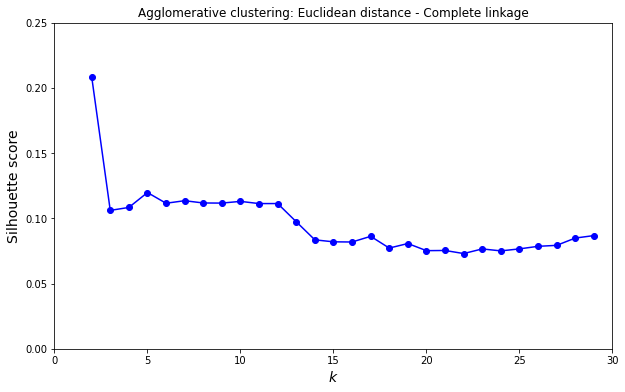

Silhouette score (k=5): 0.1198


In [82]:
# plot the silhouette score for Agglomerative clustering with Euclidean distance - Complete linkage
ss_eu_complete = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['euclidean-complete'][1], 
                          k_range=k_range3, ymin=0, ymax=0.25, title="Agglomerative clustering: Euclidean distance - Complete linkage")
# print the good result(s)
print("Silhouette score (k=5): {:0.4f}".format(ss_eu_complete[3]))

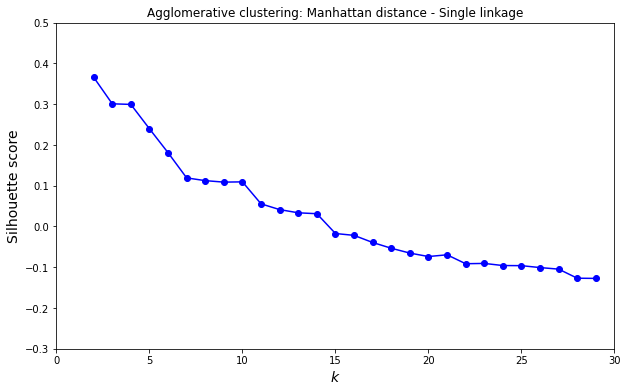

Silhouette score (k=4): 0.2994
Silhouette score (k=5): 0.2397
Silhouette score (k=6): 0.1810
Silhouette score (k=7): 0.1192


In [83]:
# plot the silhouette score for Agglomerative clustering with Manhattan distance - Single linkage
ss_man_single = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['manhattan-single'][1], 
                          k_range=k_range3, ymin=-0.3, ymax=0.5, title="Agglomerative clustering: Manhattan distance - Single linkage")
# print the good result(s)
print("Silhouette score (k=4): {:0.4f}".format(ss_man_single[2]))
print("Silhouette score (k=5): {:0.4f}".format(ss_man_single[3]))
print("Silhouette score (k=6): {:0.4f}".format(ss_man_single[4]))
print("Silhouette score (k=7): {:0.4f}".format(ss_man_single[5]))

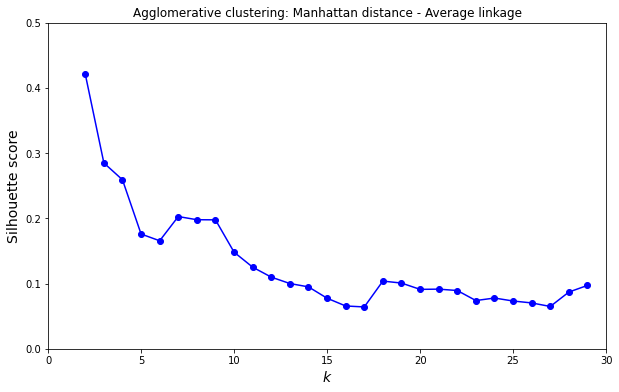

Silhouette score (k=4): 0.2591
Silhouette score (k=9): 0.1977
Silhouette score (k=10): 0.1481
Silhouette score (k=11): 0.1251


In [84]:
# plot the silhouette score for Agglomerative clustering with Manhattan distance - Average linkage
ss_man_average = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['manhattan-average'][1], 
                          k_range=k_range3, ymin=0, ymax=0.5, title="Agglomerative clustering: Manhattan distance - Average linkage")
# print the good result(s)
print("Silhouette score (k=4): {:0.4f}".format(ss_man_average[2]))
print("Silhouette score (k=9): {:0.4f}".format(ss_man_average[7]))
print("Silhouette score (k=10): {:0.4f}".format(ss_man_average[8]))
print("Silhouette score (k=11): {:0.4f}".format(ss_man_average[9]))

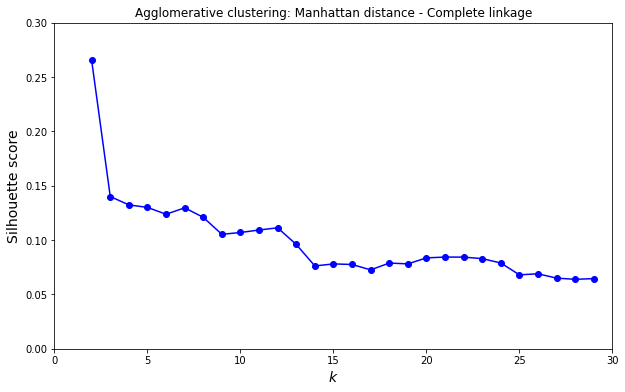

Silhouette score (k=4): 0.1324
Silhouette score (k=7): 0.1297


In [85]:
# plot the silhouette score for Agglomerative clustering with Manhattan distance - Complete linkage
ss_man_complete = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['manhattan-complete'][1], 
                          k_range=k_range3, ymin=0, ymax=0.3, title="Agglomerative clustering: Manhattan distance - Complete linkage")
print("Silhouette score (k=4): {:0.4f}".format(ss_man_complete[2]))
print("Silhouette score (k=7): {:0.4f}".format(ss_man_complete[5]))

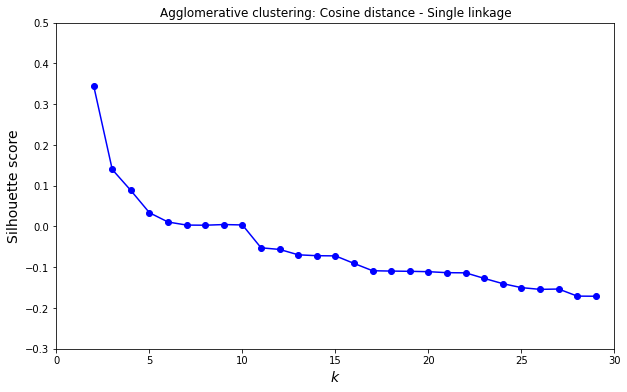

Silhouette score (k=4): 0.0883
Silhouette score (k=5): 0.0337
Silhouette score (k=6): 0.0110


In [86]:
# plot the silhouette score for Agglomerative clustering with Cosine distance - Single linkage
ss_cos_single = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['cosine-single'][1], 
                          k_range=k_range3, ymin=-0.3, ymax=0.5, title="Agglomerative clustering: Cosine distance - Single linkage")
# print the good result(s)
print("Silhouette score (k=4): {:0.4f}".format(ss_cos_single[2]))
print("Silhouette score (k=5): {:0.4f}".format(ss_cos_single[3]))
print("Silhouette score (k=6): {:0.4f}".format(ss_cos_single[4]))

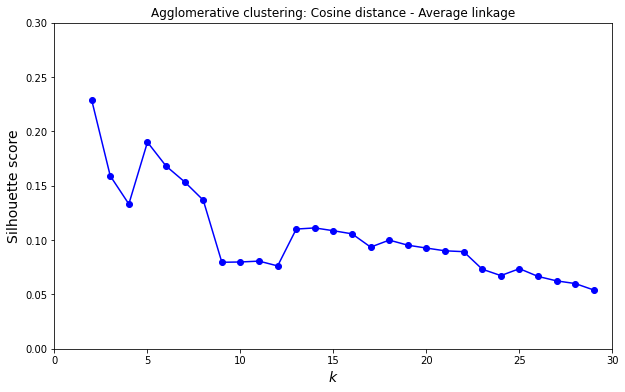

Silhouette score (k=5): 0.1901
Silhouette score (k=6): 0.1681
Silhouette score (k=7): 0.1535
Silhouette score (k=8): 0.1367


In [87]:
# plot the silhouette score for Agglomerative clustering with Cosine distance - Average linkage
ss_cos_average = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['cosine-average'][1], 
                          k_range=k_range3, ymin=0, ymax=0.3, title="Agglomerative clustering: Cosine distance - Average linkage")
# print the good result(s)
print("Silhouette score (k=5): {:0.4f}".format(ss_cos_average[3]))
print("Silhouette score (k=6): {:0.4f}".format(ss_cos_average[4]))
print("Silhouette score (k=7): {:0.4f}".format(ss_cos_average[5]))
print("Silhouette score (k=8): {:0.4f}".format(ss_cos_average[6]))

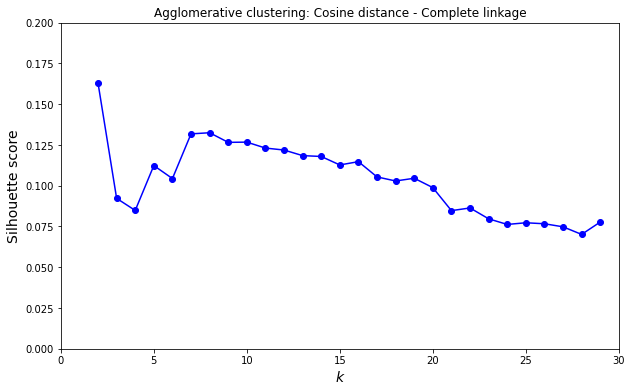

Silhouette score (k=7): 0.1318
Silhouette score (k=8): 0.1325


In [88]:
# plot the silhouette score for Agglomerative clustering with Cosine distance - Complete linkage
ss_cos_complete = calc_and_plot_silhouette2(X1_data1, labels=agglo_models['cosine-complete'][1], 
                          k_range=k_range3, ymin=0, ymax=0.2, title="Agglomerative clustering: Cosine distance - Complete linkage")
# print the good result(s)
print("Silhouette score (k=7): {:0.4f}".format(ss_cos_complete[5]))
print("Silhouette score (k=8): {:0.4f}".format(ss_cos_complete[6]))

Unfortunately, all models produced low silhouette scores (less than 0.3 for k>=3). The Silhouette coefficient plots also did not look well.

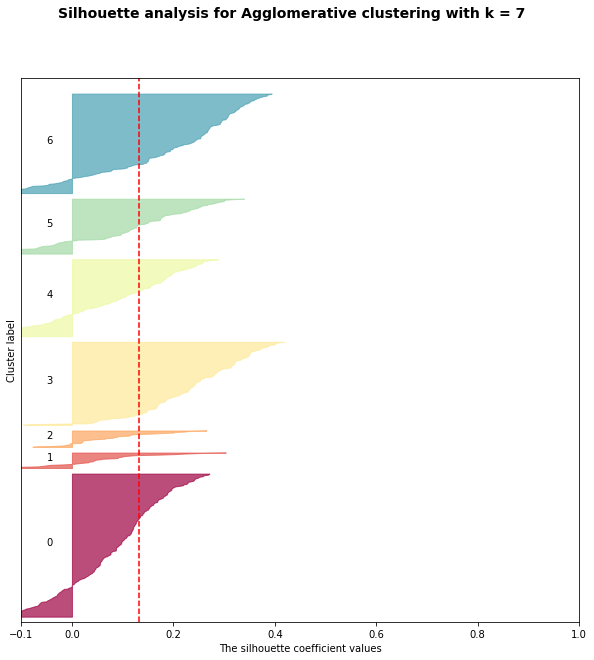

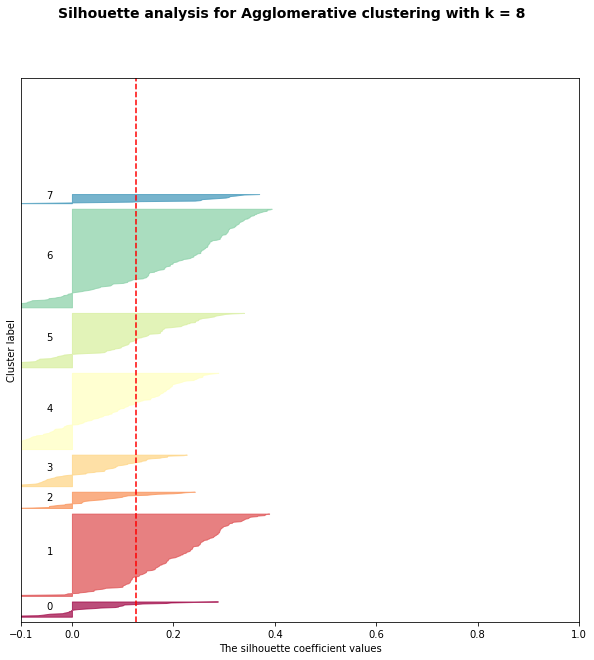

In [89]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k=7 vs 8
plot_silhouette2(X1_data1, labels=agglo_models['cosine-complete'][1], k1=7, k2=8)

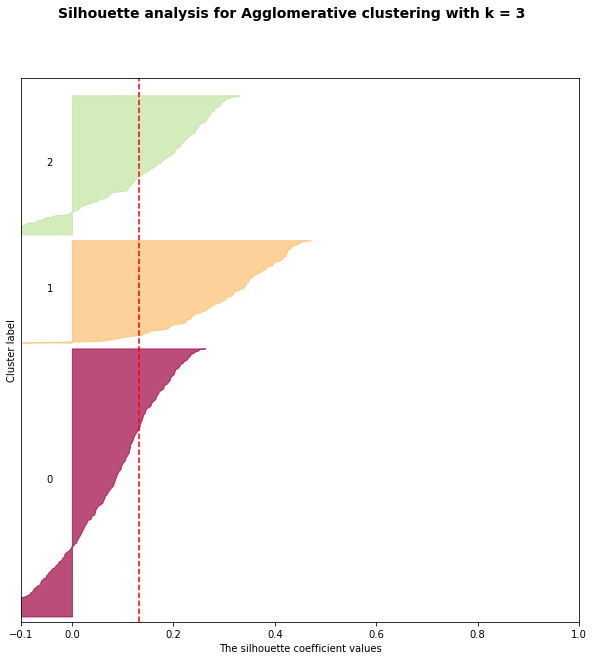

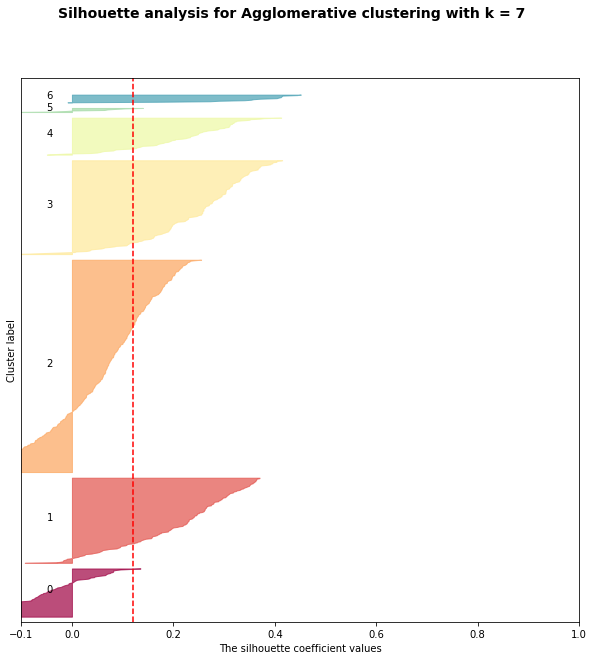

In [90]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k=3 vs 7
plot_silhouette2(X1_data1, labels=agglo_models['manhattan-complete'][1], k1=3, k2=7)

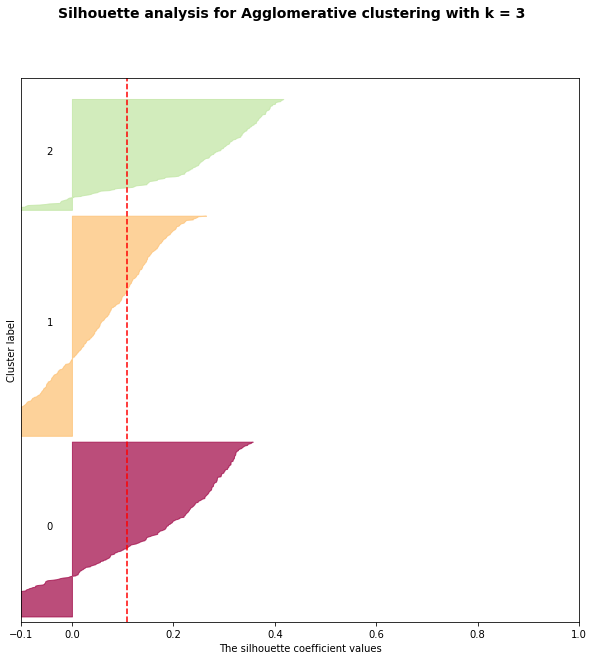

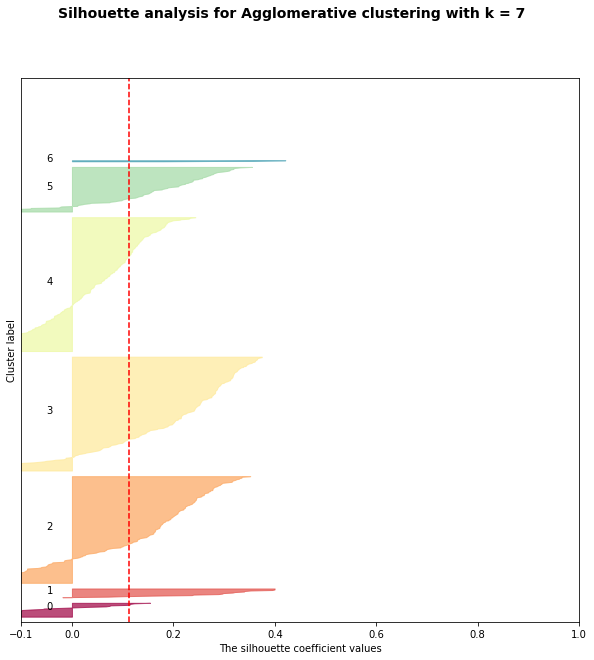

In [91]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k=3 vs 7
plot_silhouette2(X1_data1, labels=agglo_models['euclidean-complete'][1], k1=3, k2=7)

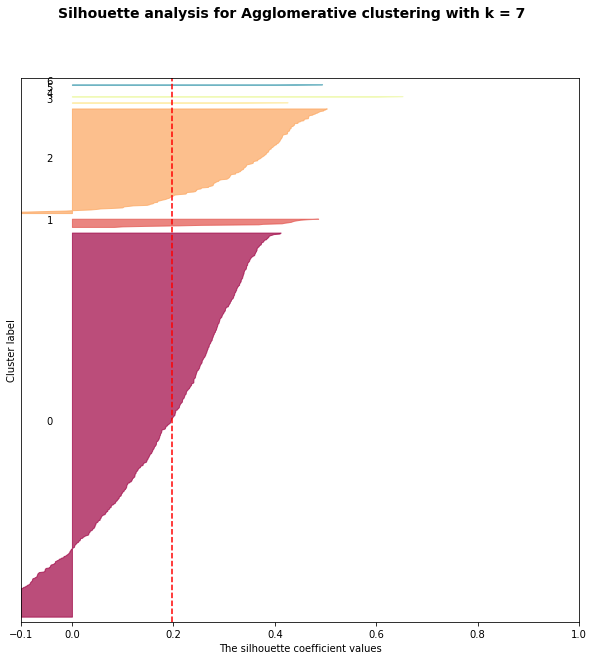

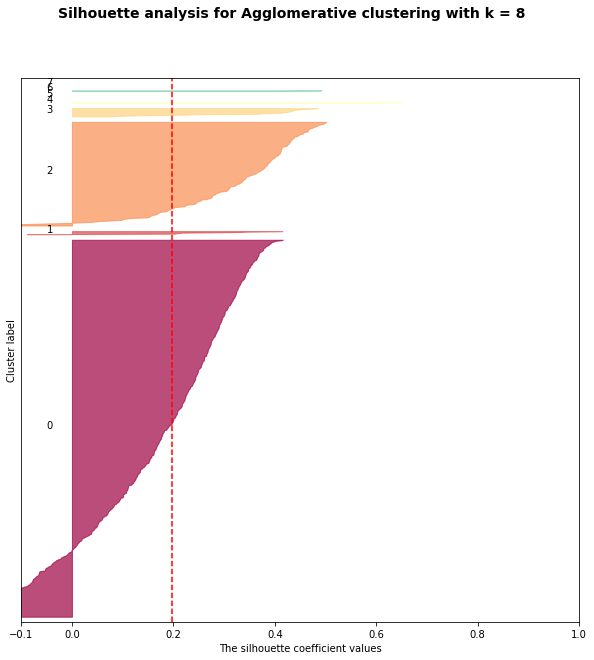

In [92]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k=7 vs 8
plot_silhouette2(X1_data1, labels=agglo_models['manhattan-average'][1], k1=7, k2=8)

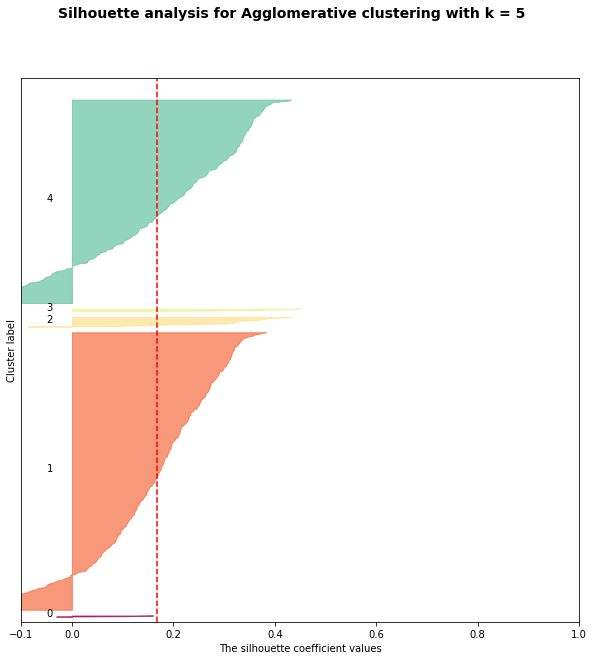

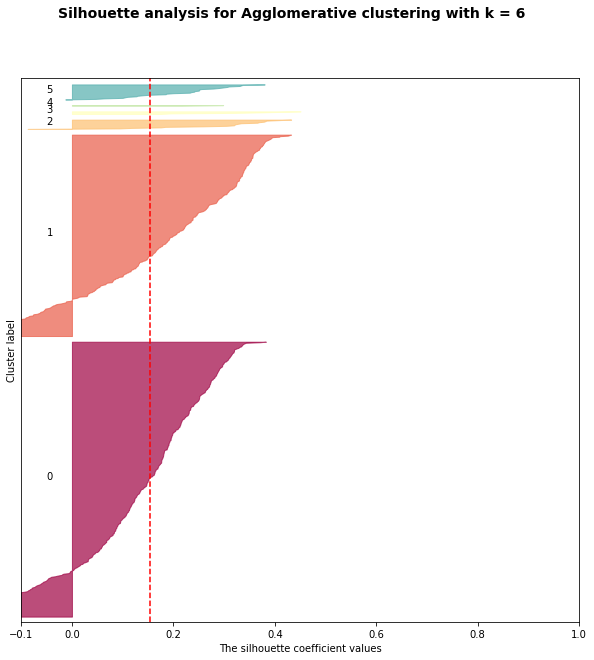

In [93]:
# plot the silhouette coefficient for various clusters using plot_silhouette function
# comparing k=5 vs 6
plot_silhouette2(X1_data1, labels=agglo_models['cosine-average'][1], k1=5, k2=6)

### Second evaluation 

**The Davies-Bouldin Score and the Calinksi-Harabasz Score**  
The Davies-Bouldin score measures the average ‘similarity’ between clusters, as defined by the distance between clusters with the size of the clusters (a lower score, close to 0, indicates better separation between the clusters). The Calinksi-Harabasz score measures the ratio between the within and the between-cluster dispersions (higher score means dense and well separated clusters).

In [0]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# create empty list for each variable
db_agglo = dict()
ch_agglo = dict()
dbscores = []
chscores = []
ks =[]

# use for-loop to iterate and calculate the scores for k=2-29
for name in names:
  for k in range(1, k_range3-1):
    dbscore = davies_bouldin_score(X1_data1, agglo_models[name][1][k])
    chscore = calinski_harabasz_score(X1_data1, agglo_models[name][1][k])
    # store the results in the list
    dbscores.append(dbscore)
    chscores.append(chscore)
  
  # store the results in a dictionary
  db_agglo[name] = dbscores
  ch_agglo[name] = chscores
  dbscores = []
  chscores = []

In [95]:
# convert Calinski-Harabasz scores into a dataframe using pandas
df_chscores = pd.DataFrame({"k":np.arange(2,30), "cosine-single":ch_agglo['cosine-single'],
                           "cosine-average":ch_agglo['cosine-average'],
                           "cosine-complete":ch_agglo['cosine-complete'],
                           "euclidean-single":ch_agglo['euclidean-single'],
                           "euclidean-average":ch_agglo['euclidean-average'],
                           "euclidean-complete":ch_agglo['euclidean-complete'],
                           "manhattan-single":ch_agglo['manhattan-single'],
                           "manhattan-average":ch_agglo['manhattan-average'],
                           "manhattan-complete":ch_agglo['manhattan-complete'],
                           })
df_chscores.head(14)

,k,cosine-single,cosine-average,cosine-complete,euclidean-single,euclidean-average,euclidean-complete,manhattan-single,manhattan-average,manhattan-complete
0,2,3.787220,5.416734,181.780777,9.342267,9.342267,267.709413,3.809731,9.342267,309.543969
1,3,2.771441,17.285063,106.188634,6.609191,6.609191,195.405860,3.600932,6.591341,237.505569
2,4,2.489744,15.251828,84.043466,5.693640,5.693640,142.258031,5.556358,5.693640,168.381686
3,5,2.405053,102.109272,117.559678,5.138337,6.795051,123.811982,5.138337,5.346979,151.712328
4,6,2.257358,91.304075,118.517489,4.621251,6.312727,126.434424,4.584204,5.309232,124.403883
5,7,2.280077,76.529386,131.648893,4.247459,6.410286,108.257734,4.186017,59.903870,112.785392
6,8,2.445759,70.575933,123.321970,3.992196,9.193597,110.947673,3.939241,58.199306,105.846029
7,9,3.339324,62.736421,114.941378,3.769467,54.878018,100.053279,3.833316,53.746329,98.712930
8,10,3.577378,70.994958,104.182362,3.589807,49.943263,90.626563,3.766919,48.284952,95.745509
9,11,3.269711,64.961400,95.910786,3.452469,47.858980,88.255684,3.589841,43.976831,89.153463


The complete-link models produced more dense and better separated clusters than the average or single-links, as indicated by the higher Calinski scores across different k’s. When paired with complete-link, all three similarity measures seemed to work well. Overall, the Calinski scores were decreasing as k was increasing, but the Manhattan models seemed to do better at lower k’s, whereas the Cosines were better at higher k’s (with the Euclideans somewhere in between).

In [96]:
# convert Davies-Bouldin scores into a dataframe using pandas
df_dbscores = pd.DataFrame({"k":np.arange(2,30), "cosine-single":db_agglo['cosine-single'],
                           "cosine-average":db_agglo['cosine-average'],
                           "cosine-complete":db_agglo['cosine-complete'],
                           "euclidean-single":db_agglo['euclidean-single'],
                           "euclidean-average":db_agglo['euclidean-average'],
                           "euclidean-complete":db_agglo['euclidean-complete'],
                           "manhattan-single":db_agglo['manhattan-single'],
                           "manhattan-average":db_agglo['manhattan-average'],
                           "manhattan-complete":db_agglo['manhattan-complete'],
                           })
df_dbscores.head(14)

,k,cosine-single,cosine-average,cosine-complete,euclidean-single,euclidean-average,euclidean-complete,manhattan-single,manhattan-average,manhattan-complete
0,2,0.489301,1.298459,1.654703,0.598190,0.598190,1.729692,0.487803,0.598190,1.278057
1,3,0.642505,1.380152,1.864555,0.560328,0.560328,2.044680,0.507675,0.561395,2.033082
2,4,0.653362,1.345352,1.832398,0.541941,0.541941,2.057209,0.548818,0.541941,1.979288
3,5,0.652696,1.382374,1.841618,0.536151,0.769110,1.878246,0.536151,0.717163,1.842000
4,6,0.670213,1.433394,2.069629,0.547533,0.807978,1.829682,0.555094,0.751653,1.943182
5,7,0.662316,1.264549,1.938279,0.561141,0.897734,1.704912,0.571738,0.827202,1.843471
6,8,0.643367,1.450093,1.813936,0.567250,0.940719,1.740446,0.576565,0.877864,2.161831
7,9,0.636534,1.392667,1.879945,0.578468,0.909047,1.687928,0.572871,0.925141,1.936362
8,10,0.718422,1.406619,1.883133,0.586728,0.990788,1.575225,0.568647,0.951838,2.001326
9,11,0.699059,1.406017,1.835464,0.592014,1.068394,1.666171,0.581936,0.922115,1.893624


The Davies-Bouldin scores were quite good for all models, with the single and average-link produced slightly better scores than the complete-link. When paired with the single-link, both Manhattan and Euclidean models produced better scores than the Cosine. 

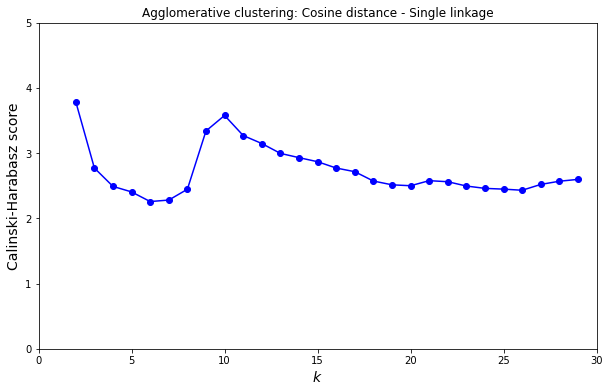

In [97]:
# plot the Calinski-Harabasz scores for agglomerative cosine distance - single linkage
plot_calinski(scores=ch_agglo['cosine-single'], k_range=k_range3, ymin=0, ymax=5, title='Agglomerative clustering: Cosine distance - Single linkage')

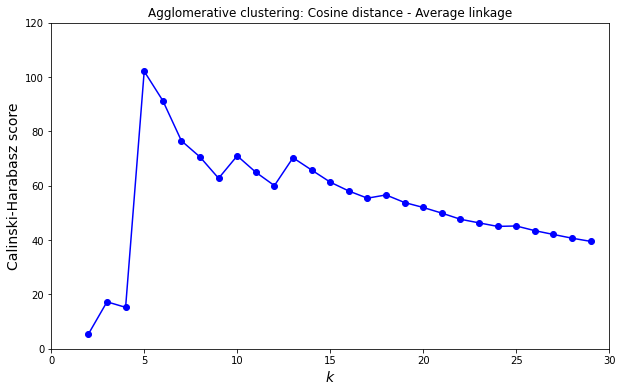

In [98]:
# plot the Calinski-Harabasz scores for agglomerative cosine distance - average linkage
plot_calinski(scores=ch_agglo['cosine-average'], k_range=k_range3, ymin=0, ymax=120, title='Agglomerative clustering: Cosine distance - Average linkage')

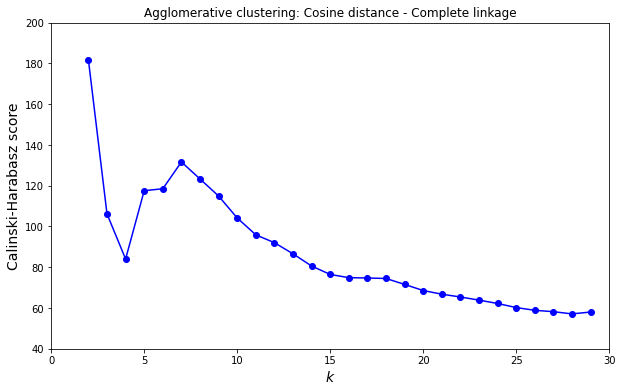

In [99]:
# plot the Calinski-Harabasz scores for agglomerative cosine distance - complete linkage
plot_calinski(scores=ch_agglo['cosine-complete'], k_range=k_range3, ymin=40, ymax=200, title='Agglomerative clustering: Cosine distance - Complete linkage')

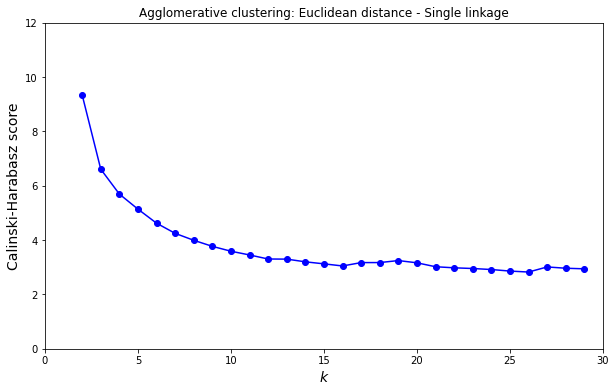

In [100]:
# plot the Calinski-Harabasz scores for agglomerative euclidean distance - single linkage
plot_calinski(scores=ch_agglo['euclidean-single'], k_range=k_range3, ymin=0, ymax=12, title='Agglomerative clustering: Euclidean distance - Single linkage')

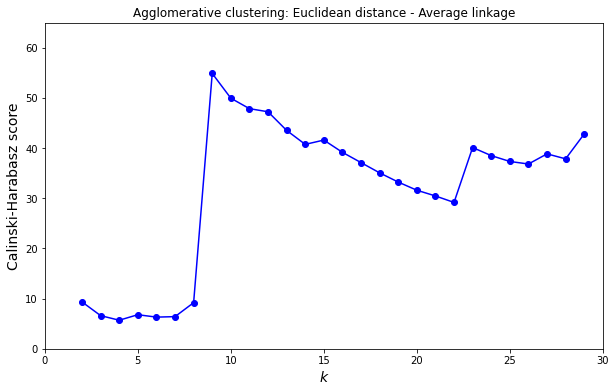

In [101]:
# plot the Calinski-Harabasz scores for agglomerative euclidean distance - average linkage
plot_calinski(scores=ch_agglo['euclidean-average'], k_range=k_range3, ymin=0, ymax=65, title='Agglomerative clustering: Euclidean distance - Average linkage')

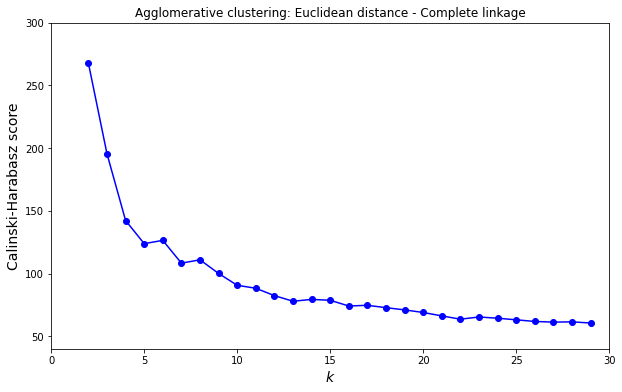

In [102]:
# plot the Calinski-Harabasz scores for agglomerative euclidean distance - complete linkage
plot_calinski(scores=ch_agglo['euclidean-complete'], k_range=k_range3, ymin=40, ymax=300, title='Agglomerative clustering: Euclidean distance - Complete linkage')

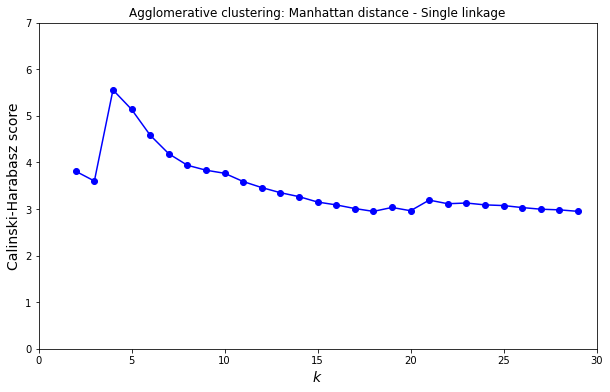

In [103]:
# plot the Calinski-Harabasz scores for agglomerative manhattan distance - single linkage
plot_calinski(scores=ch_agglo['manhattan-single'], k_range=k_range3, ymin=0, ymax=7, title='Agglomerative clustering: Manhattan distance - Single linkage')

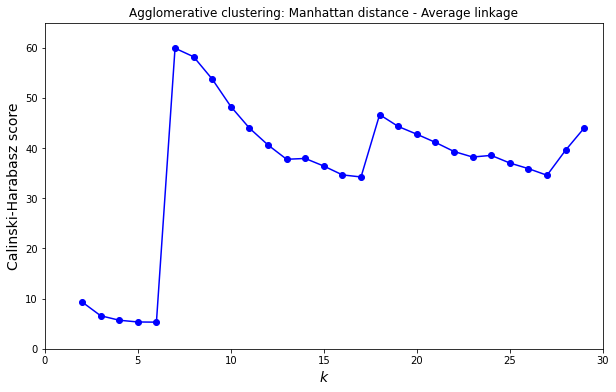

In [104]:
# plot the Calinski-Harabasz scores for agglomerative manhattan distance - average linkage
plot_calinski(scores=ch_agglo['manhattan-average'], k_range=k_range3, ymin=0, ymax=65, title='Agglomerative clustering: Manhattan distance - Average linkage')

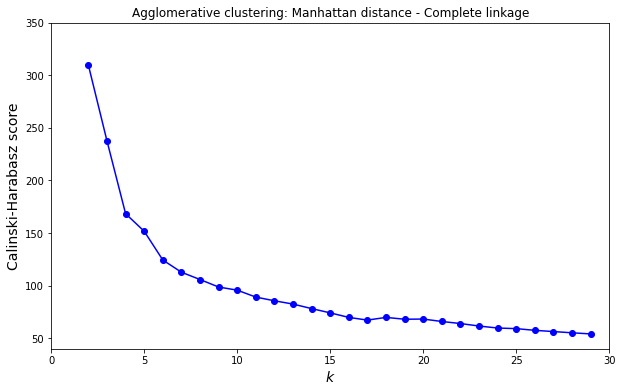

In [105]:
# plot the Calinski-Harabasz scores for agglomerative manhattan distance - complete linkage
plot_calinski(scores=ch_agglo['manhattan-complete'], k_range=k_range3, ymin=40, ymax=350, title='Agglomerative clustering: Manhattan distance - Complete linkage')

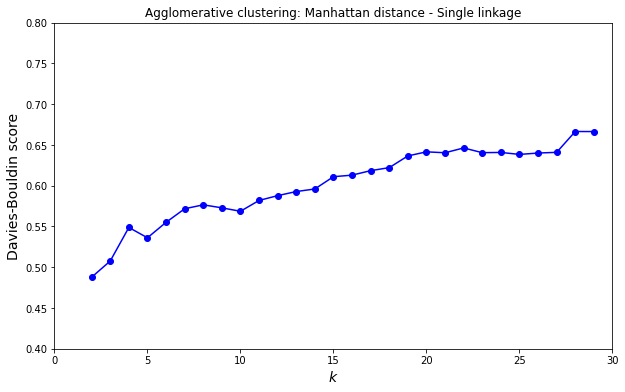

In [106]:
# plot the Davies-Bouldin scores for agglomerative manhattan distance - single linkage
plot_davies(scores=db_agglo['manhattan-single'], k_range=k_range3, ymin=0.4, ymax=0.8, title='Agglomerative clustering: Manhattan distance - Single linkage')

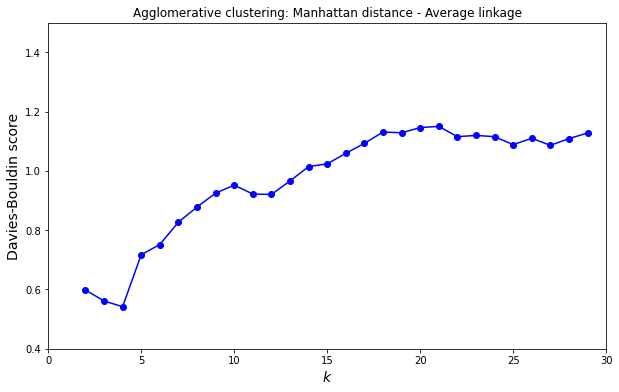

In [107]:
# plot the Davies-Bouldin scores for agglomerative manhattan distance - average linkage
plot_davies(scores=db_agglo['manhattan-average'], k_range=k_range3, ymin=0.4, ymax=1.5, title='Agglomerative clustering: Manhattan distance - Average linkage')

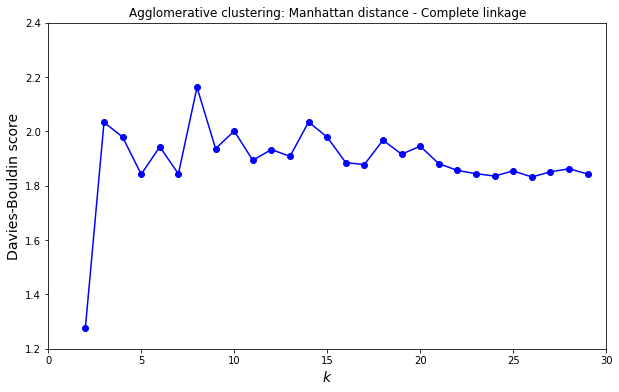

In [108]:
# plot the Davies-Bouldin scores for agglomerative manhattan distance - complete linkage
plot_davies(scores=db_agglo['manhattan-complete'], k_range=k_range3, ymin=1.2, ymax=2.4, title='Agglomerative clustering: Manhattan distance - Complete linkage')

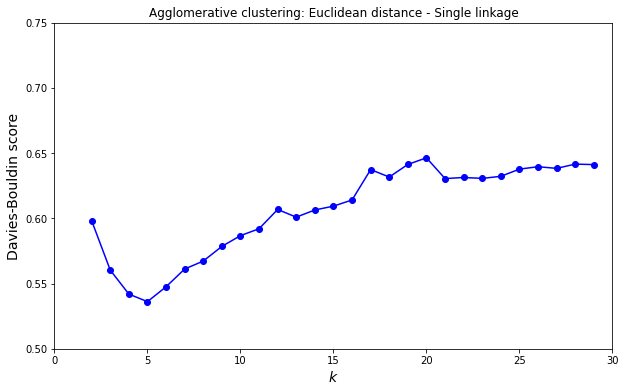

In [109]:
# plot the Davies-Bouldin scores for agglomerative euclidean distance - single linkage
plot_davies(scores=db_agglo['euclidean-single'], k_range=k_range3, ymin=0.5, ymax=0.75, title='Agglomerative clustering: Euclidean distance - Single linkage')

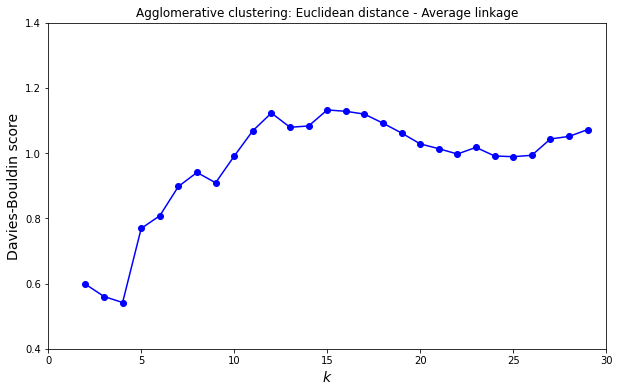

In [110]:
# plot the Davies-Bouldin scores for agglomerative euclidean distance - average linkage
plot_davies(scores=db_agglo['euclidean-average'], k_range=k_range3, ymin=0.4, ymax=1.4, title='Agglomerative clustering: Euclidean distance - Average linkage')

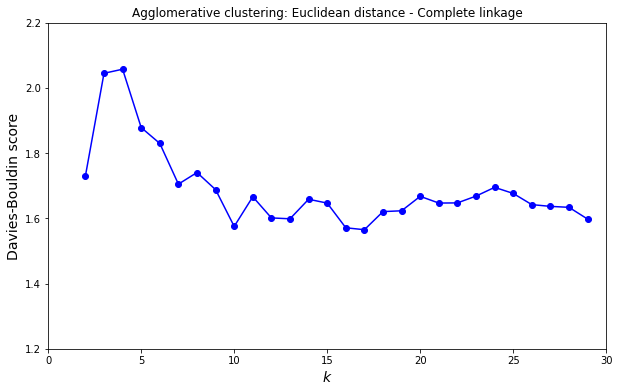

In [111]:
# plot the Davies-Bouldin scores for agglomerative euclidean distance - complete linkage
plot_davies(scores=db_agglo['euclidean-complete'], k_range=k_range3, ymin=1.2, ymax=2.2, title='Agglomerative clustering: Euclidean distance - Complete linkage')

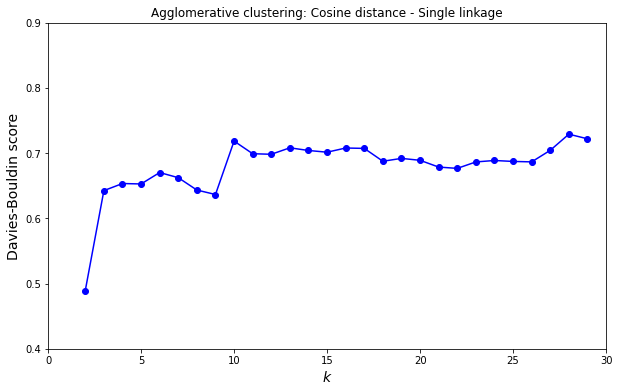

In [112]:
# plot the Davies-Bouldin scores for agglomerative cosine distance - single linkage
plot_davies(scores=db_agglo['cosine-single'], k_range=k_range3, ymin=0.4, ymax=0.9, title='Agglomerative clustering: Cosine distance - Single linkage')

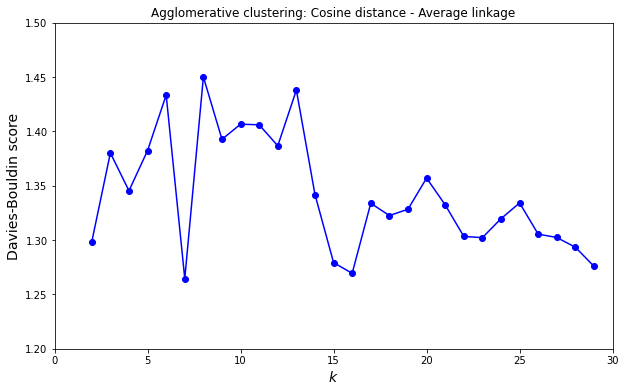

In [113]:
# plot the Davies-Bouldin scores for agglomerative cosine distance - average linkage
plot_davies(scores=db_agglo['cosine-average'], k_range=k_range3, ymin=1.2, ymax=1.5, title='Agglomerative clustering: Cosine distance - Average linkage')

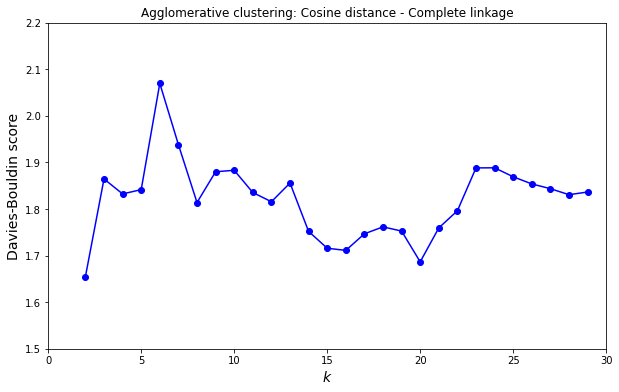

In [114]:
# plot the Davies-Bouldin scores for agglomerative cosine distance - complete linkage
plot_davies(scores=db_agglo['cosine-complete'], k_range=k_range3, ymin=1.5, ymax=2.2, title='Agglomerative clustering: Cosine distance - Complete linkage')

### Plot clusters

**t-SNE projections**  
On the t-SNE projections, both Manhattan and Euclidean complete-link models showed well separated clusters at k=3, but did not produce good clusters when k was increased. At k=7, the Cosine complete-link model showed reasonably better separated clusters than the Euclidean or Manhattan. The single and complete-link though, produced neither well balanced nor well separated clusters.

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


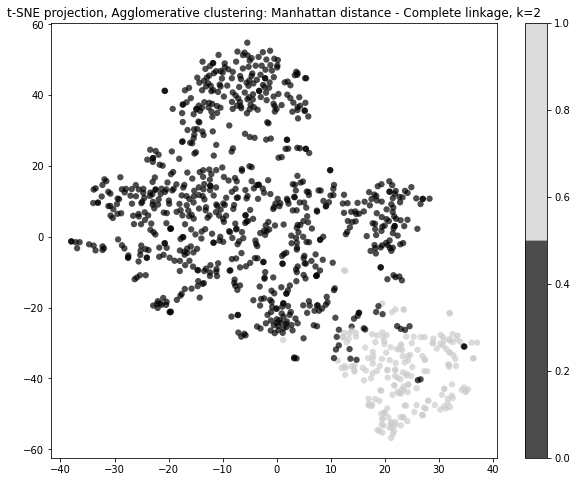

In [115]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=2
plot_tsne(X1_data1,k=2,label=agglo_models['manhattan-complete'][1][1], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.63 µs


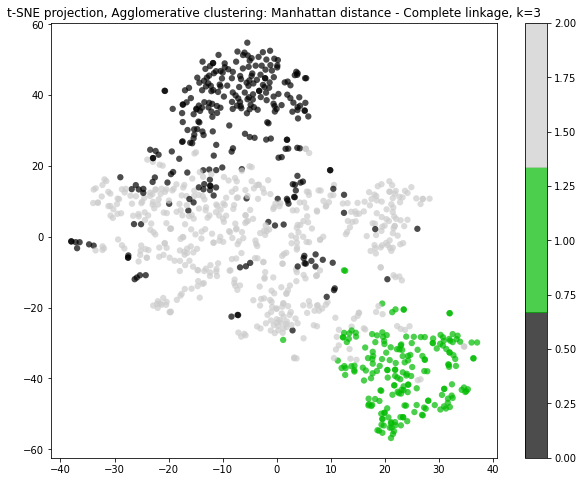

In [116]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=3
plot_tsne(X1_data1,k=3,label=agglo_models['manhattan-complete'][1][2], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


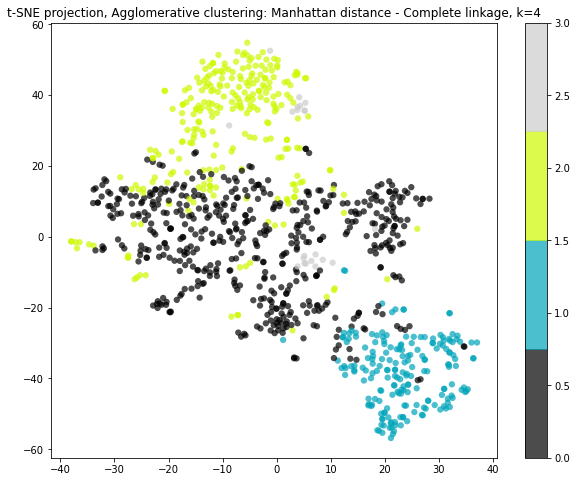

In [117]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=4
plot_tsne(X1_data1,k=4,label=agglo_models['manhattan-complete'][1][3], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.2 µs


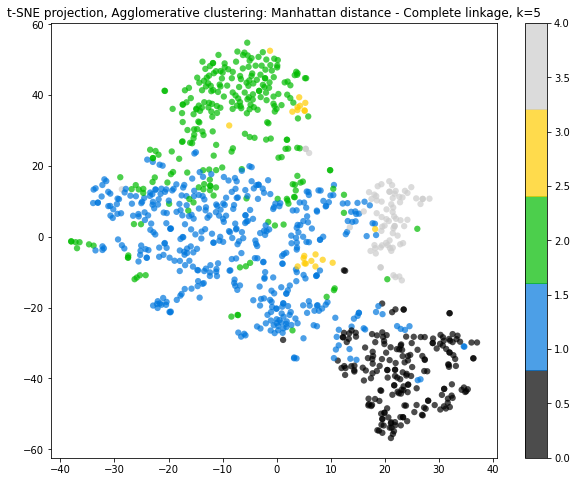

In [118]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=5
plot_tsne(X1_data1,k=5,label=agglo_models['manhattan-complete'][1][4], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


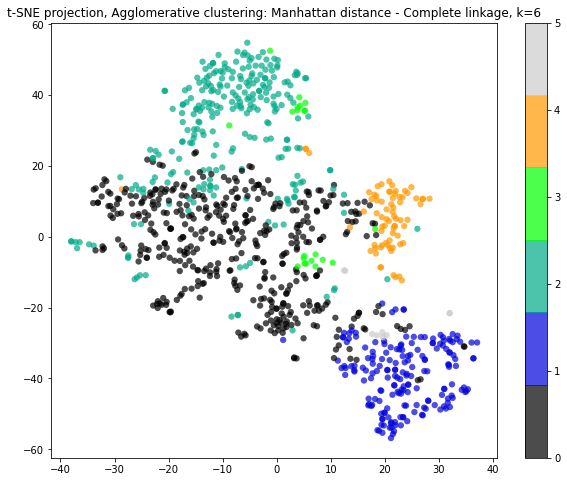

In [119]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=6
plot_tsne(X1_data1,k=6,label=agglo_models['manhattan-complete'][1][5], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.15 µs


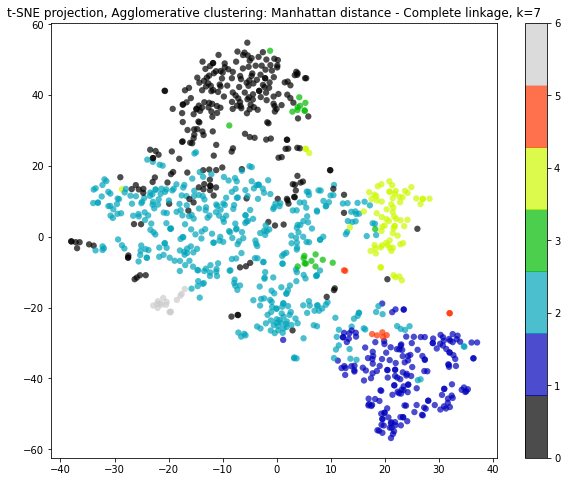

In [120]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - complete linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['manhattan-complete'][1][6], title='Agglomerative clustering: Manhattan distance - Complete linkage')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.72 µs


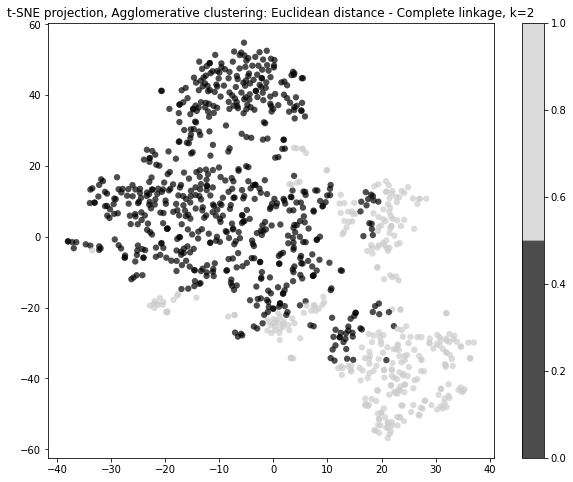

In [121]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=2
plot_tsne(X1_data1,k=2,label=agglo_models['euclidean-complete'][1][1], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.87 µs


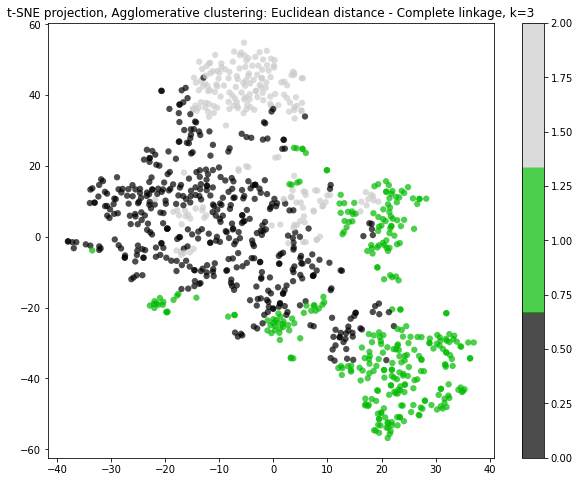

In [122]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=3
plot_tsne(X1_data1,k=3,label=agglo_models['euclidean-complete'][1][2], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.96 µs


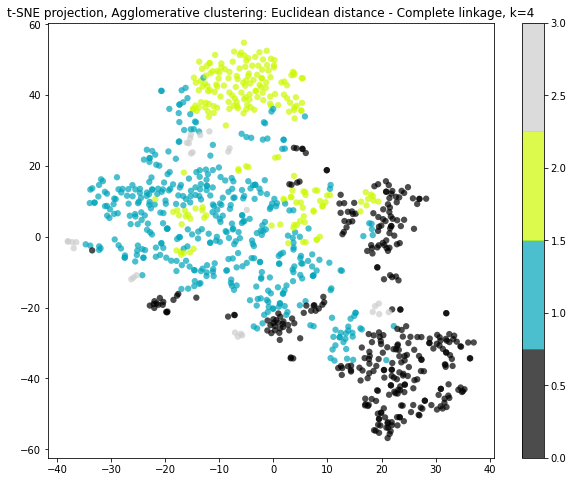

In [123]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=4
plot_tsne(X1_data1,k=4,label=agglo_models['euclidean-complete'][1][3], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.96 µs


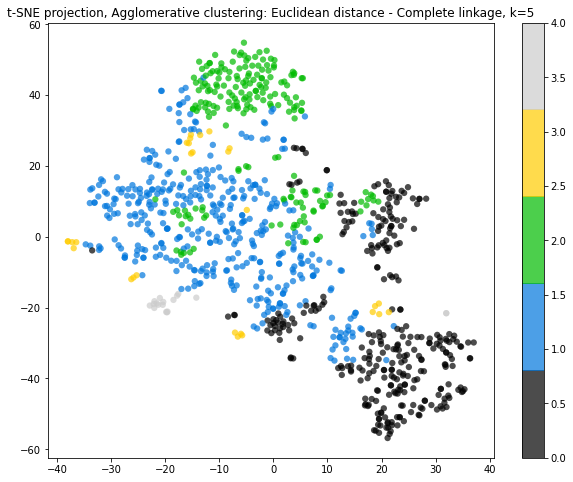

In [124]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=5
plot_tsne(X1_data1,k=5,label=agglo_models['euclidean-complete'][1][4], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


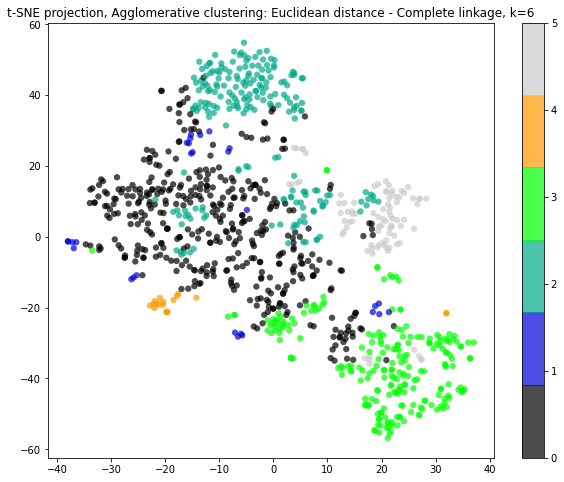

In [125]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=6
plot_tsne(X1_data1,k=6,label=agglo_models['euclidean-complete'][1][5], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.87 µs


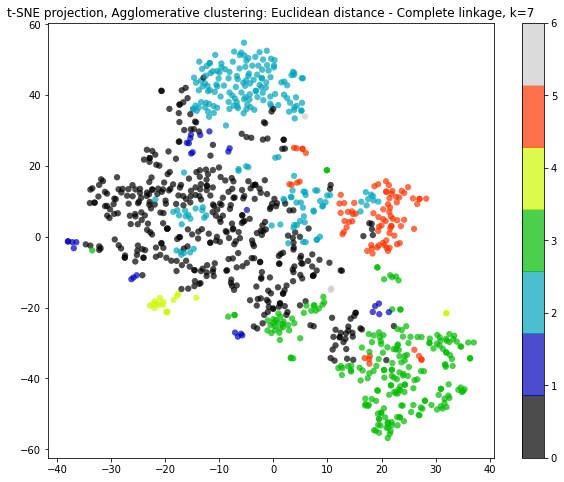

In [126]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['euclidean-complete'][1][6], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 7.39 µs


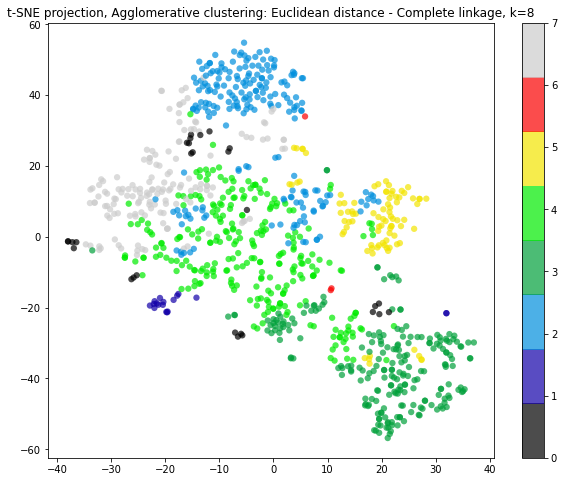

In [127]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - complete linkage, k=8
plot_tsne(X1_data1,k=8,label=agglo_models['euclidean-complete'][1][7], title='Agglomerative clustering: Euclidean distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


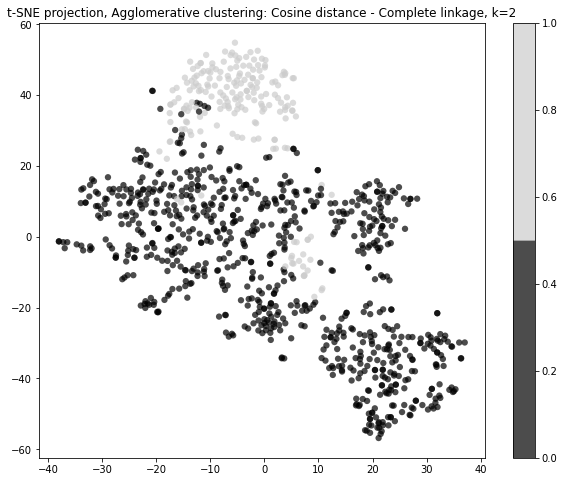

In [128]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=2
plot_tsne(X1_data1,k=2,label=agglo_models['cosine-complete'][1][1], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs


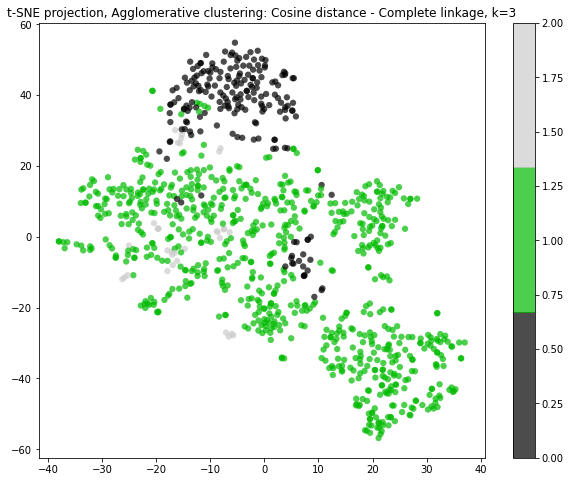

In [129]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=3
plot_tsne(X1_data1,k=3,label=agglo_models['cosine-complete'][1][2], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


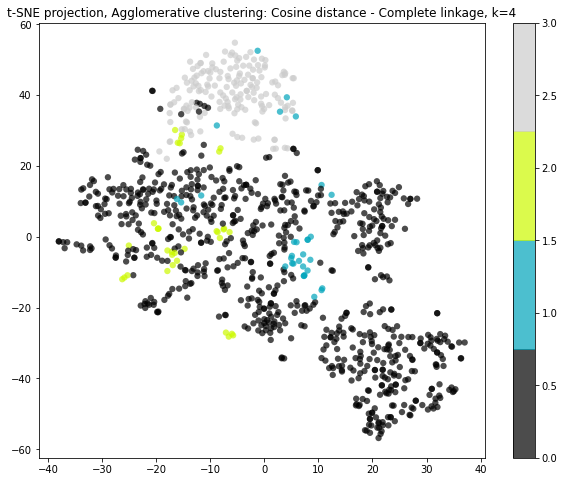

In [130]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=4
plot_tsne(X1_data1,k=4,label=agglo_models['cosine-complete'][1][3], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


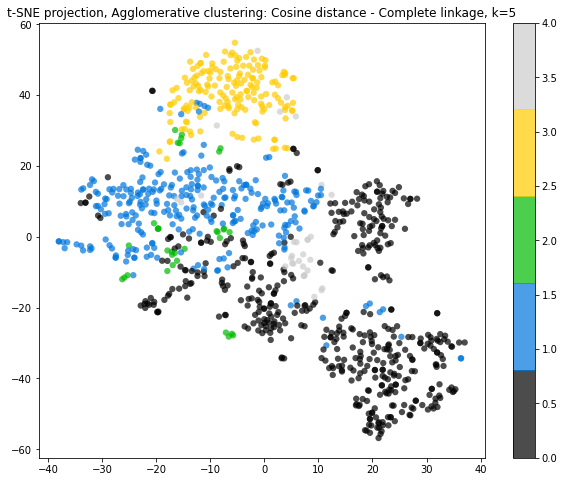

In [131]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=5
plot_tsne(X1_data1,k=5,label=agglo_models['cosine-complete'][1][4], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


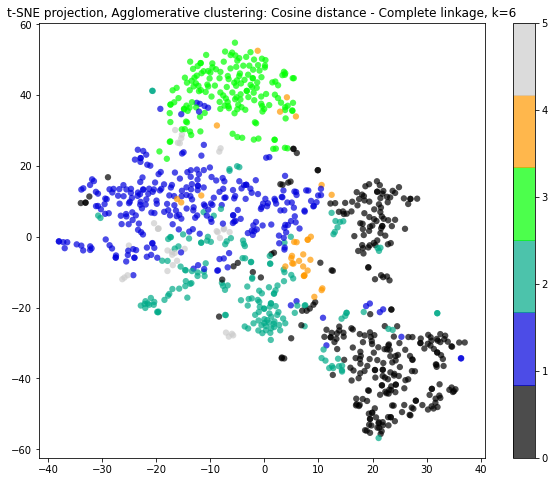

In [132]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=6
plot_tsne(X1_data1,k=6,label=agglo_models['cosine-complete'][1][5], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


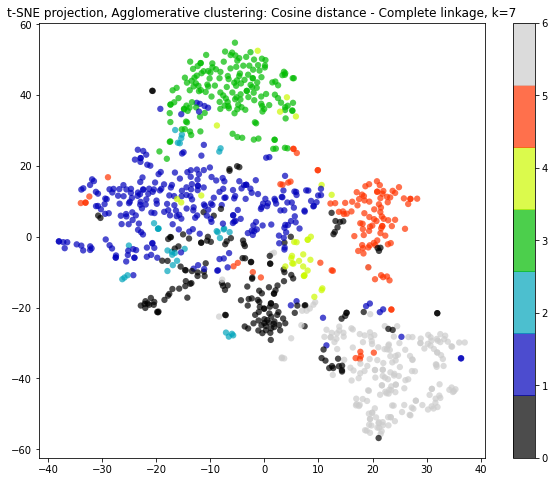

In [133]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['cosine-complete'][1][6], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


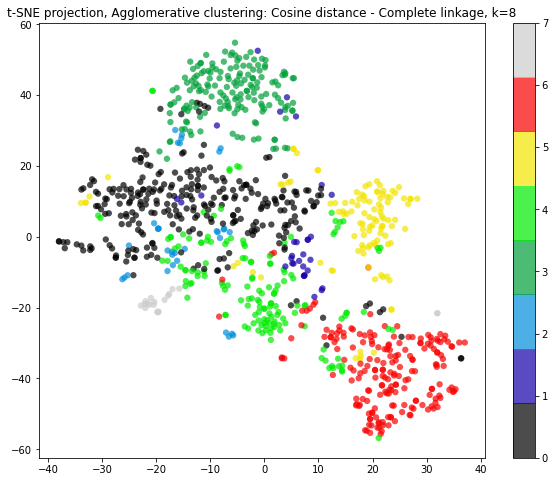

In [134]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=8
plot_tsne(X1_data1,k=8,label=agglo_models['cosine-complete'][1][7], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


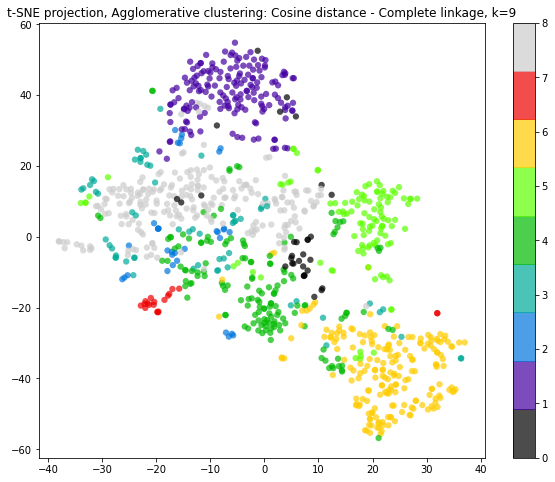

In [135]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=9
plot_tsne(X1_data1,k=9,label=agglo_models['cosine-complete'][1][8], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.72 µs


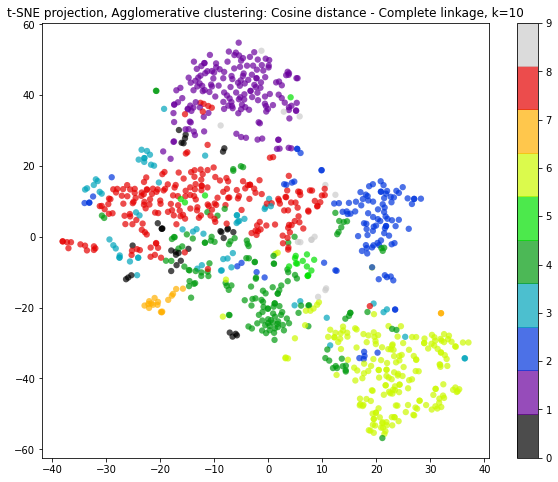

In [136]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - complete linkage, k=10
plot_tsne(X1_data1,k=10,label=agglo_models['cosine-complete'][1][9], title='Agglomerative clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.91 µs


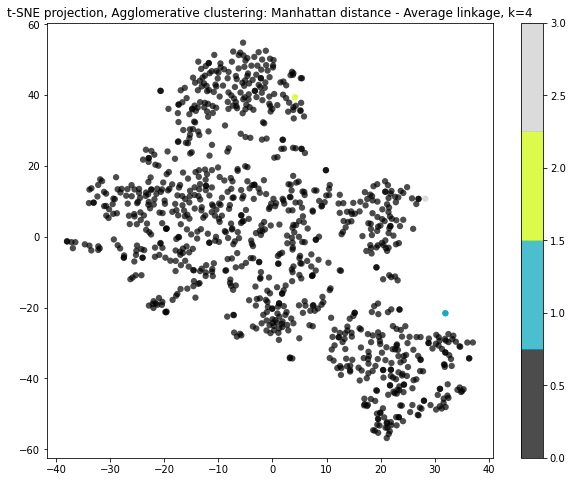

In [137]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - average linkage, k=4
plot_tsne(X1_data1,k=4,label=agglo_models['manhattan-average'][1][3], title='Agglomerative clustering: Manhattan distance - Average linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


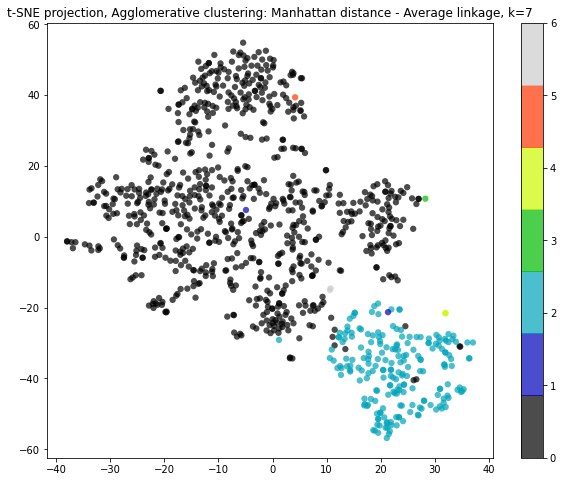

In [138]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - average linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['manhattan-average'][1][6], title='Agglomerative clustering: Manhattan distance - Average linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


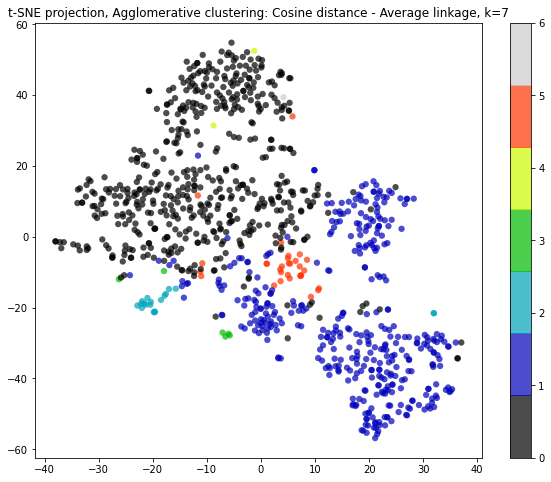

In [139]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - average linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['cosine-average'][1][6], title='Agglomerative clustering: Cosine distance - Average linkage')

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.39 µs


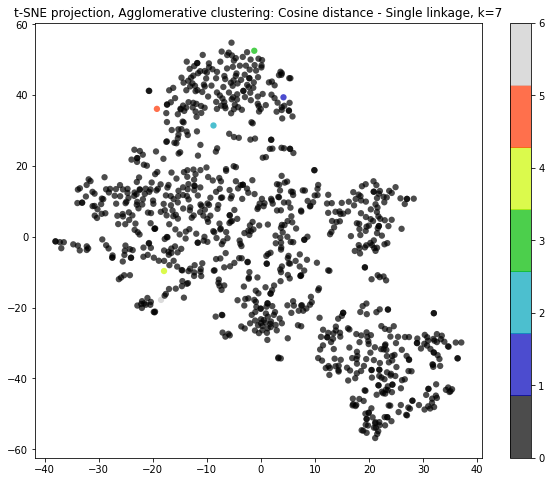

In [140]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - single linkage, k=7
plot_tsne(X1_data1,k=7,label=agglo_models['cosine-single'][1][6], title='Agglomerative clustering: Cosine distance - Single linkage')

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.34 µs


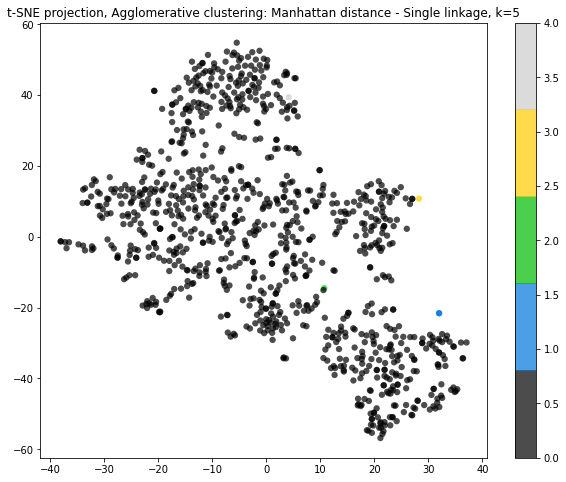

In [141]:
# use tSNE projection to plot the clusters for agglomerative manhattan distance - single linkage, k=5
plot_tsne(X1_data1,k=5,label=agglo_models['manhattan-single'][1][4], title='Agglomerative clustering: Manhattan distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


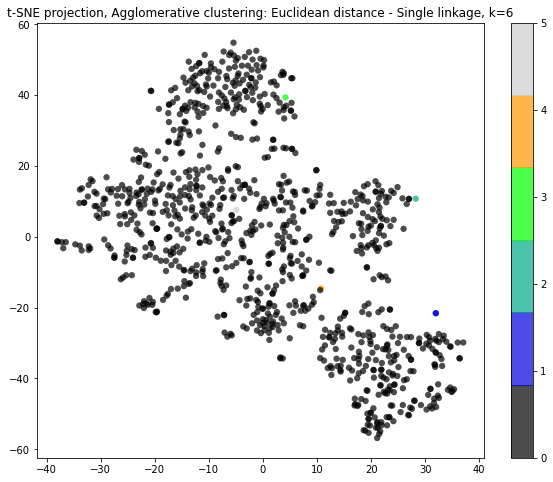

In [142]:
# use tSNE projection to plot the clusters for agglomerative euclidean distance - single linkage, k=6
plot_tsne(X1_data1,k=6,label=agglo_models['euclidean-single'][1][5], title='Agglomerative clustering: Euclidean distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


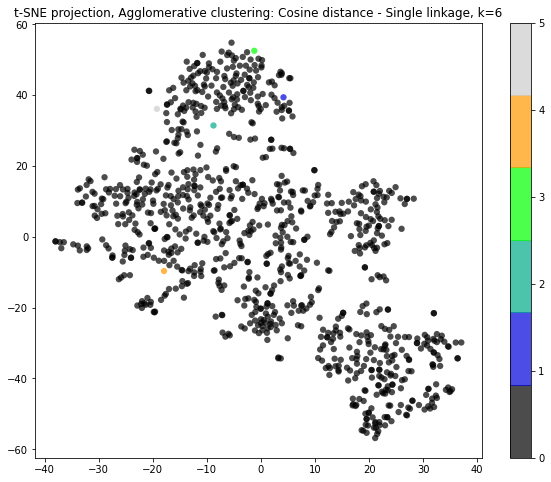

In [143]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - single linkage, k=6
plot_tsne(X1_data1,k=6,label=agglo_models['cosine-single'][1][5], title='Agglomerative clustering: Cosine distance - Single linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.68 µs


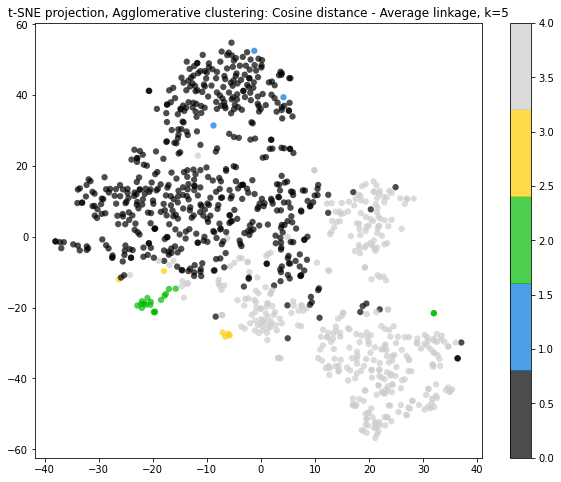

In [144]:
# use tSNE projection to plot the clusters for agglomerative cosine distance - average linkage, k=5
plot_tsne(X1_data1,k=5,label=agglo_models['cosine-average'][1][4], title='Agglomerative clustering: Cosine distance - Average linkage')

## 3.2 ICMLA Dataset

### Functions

In [0]:
# function to plot completeness scores using matplotlib
# see https://matplotlib.org/ for further info
def plot_completeness2(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(np.arange(2, k_range), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Completeness score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

# function to plot homogeneity using matplotlib
# see https://matplotlib.org/ for further info
def plot_homogeneity2(scores, k_range, ymin, ymax, title=''):
  plt.figure(figsize=(10, 6))
  plt.title(title)
  plt.plot(np.arange(2, k_range), scores, "bo-")
  plt.xlabel("$k$", fontsize=14)
  plt.ylabel("Homogeneity score", fontsize=14)
  plt.axis([0, k_range, ymin, ymax])
  plt.show()

# function to plot dendogram for hierarchy clustering
def plot_dendogram(X,method,metric,labels=y2_string,title=''):
  from scipy.cluster.hierarchy import dendrogram, fcluster, linkage

  linkage_matrix = linkage(X, method=method, metric=metric) #define the linkage_matrix using ward clustering pre-computed distances
  
  fig, ax = plt.subplots(figsize=(15, 20)) # set size
  ax = dendrogram(linkage_matrix, orientation="left", labels=y2_string)

  plt.tick_params(\
      axis= 'x',          # changes apply to the x-axis
      which='both',      # both major and minor ticks are affected
      bottom='off',      # ticks along the bottom edge are off
      top='off',         # ticks along the top edge are off
      labelbottom='off',
      labelsize=12
      )
  plt.tick_params(\
      axis= 'y',          # changes apply to the y-axis
      labelsize=12
      )
  plt.title(title, fontsize=16)
  plt.tight_layout() #show plot with tight layout

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=None):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=43)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train Hierarchical clustering 

Using scipy Hierarchy Clustering15, over 260 models were trained on Dataset 2 using k=1-49, three similarity measures (Euclidean, Cityblock and Cosine) and three distance metrics (single-link, average-link and complete-link). Having the gold clusters provided, the resulting models were evaluated using external measures: the Completeness and the Homogeneity scores.

In [146]:
# use scipy hierarchy linkage clustering to perform clustering 
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage

k_range4 = 50 # set the range of k's
X2_data3 = X_combine_pca # set the data to use

# set the metrics and linkages to use
metrics = ['euclidean','cityblock','cosine']
methods = ['single','complete','average']

# create an empty list and dictionary to store the results
names = []
agglo_models2 = dict()
labels = dict()

# use for loop to iterate over the above metrics and linkages
for metr in metrics:
  for meth in methods:
    # obtain the linkage matrix
    linkage_matrix = linkage(X2_data3, method=meth, metric=metr)
    
    # obtain the labels
    for k in range(2, k_range4):
      label = fcluster(linkage_matrix,t=k, criterion='maxclust')
      labels[k] = label
    
    # store and print the names
    name = metr + '-' + meth
    names.append(name)
    print(name)

    # store the results in a dictionary
    agglo_models2[name] = [labels]
    labels= dict()

euclidean-single
euclidean-complete
euclidean-average
cityblock-single
cityblock-complete
cityblock-average
cosine-single
cosine-complete
cosine-average


In [147]:
# check the results
agglo_models2['cosine-average'][0][24]

array([ 9, 10, 19,  9,  7, 21, 12, 10,  6, 11,  3,  2,  2,  2, 10, 18, 10,
       10, 13, 10,  1,  9,  1,  1,  1,  1,  3,  1,  1,  1, 22, 12,  6, 12,
       16, 18,  9,  2,  1, 24, 24,  8,  3,  2, 23,  8, 15, 11,  5, 11,  2,
        8, 18,  5, 16, 16, 22,  6, 13, 23, 22,  9, 17,  3, 19,  4,  5, 22,
       19, 19,  9,  5,  5, 21,  5,  2,  6,  4,  7, 20, 20, 11, 12, 12, 20,
       17, 24,  1, 16, 22, 22, 24, 22, 20, 14, 12, 13, 14, 11,  1,  3, 11,
        8,  8,  2], dtype=int32)

### First evaluation


**The Completeness Score**  
The completeness score measures the degree to which all points of a given class belong to the same cluster (a score of 1 means perfectly complete labeling).

In [0]:
# calculate the completeness and homogeneity scores
from  sklearn.metrics import completeness_score, homogeneity_score

# create an empty list to store the results
homo_agglo = dict()
comp_agglo = dict()
comps = []
homos = []

# use for loop to iterate over k=2-49
for name in names:
  for k in range(2, k_range4):
    # calculate completeness and homogeneity
    comp = completeness_score(y2, agglo_models2[name][0][k])
    homo = homogeneity_score(y2, agglo_models2[name][0][k])
    # store the results in the lists
    comps.append(comp)
    homos.append(homo)
  # store all results in a dictionary
  comp_agglo[name] = comps
  homo_agglo[name] = homos
  comps = []
  homos = []

In [149]:
# convert Completeness scores into a dataframe using pandas
df_comps = pd.DataFrame({"k":np.arange(2,50), "cosine-single":comp_agglo['cosine-single'],
                           "cosine-average":comp_agglo['cosine-average'],
                           "cosine-complete":comp_agglo['cosine-complete'],
                           "euclidean-single":comp_agglo['euclidean-single'],
                           "euclidean-average":comp_agglo['euclidean-average'],
                           "euclidean-complete":comp_agglo['euclidean-complete'],
                           "cityblock-single":comp_agglo['cityblock-single'],
                           "cityblock-average":comp_agglo['cityblock-average'],
                           "cityblock-complete":comp_agglo['cityblock-complete'],
                           })
df_comps.head(30)

,k,cosine-single,cosine-average,cosine-complete,euclidean-single,euclidean-average,euclidean-complete,cityblock-single,cityblock-average,cityblock-complete
0,2,0.601829,0.540787,0.314942,0.669615,0.669615,0.602672,0.669615,0.520184,0.327161
1,3,0.549282,0.437335,0.379742,0.652103,0.622332,0.622332,0.652103,0.462619,0.382375
2,4,0.550750,0.461752,0.381278,0.632470,0.609145,0.390259,0.653476,0.480907,0.449613
3,5,0.560877,0.468268,0.424226,0.581485,0.562680,0.414303,0.592560,0.507973,0.446936
4,6,0.532538,0.499711,0.436176,0.578208,0.550648,0.455200,0.588248,0.529484,0.464956
5,7,0.480619,0.522066,0.462697,0.584603,0.468129,0.468003,0.615533,0.557622,0.479665
6,8,0.487390,0.532924,0.479177,0.585074,0.489725,0.500475,0.613601,0.567556,0.487499
7,9,0.490479,0.547647,0.505898,0.593008,0.493800,0.510189,0.608493,0.549186,0.486495
8,10,0.495397,0.557242,0.515105,0.572367,0.517146,0.516874,0.607621,0.558417,0.500508
9,11,0.504567,0.558648,0.520747,0.579144,0.520818,0.528245,0.619001,0.566025,0.510529


Overall, the single-link models produced higher completeness scores than the average and complete-link models at lower k’s, but the scores were increasing and started so converge as k was increased, and all models produced similar scores a higher k’s. At k=24, the Cosine-average, Cityblock-average and Cityblock-complete models produced the highest score at 0.61, followed closely by Cityblock-single (0.60). 

In [150]:
# convert Completeness scores into a dataframe using pandas
df_homos = pd.DataFrame({"k":np.arange(2,50), "cosine-single":homo_agglo['cosine-single'],
                           "cosine-average":homo_agglo['cosine-average'],
                           "cosine-complete":homo_agglo['cosine-complete'],
                           "euclidean-single":homo_agglo['euclidean-single'],
                           "euclidean-average":homo_agglo['euclidean-average'],
                           "euclidean-complete":homo_agglo['euclidean-complete'],
                           "cityblock-single":homo_agglo['cityblock-single'],
                           "cityblock-average":homo_agglo['cityblock-average'],
                           "cityblock-complete":homo_agglo['cityblock-complete'],
                           })
df_homos.head(30)

,k,cosine-single,cosine-average,cosine-complete,euclidean-single,euclidean-average,euclidean-complete,cityblock-single,cityblock-average,cityblock-complete
0,2,0.010231,0.091853,0.055698,0.034243,0.034243,0.059888,0.034243,0.015501,0.066461
1,3,0.025674,0.145212,0.114170,0.044356,0.092902,0.092902,0.044356,0.091631,0.130819
2,4,0.035057,0.191606,0.157488,0.053680,0.108555,0.130876,0.055463,0.164212,0.176023
3,5,0.045171,0.209099,0.199839,0.093608,0.162940,0.148708,0.095391,0.189984,0.213099
4,6,0.083535,0.256978,0.236069,0.102679,0.208492,0.202222,0.104462,0.211777,0.255902
5,7,0.114834,0.300979,0.266376,0.113499,0.241010,0.239988,0.117064,0.237218,0.282055
6,8,0.124425,0.332491,0.299005,0.123264,0.270806,0.294221,0.126862,0.266824,0.305943
7,9,0.133221,0.352798,0.341293,0.190979,0.285930,0.330886,0.135867,0.317825,0.323706
8,10,0.153797,0.386735,0.365724,0.211322,0.330704,0.347103,0.153168,0.340473,0.350734
9,11,0.159543,0.402795,0.385971,0.223009,0.361698,0.374395,0.160697,0.369539,0.365080


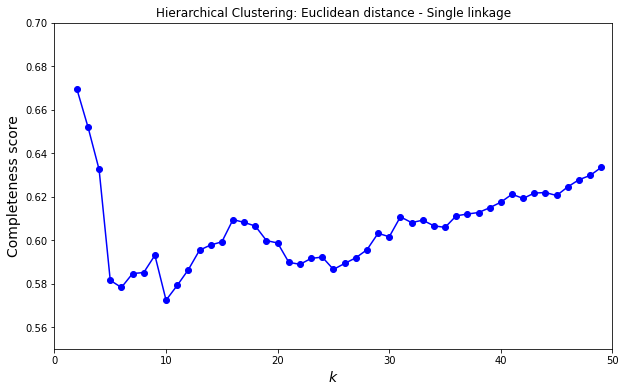

In [151]:
# plot the completeness scores for hierarchical clustering: euclidean distance - single linkage
plot_completeness2(comp_agglo['euclidean-single'], k_range=k_range4, ymin=0.55, ymax=0.7, title='Hierarchical Clustering: Euclidean distance - Single linkage')

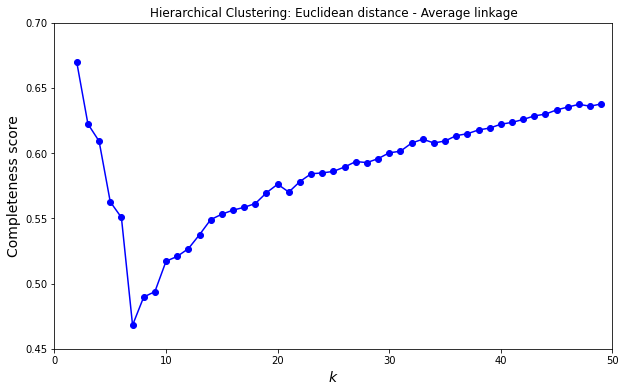

In [152]:
# plot the completeness scores for hierarchical clustering: euclidean distance - average linkage
plot_completeness2(comp_agglo['euclidean-average'], k_range=k_range4, ymin=0.45, ymax=0.7, title='Hierarchical Clustering: Euclidean distance - Average linkage')

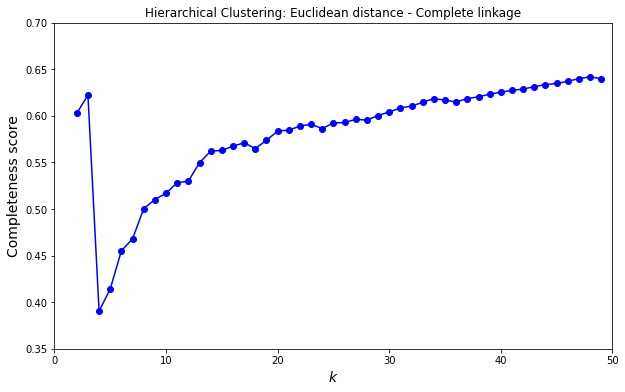

In [153]:
# plot the completeness scores for hierarchical clustering: euclidean distance - complete linkage
plot_completeness2(comp_agglo['euclidean-complete'], k_range=k_range4, ymin=0.35, ymax=0.7, title='Hierarchical Clustering: Euclidean distance - Complete linkage')

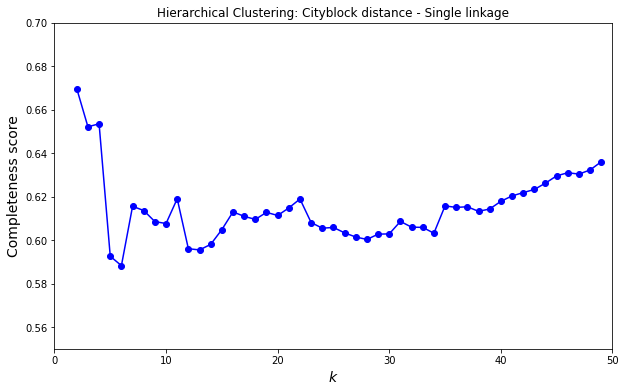

In [154]:
# plot the completeness scores for hierarchical clustering: cityblock distance - single linkage
plot_completeness2(comp_agglo['cityblock-single'], k_range=k_range4, ymin=0.55, ymax=0.7, title='Hierarchical Clustering: Cityblock distance - Single linkage')

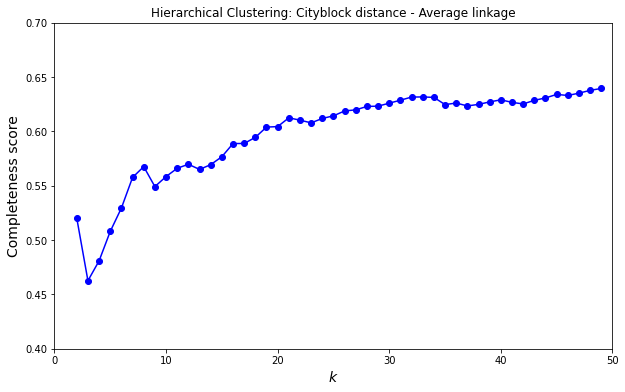

In [155]:
# plot the completeness scores for hierarchical clustering: cityblock distance - average linkage
plot_completeness2(comp_agglo['cityblock-average'], k_range=k_range4, ymin=0.4, ymax=0.7, title='Hierarchical Clustering: Cityblock distance - Average linkage')

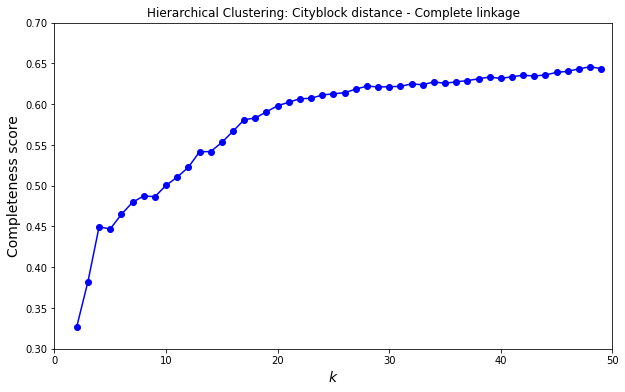

In [156]:
# plot the completeness scores for hierarchical clustering: cityblock distance - complete linkage
plot_completeness2(comp_agglo['cityblock-complete'], k_range=k_range4, ymin=0.3, ymax=0.7, title='Hierarchical Clustering: Cityblock distance - Complete linkage')

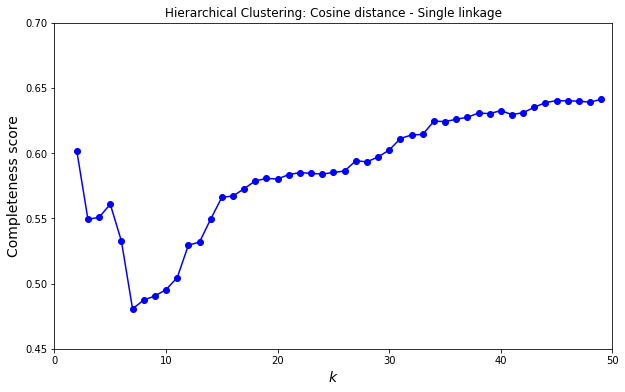

In [157]:
# plot the completeness scores for hierarchical clustering: cosine distance - single linkage
plot_completeness2(comp_agglo['cosine-single'], k_range=k_range4, ymin=0.45, ymax=0.7, title='Hierarchical Clustering: Cosine distance - Single linkage')

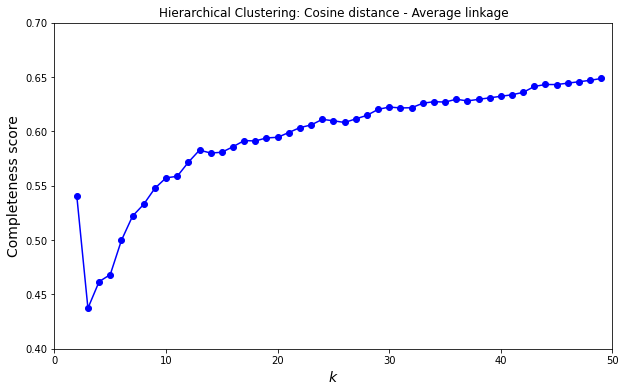

In [158]:
# plot the completeness scores for hierarchical clustering: cosine distance - average linkage
plot_completeness2(comp_agglo['cosine-average'], k_range=k_range4, ymin=0.4, ymax=0.7, title='Hierarchical Clustering: Cosine distance - Average linkage')

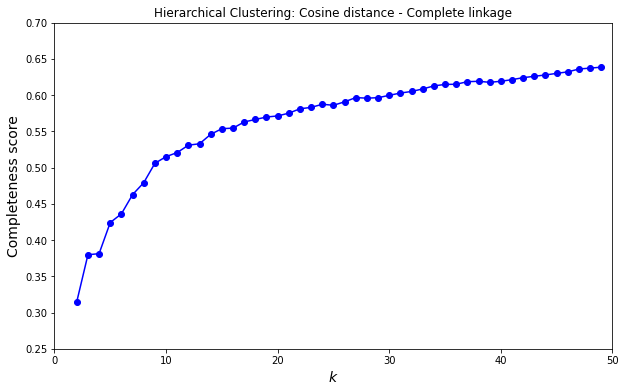

In [159]:
# plot the completeness scores for hierarchical clustering: cosine distance - complete linkage
plot_completeness2(comp_agglo['cosine-complete'], k_range=k_range4, ymin=0.25, ymax=0.7, title='Hierarchical Clustering: Cosine distance - Complete linkage')

### Second evaluation 

**The Homogeneity Score**  
The homogeneity score measures the degree to which all of the clusters contain only points of a single class (a score of 1 means perfectly homogeneous labeling).

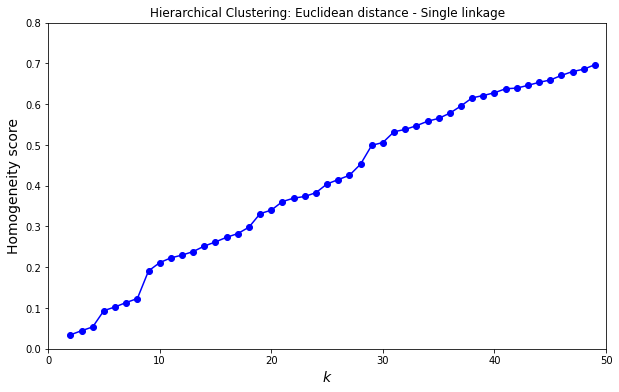

In [160]:
# plot the homogeneity scores for hierarchical clustering: euclidean distance - single linkage
plot_homogeneity2(homo_agglo['euclidean-single'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Euclidean distance - Single linkage')

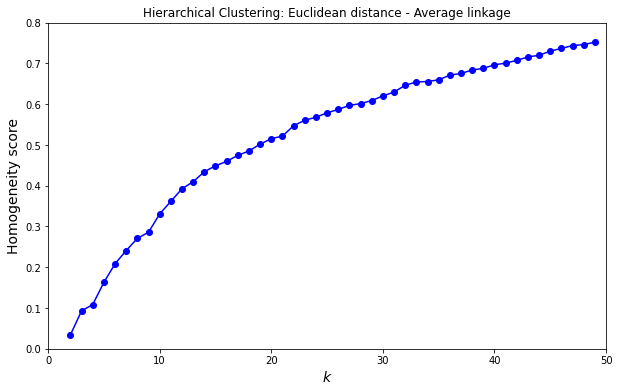

In [161]:
# plot the homogeneity scores for hierarchical clustering: euclidean distance - average linkage
plot_homogeneity2(homo_agglo['euclidean-average'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Euclidean distance - Average linkage')

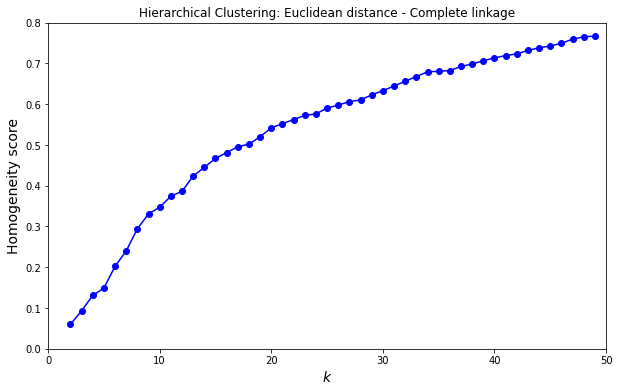

In [162]:
# plot the homogeneity scores for hierarchical clustering: euclidean distance - complete linkage
plot_homogeneity2(homo_agglo['euclidean-complete'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Euclidean distance - Complete linkage')

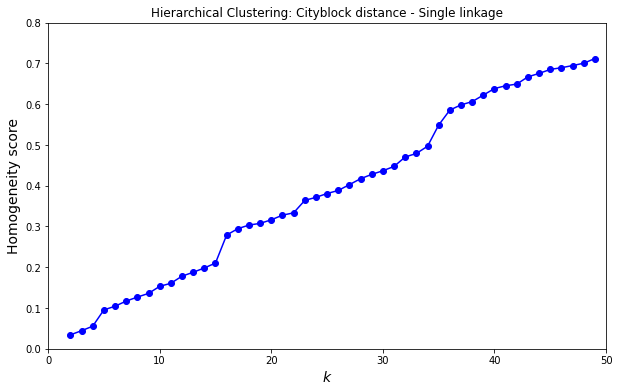

In [163]:
# plot the homogeneity scores for hierarchical clustering: cityblock distance - single linkage
plot_homogeneity2(homo_agglo['cityblock-single'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Cityblock distance - Single linkage')

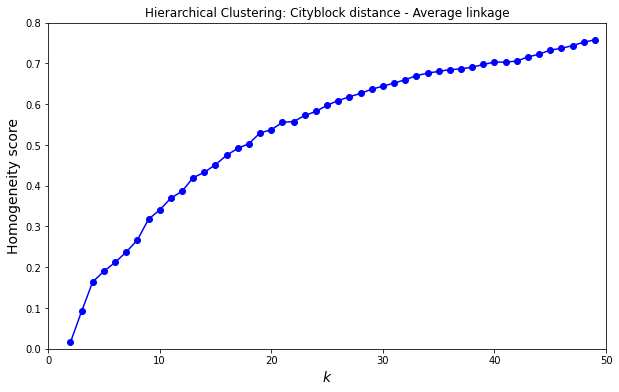

In [164]:
# plot the homogeneity scores for hierarchical clustering: cityblock distance - average linkage
plot_homogeneity2(homo_agglo['cityblock-average'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Cityblock distance - Average linkage')

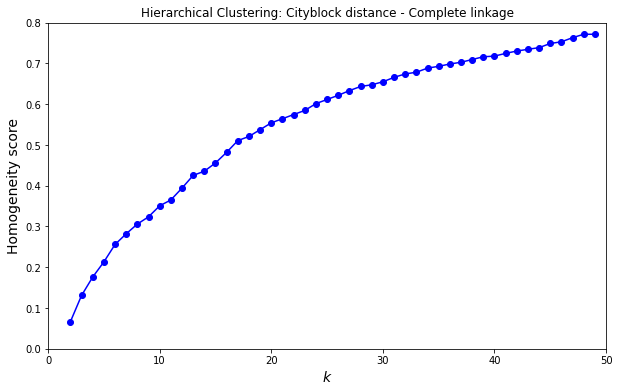

In [165]:
# plot the homogeneity scores for hierarchical clustering: cityblock distance - complete linkage
plot_homogeneity2(homo_agglo['cityblock-complete'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Cityblock distance - Complete linkage')

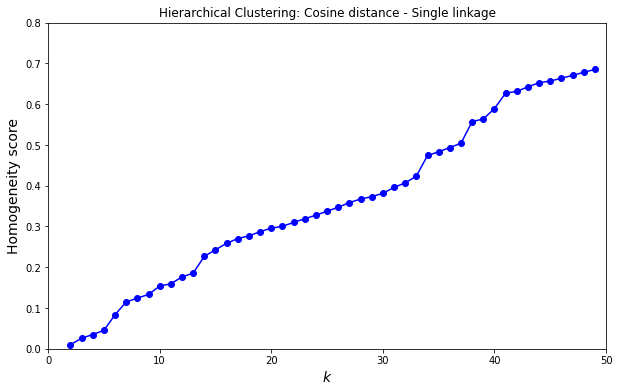

In [166]:
# plot the homogeneity scores for hierarchical clustering: cosine distance - single linkage
plot_homogeneity2(homo_agglo['cosine-single'], k_range=k_range4, ymin=-0, ymax=0.8, title='Hierarchical Clustering: Cosine distance - Single linkage')

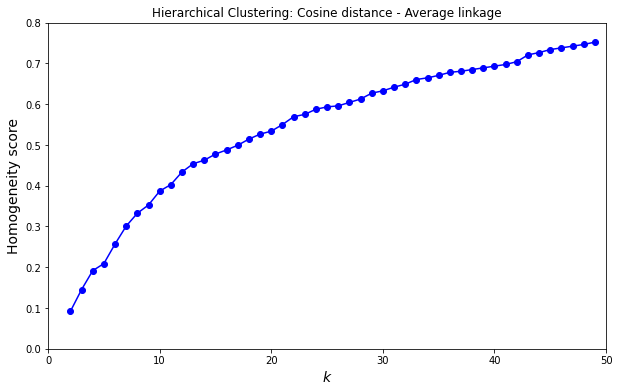

In [167]:
# plot the homogeneity scores for hierarchical clustering: cosine distance - average linkage
plot_homogeneity2(homo_agglo['cosine-average'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Cosine distance - Average linkage')

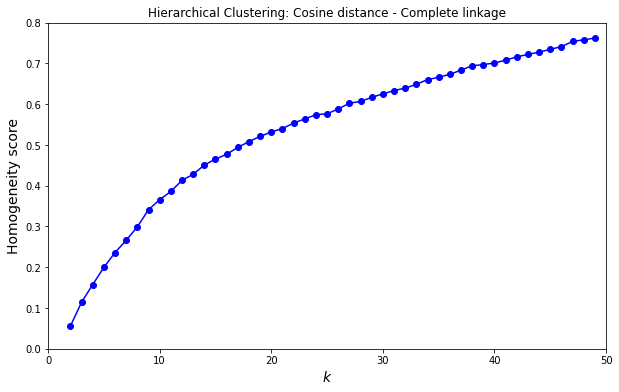

In [168]:
# plot the homogeneity scores for hierarchical clustering: cosine distance - complete linkage
plot_homogeneity2(homo_agglo['cosine-complete'], k_range=k_range4, ymin=0, ymax=0.8, title='Hierarchical Clustering: Cosine distance - Complete linkage')

The homogeneity scores for the single-link models were mostly lower than the average and complete-links. However, the scores were increasing as k was increased, and at k=24, the Cityblock-complete had the highest score (0.60), followed by Cosine-average (0.59) and Euclidean-complete (0.58).

### Plot Clusters 

**t-SNE projections**  
At lower k’s, the average and the complete-link showed more balanced clusters than the single-link. At k=24, all models produced reasonably well separated, but different clusters.

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


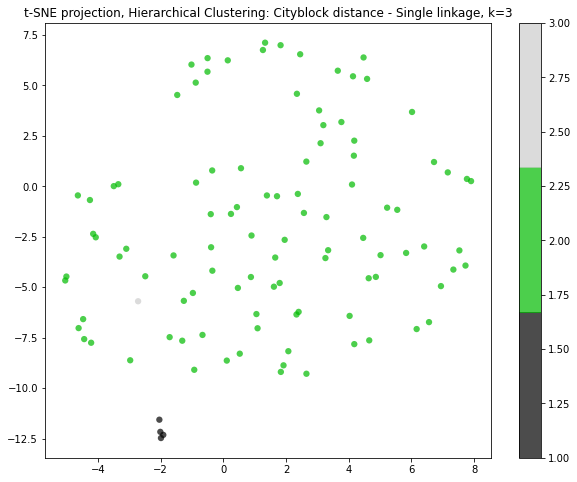

In [169]:
# use tSNE projection to plot the clusters for hierarchical cityblock distance - single linkage, k=3
plot_tsne(X2_data3,k=3,label=agglo_models2['cityblock-single'][0][3], title='Hierarchical Clustering: Cityblock distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


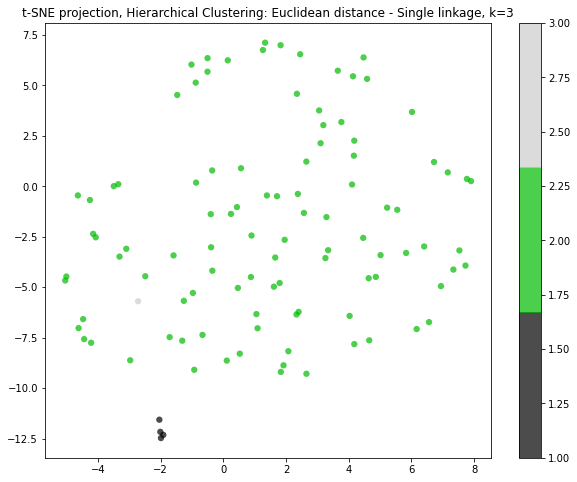

In [170]:
# use tSNE projection to plot the clusters for hierarchical euclidean distance - single linkage, k=3
plot_tsne(X2_data3,k=3,label=agglo_models2['euclidean-single'][0][3], title='Hierarchical Clustering: Euclidean distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


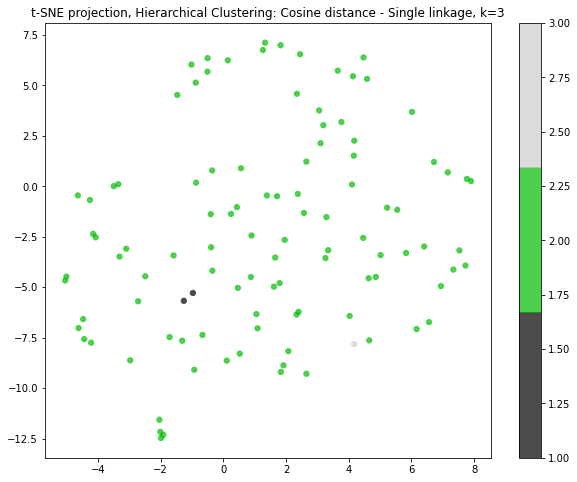

In [171]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - single linkage, k=3
plot_tsne(X2_data3,k=3,label=agglo_models2['cosine-single'][0][3], title='Hierarchical Clustering: Cosine distance - Single linkage')

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.91 µs


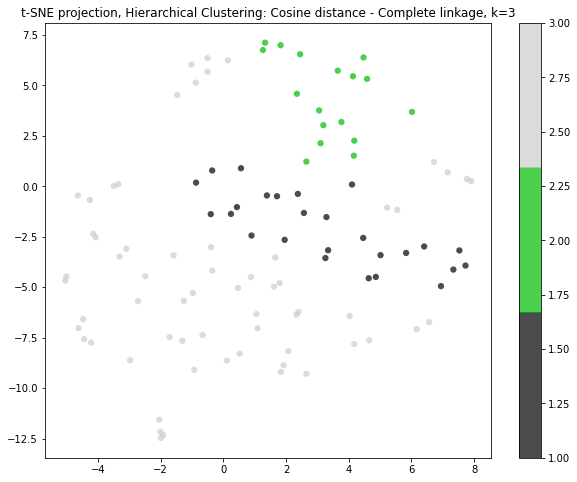

In [172]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - complete linkage, k=3
plot_tsne(X2_data3,k=3,label=agglo_models2['cosine-complete'][0][3], title='Hierarchical Clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.48 µs


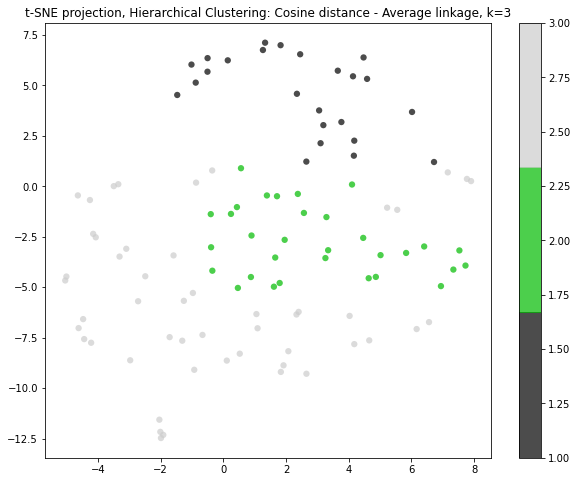

In [173]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - average linkage, k=3
plot_tsne(X2_data3,k=3,label=agglo_models2['cosine-average'][0][3], title='Hierarchical Clustering: Cosine distance - Average linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.72 µs


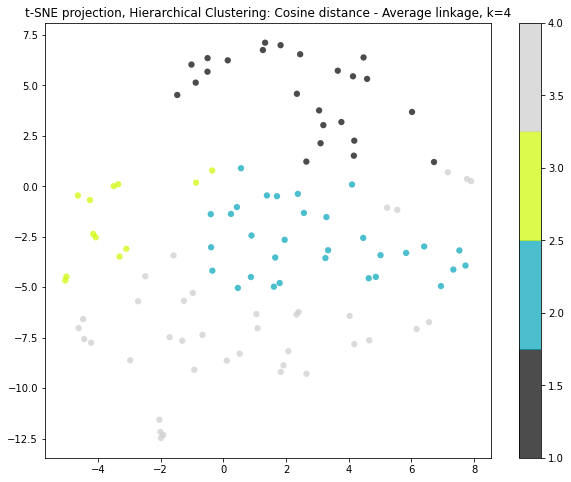

In [174]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - average linkage, k=4
plot_tsne(X2_data3,k=4,label=agglo_models2['cosine-average'][0][4], title='Hierarchical Clustering: Cosine distance - Average linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


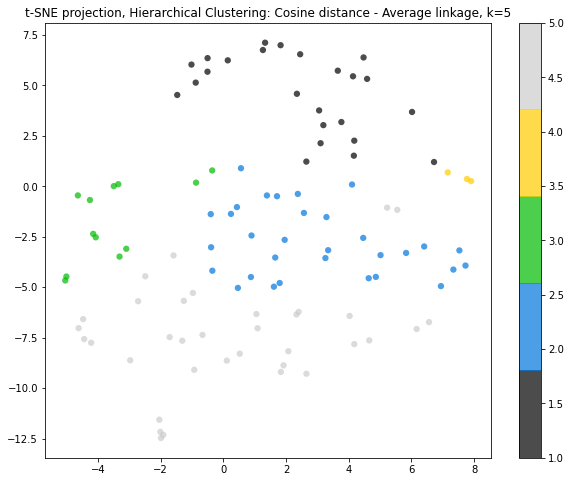

In [175]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - average linkage, k=5
plot_tsne(X2_data3,k=5,label=agglo_models2['cosine-average'][0][5], title='Hierarchical Clustering: Cosine distance - Average linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


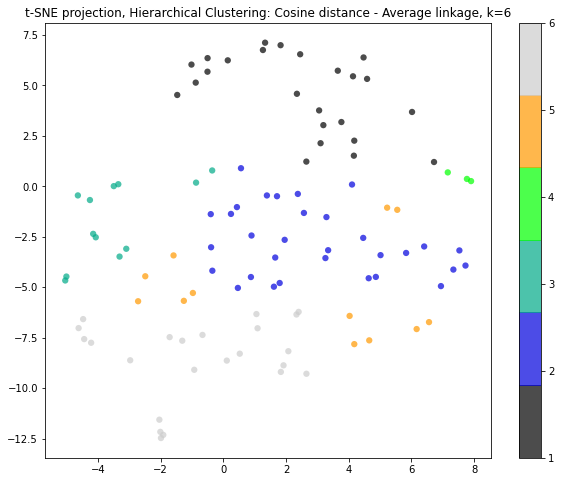

In [176]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - average linkage, k=6
plot_tsne(X2_data3,k=6,label=agglo_models2['cosine-average'][0][6], title='Hierarchical Clustering: Cosine distance - Average linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.63 µs


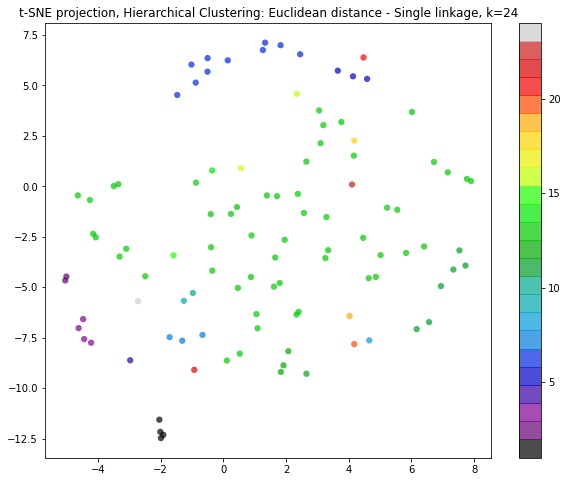

In [177]:
# use tSNE projection to plot the clusters for hierarchical euclidean distance - single linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['euclidean-single'][0][24], title='Hierarchical Clustering: Euclidean distance - Single linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.48 µs


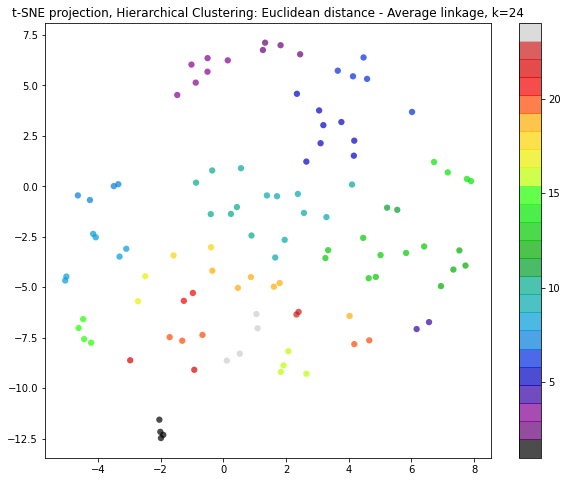

In [178]:
# use tSNE projection to plot the clusters for hierarchical euclidean distance - average linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['euclidean-average'][0][24], title='Hierarchical Clustering: Euclidean distance - Average linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


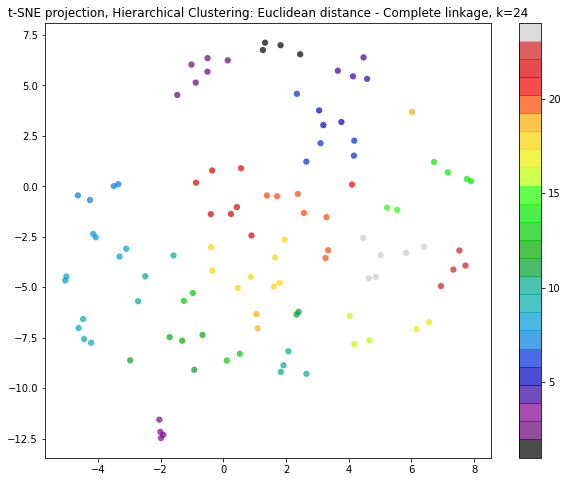

In [179]:
# use tSNE projection to plot the clusters for hierarchical euclidean distance - complete linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['euclidean-complete'][0][24], title='Hierarchical Clustering: Euclidean distance - Complete linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.72 µs


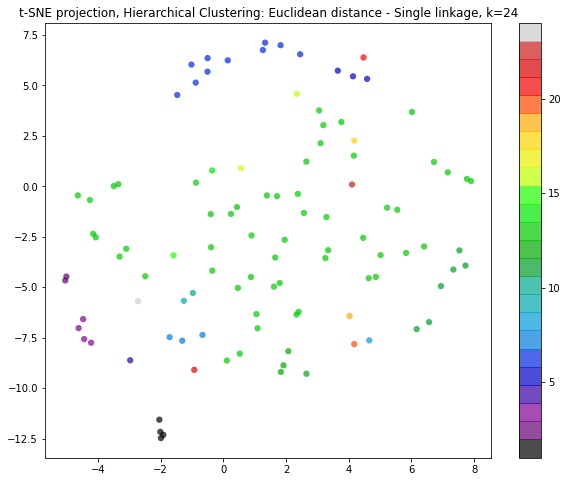

In [180]:
# use tSNE projection to plot the clusters for hierarchical euclidean distance - single linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['euclidean-single'][0][24], title='Hierarchical Clustering: Euclidean distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


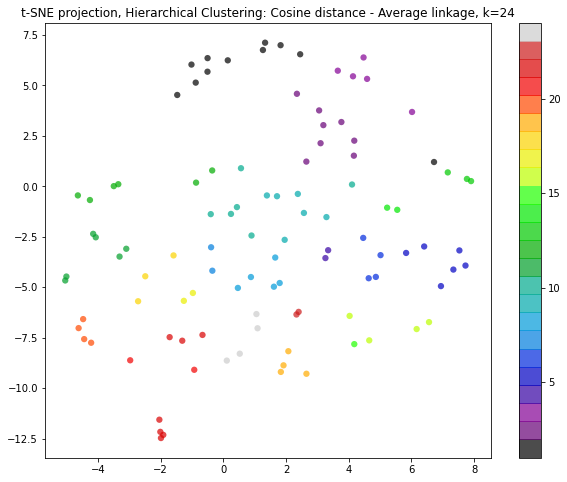

In [181]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - average linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cosine-average'][0][24], title='Hierarchical Clustering: Cosine distance - Average linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


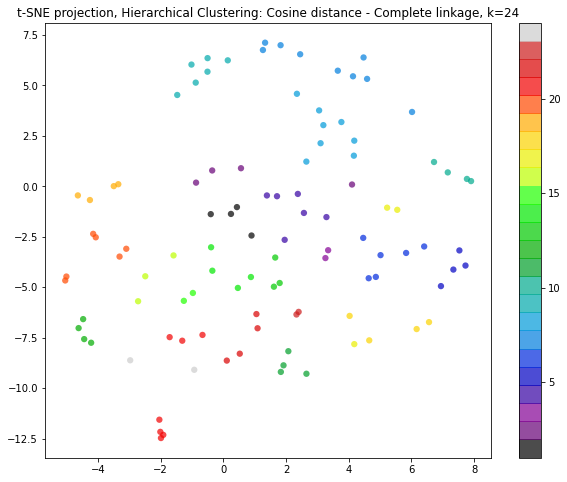

In [182]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - complete linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cosine-complete'][0][24], title='Hierarchical Clustering: Cosine distance - Complete linkage')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.48 µs


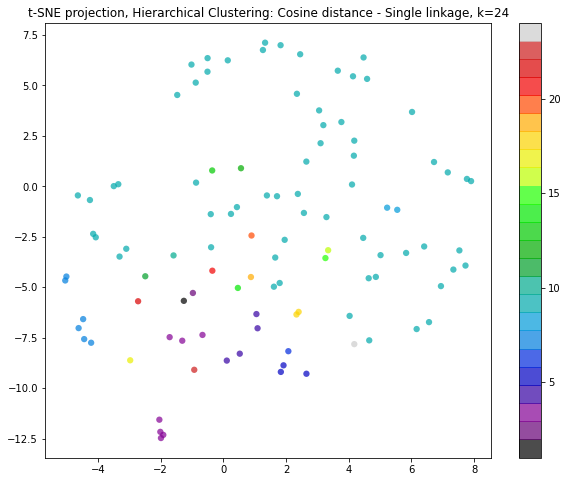

In [183]:
# use tSNE projection to plot the clusters for hierarchical cosine distance - single linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cosine-single'][0][24], title='Hierarchical Clustering: Cosine distance - Single linkage')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


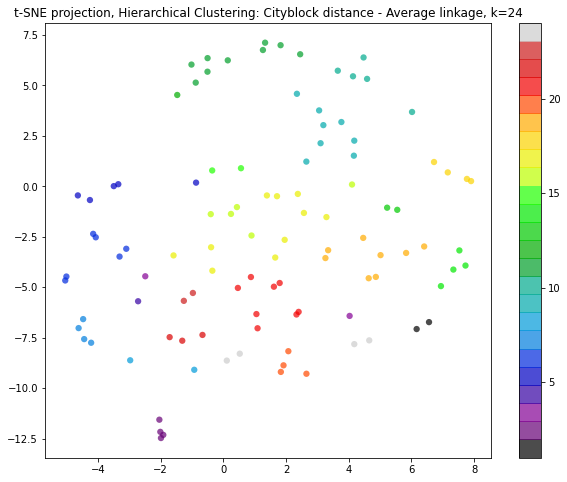

In [184]:
# use tSNE projection to plot the clusters for hierarchical cityblock distance - average linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cityblock-average'][0][24], title='Hierarchical Clustering: Cityblock distance - Average linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


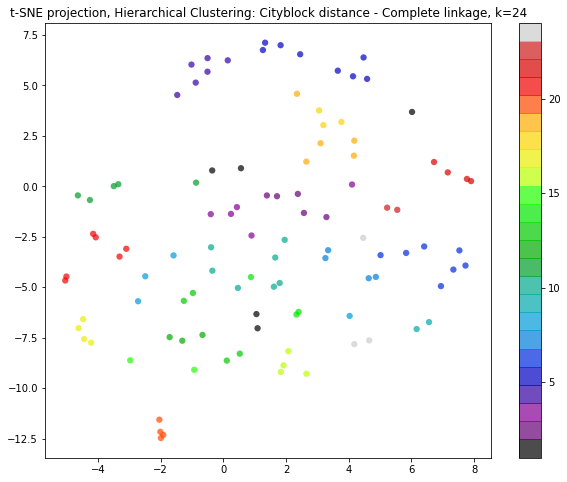

In [185]:
# use tSNE projection to plot the clusters for hierarchical cityblock distance - complete linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cityblock-complete'][0][24], title='Hierarchical Clustering: Cityblock distance - Complete linkage')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.2 µs


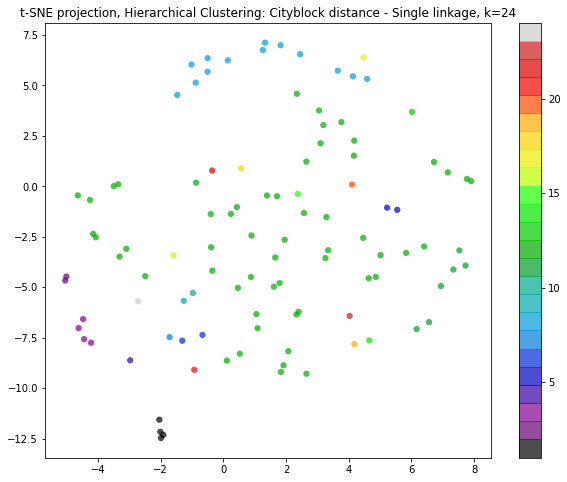

In [186]:
# use tSNE projection to plot the clusters for hierarchical cityblock distance - single linkage, k=24
plot_tsne(X2_data3,k=24,label=agglo_models2['cityblock-single'][0][24], title='Hierarchical Clustering: Cityblock distance - Single linkage')

**Dendogram**  
On the dendogram, the average and complete-link also showed better groupings than the single-link as more points from the same session such as Feature Extraction and Selection were grouped together (Figure 5.2.2j-l). Of the three similarity measures, the Cosine seemed to plot better than the Euclidean or Cityblock. Instead of measuring the actual distance, the Cosine measured the angle between points, and for our sparse data, it seemed to work quite well.

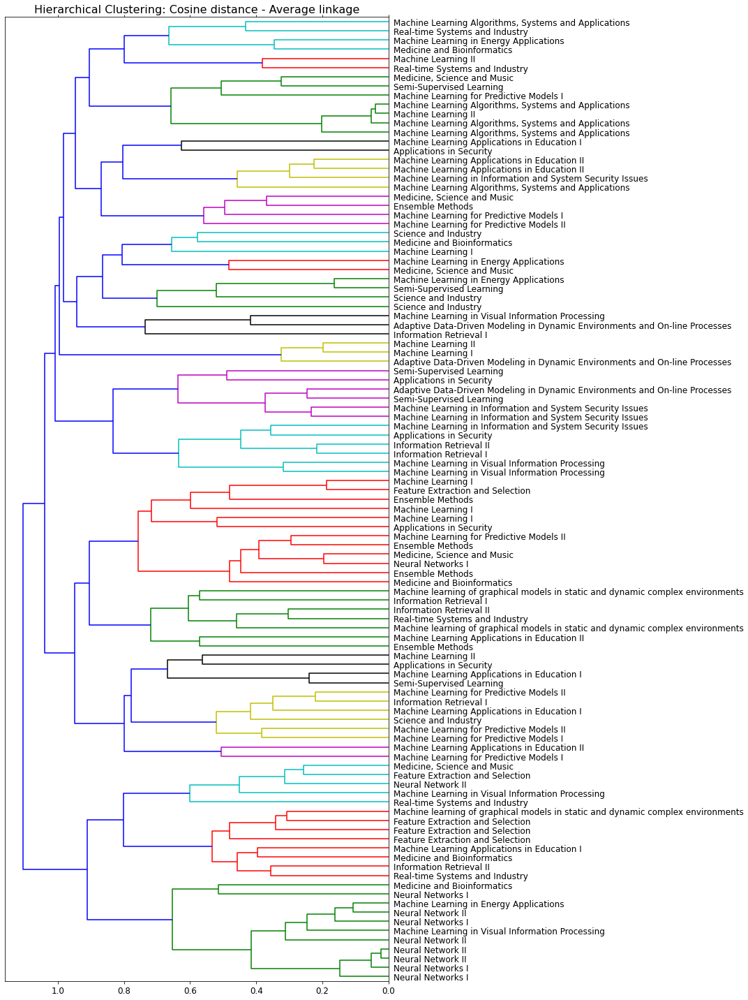

In [187]:
# plot the dendogram for hierarchical clustering: cosine distance - average linkage
plot_dendogram(X2_data3,method='average',metric='cosine',labels=y2_string,title='Hierarchical Clustering: Cosine distance - Average linkage')

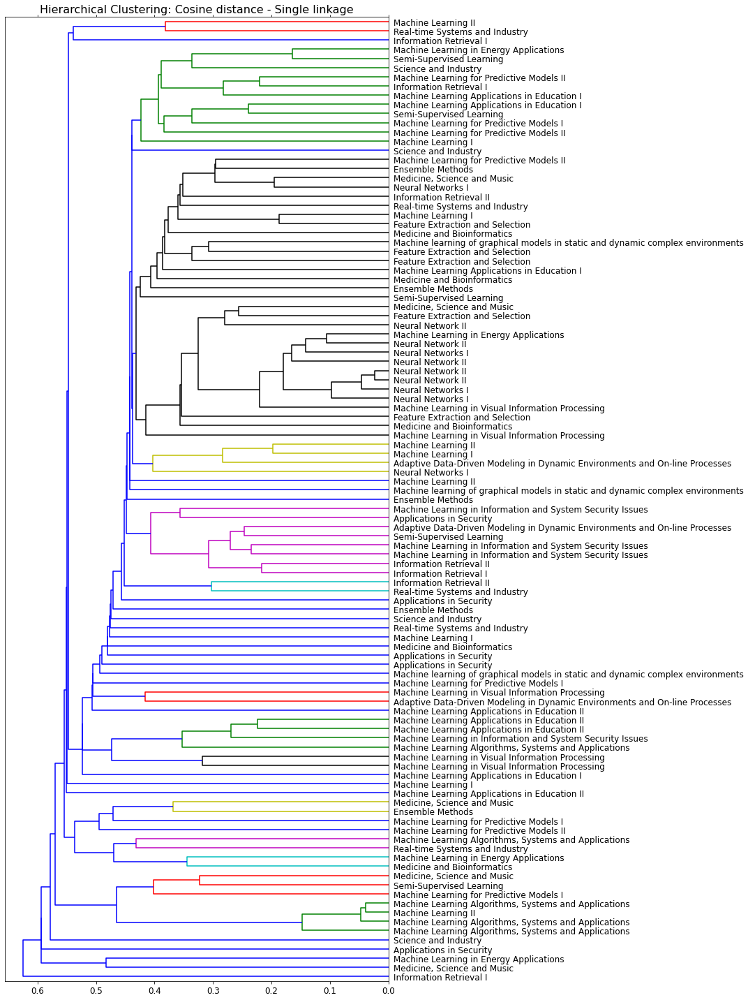

In [188]:
# plot the dendogram for hierarchical clustering: cosine distance - single linkage
plot_dendogram(X2_data3,method='single',metric='cosine',labels=y2_string,title='Hierarchical Clustering: Cosine distance - Single linkage')

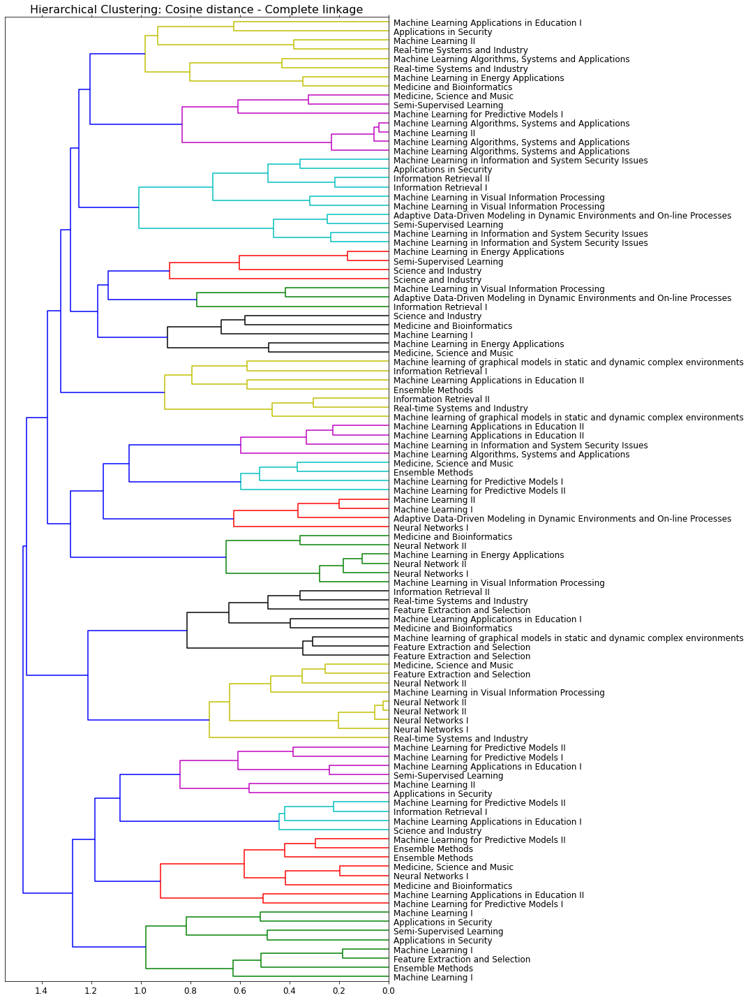

In [189]:
# plot the dendogram for hierarchical clustering: cosine distance - complete linkage
plot_dendogram(X2_data3,method='complete',metric='cosine',labels=y2_string,title='Hierarchical Clustering: Cosine distance - Complete linkage')

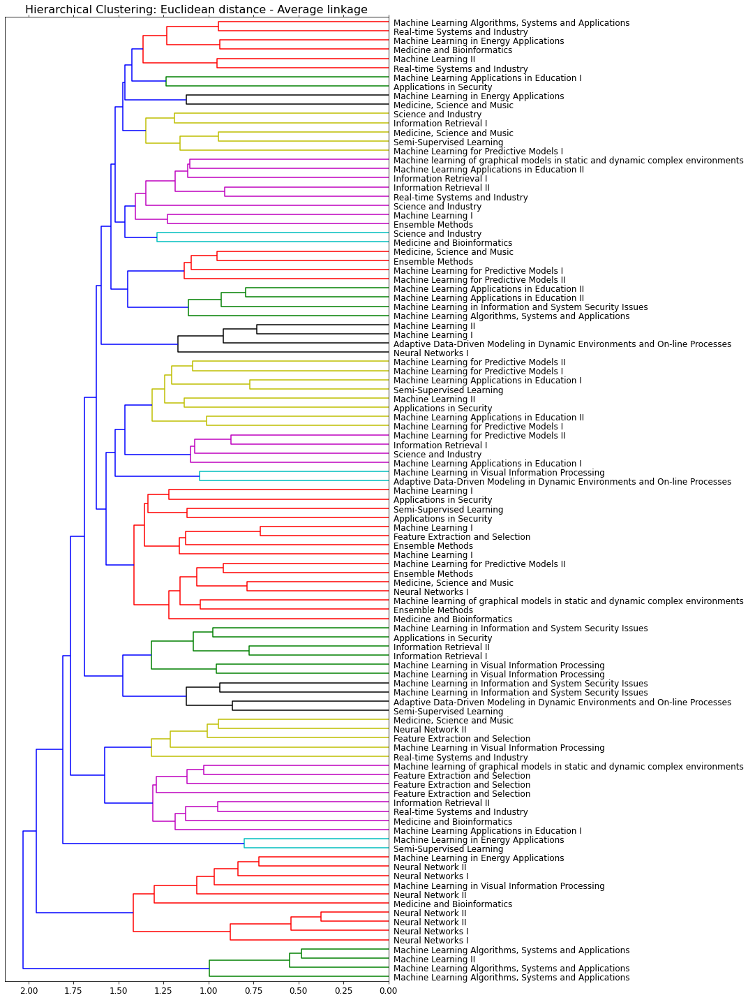

In [190]:
# plot the dendogram for hierarchical clustering: euclidean distance - average linkage
plot_dendogram(X2_data3,method='average',metric='euclidean',labels=y2_string,title='Hierarchical Clustering: Euclidean distance - Average linkage')

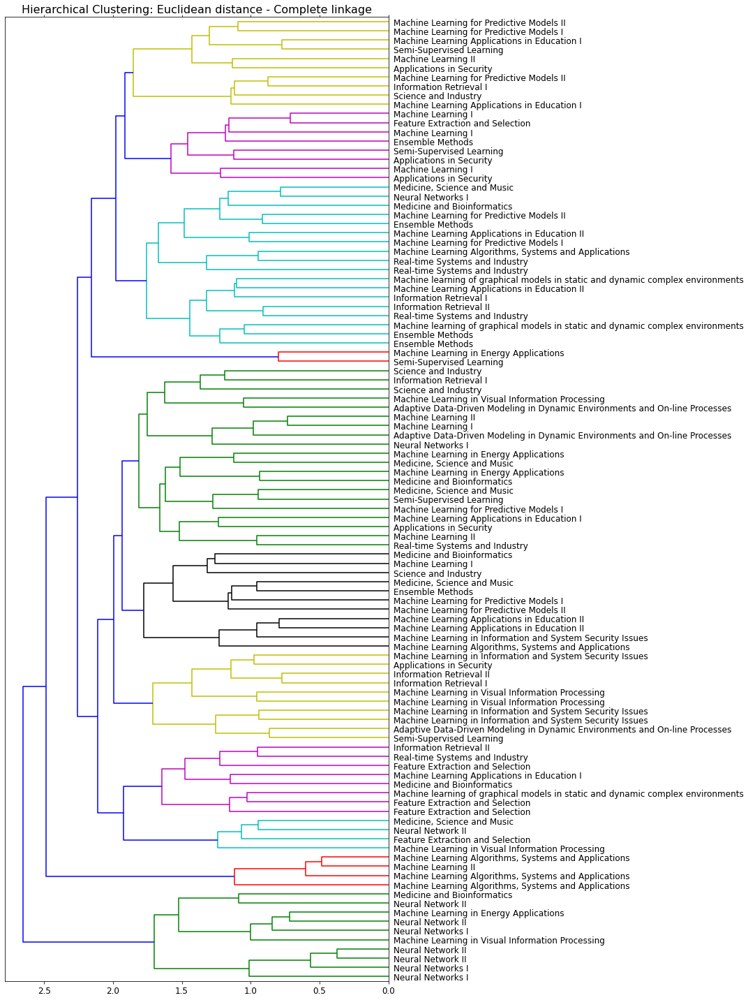

In [191]:
# plot the dendogram for hierarchical clustering: euclidean distance - complete linkage
plot_dendogram(X2_data3,method='complete',metric='euclidean',labels=y2_string,title='Hierarchical Clustering: Euclidean distance - Complete linkage')

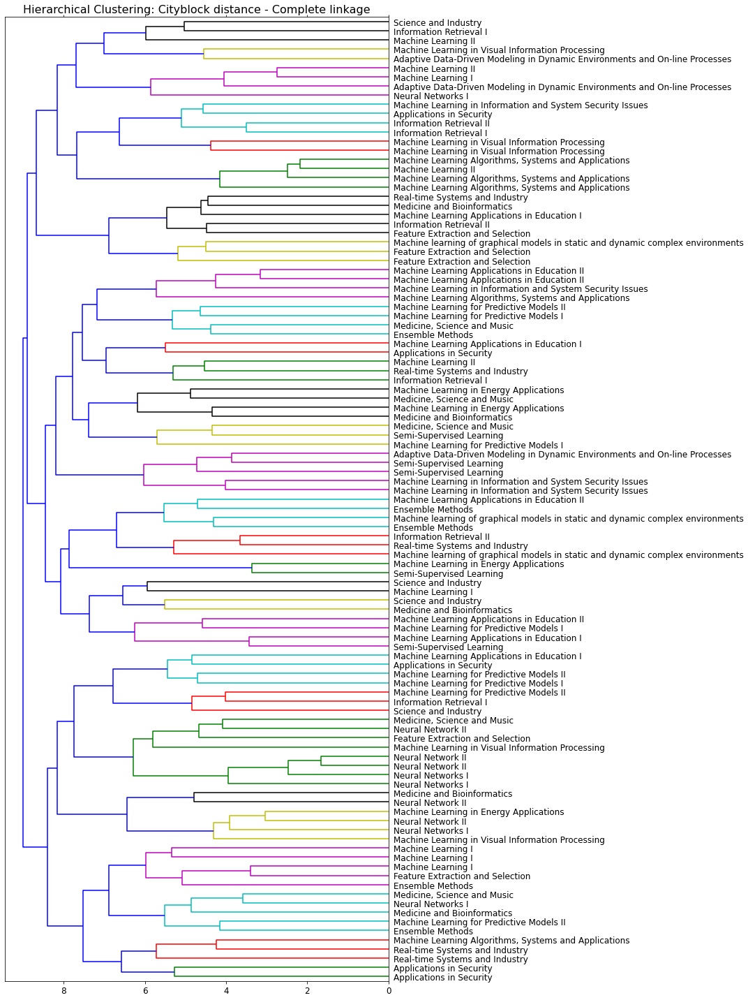

In [192]:
# plot the dendogram for hierarchical clustering: cityblock distance - complete linkage
plot_dendogram(X2_data3,method='complete',metric='cityblock',labels=y2_string,title='Hierarchical Clustering: Cityblock distance - Complete linkage')

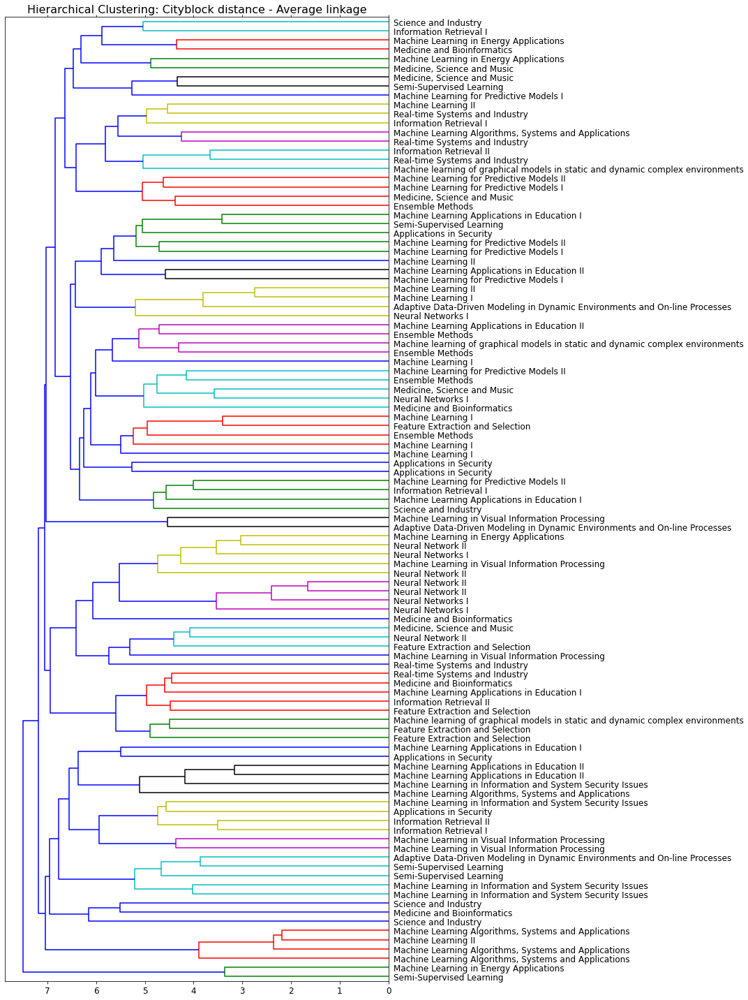

In [193]:
# plot the dendogram for hierarchical clustering: cityblock distance - average linkage
plot_dendogram(X2_data3,method='average',metric='cityblock',labels=y2_string,title='Hierarchical Clustering: Cityblock distance - Average linkage')

**Labelling tables**  
The below is the labelling table for the proposed Cosine-average with k=24.

In [194]:
# create a dataframe using pandas to show the resulting clustering for k-means euclidean, k=24
pd.set_option('display.max_rows', 105) # set the settings to we can see 105 rows (https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.set_option.html)
data2_label24hca = pd.DataFrame({"label":agglo_models2['cosine-average'][0][24], "session":y2_string})
data2_label24hca.sort_values(by='label')

,label,session
22,1,Neural Networks I
38,1,Medicine and Bioinformatics
99,1,Machine Learning in Visual Information Processing
87,1,Machine Learning in Energy Applications
29,1,Neural Network II
28,1,Neural Network II
27,1,Neural Network II
25,1,Neural Network II
24,1,Neural Networks I
23,1,Neural Networks I




---


# 4. DBSCAN Clustering

## 4.1 Travel Review Dataset

### Functions

In [0]:
# function to find the best parameters for DBSCAN
def dbscan_grid(X, epsilons, min_samples, metrics, high_range):  
  from sklearn.cluster import DBSCAN
  from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
  # set the min db and max ch scores
  dbscore_min = 999999
  chscore_max = 0

  # create empty lists for each variable to store the results
  dbscores = []
  chscores = []
  x_epsilons = []
  x_min_samples = []
  nclusters = []

  # iterate over the epsilons and minimum samples
  for eps in epsilons:
    for min_sample in min_samples:
      for metric in metrics:
        # create an instance of the DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_sample, metric=metric)
        # fit the model
        dbscan.fit(X)
        # get the labels
        labels = dbscan.labels_
        # get the number of clusters produced by the model
        num_cluster = len(np.unique(labels)) 

        # calculate Davies-Bouldin and Calinski scores if the number
        # of clusters >1 and lower than the high range
        if num_cluster>1  and num_cluster<high_range:
          dbscore = davies_bouldin_score(X, labels)
          chscore = calinski_harabasz_score(X, labels)
          
          # store the minimum dbscores including the parameters
          if dbscore<dbscore_min:
            dbscore_min = dbscore
            eps_min = eps
            sample_min = min_sample
            metric_min = metric
            num_cluster_min = len(np.unique(labels))
            chscore_min = chscore
          
          # store the maximum chscores including the parameters
          if chscore>chscore_max:
            chscore_max = chscore
            eps_max = eps
            sample_max = min_sample
            metric_max = metric
            num_cluster_max = len(np.unique(labels))
            dbscore_max = dbscore
        
        # store the results in the list
        if dbscore_min!=999999: # to ensure at least there is one
          dbscores.append(dbscore)
        
        # store the results in the list
        if chscore_max!=0: # to ensure at least there is one
          chscores.append(chscore)
          x_epsilons.append(eps)
          x_min_samples.append(min_sample)
          nclusters.append(num_cluster)

  # store all results in a list
  bestdb = [dbscore_min, eps_min, sample_min, metric_min, num_cluster_min, chscore_min, x_epsilons, x_min_samples, nclusters]
  bestch = [chscore_max, eps_max, sample_max, metric_max, num_cluster_max, dbscore_max, x_epsilons, x_min_samples, nclusters]

  return bestdb, bestch, dbscores, chscores

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=None):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=42)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train DBSCAN clustering 

Using the sklearn DBSCAN algorithm, over 100 models were trained on Dataset 1 using three distance measures (Euclidean, Cityblock and Cosine) and different epsilons (0.01-5) and min samples (2-10) values. The epsilon sets the maximum radius of the neighborhood, whereas the minimum samples set the minimum number of points in the neighborhood for a point to be considered a core point.

In [196]:
# set the range for epsilons, the min_samples and the three distance measures to use
# use try-except to catch error when unable to find more than one cluster
# https://www.w3schools.com/python/python_try_except.asp
try:
  epsilons = np.arange(0.01,5,0.01)
  min_samples = range(2,11,1)
  metrics = ['euclidean', 'cityblock', 'cosine']

  # use the funcitons to iterate over the above parameters and calculate the Davies-Bouldin and Calinski-Habarasz scores
  bestdb1, bestch1, dbscores1, chscores1 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

  # print the results and the best parameters found
  print("Best parameters based on dbscore:")
  print("Epsilon: {:.2f}".format(bestdb1[1]))
  print("Minimum samples:", bestdb1[2])
  print("Metric:", bestdb1[3])
  print("dbscore: {:.4f}".format(bestdb1[0]))
  print("chscore: {:.4f}".format(bestdb1[5]))
  print("Number of clusters found:", bestdb1[4])

  print("\nBest parameters based on chscore:")
  print("Epsilon: {:.2f}".format(bestch1[1]))
  print("Minimum samples:", bestch1[2])
  print("Metric:", bestch1[3])
  print("chscore: {:.4f}".format(bestch1[0]))
  print("dbscore: {:.4f}".format(bestch1[5]))
  print("Number of clusters found:", bestch1[4])
except:
  print("Unable to find > 1 clusters. Please try different epsilon or min_samples combinations.")

Best parameters based on dbscore:
Epsilon: 0.63
Minimum samples: 4
Metric: euclidean
dbscore: 0.4036
chscore: 5.5704
Number of clusters found: 2

Best parameters based on chscore:
Epsilon: 0.22
Minimum samples: 7
Metric: euclidean
chscore: 62.2665
dbscore: 3.6043
Number of clusters found: 5


In [197]:
# fit the model using the best parameters above
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan1 = DBSCAN(eps=bestch1[1], min_samples=bestch1[2], metric=bestch1[3])
dbscan1.fit(X_norm)
labels_db1 = dbscan1.labels_
num_cluster_db1 = len(np.unique(labels_db1)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore1 = davies_bouldin_score(X_norm, labels_db1)
chscore1 = calinski_harabasz_score(X_norm, labels_db1)
print("Number of clusters found:", num_cluster_db1)
print("Davies Bouldin Score: {:.4f}".format(dbscore1))
print("Calinski Harabasz Score: {:.4f}".format(chscore1))

Number of clusters found: 5
Davies Bouldin Score: 3.6043
Calinski Harabasz Score: 62.2665


In [198]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan2 = DBSCAN(eps=0.4, min_samples=8, metric='cityblock')
dbscan2.fit(X_norm)
labels_db2 = dbscan2.labels_
num_cluster_db2 = len(np.unique(labels_db2)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore2 = davies_bouldin_score(X_norm, labels_db2)
chscore2 = calinski_harabasz_score(X_norm, labels_db2)
print("Number of clusters found:", num_cluster_db2)
print("Davies Bouldin Score: {:.4f}".format(dbscore2))
print("Calinski Harabasz Score: {:.4f}".format(chscore2))

Number of clusters found: 8
Davies Bouldin Score: 1.5574
Calinski Harabasz Score: 12.9624


In [199]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan3 = DBSCAN(eps=0.01, min_samples=8, metric='cosine')
dbscan3.fit(X_norm)
labels_db3 = dbscan3.labels_
num_cluster_db3 = len(np.unique(labels_db3)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore3 = davies_bouldin_score(X_norm, labels_db3)
chscore3 = calinski_harabasz_score(X_norm, labels_db3)
print("Number of clusters found:", num_cluster_db3)
print("Davies Bouldin Score: {:.4f}".format(dbscore3))
print("Calinski Harabasz Score: {:.4f}".format(chscore3))

Number of clusters found: 8
Davies Bouldin Score: 2.3767
Calinski Harabasz Score: 32.9601


In [200]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan4 = DBSCAN(eps=0.01, min_samples=6, metric='cosine')
dbscan4.fit(X_norm)
labels_db4 = dbscan4.labels_
num_cluster_db4 = len(np.unique(labels_db4)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore4 = davies_bouldin_score(X_norm, labels_db4)
chscore4 = calinski_harabasz_score(X_norm, labels_db4)
print("Number of clusters found:", num_cluster_db4)
print("Davies Bouldin Score: {:.4f}".format(dbscore4))
print("Calinski Harabasz Score: {:.4f}".format(chscore4))

Number of clusters found: 11
Davies Bouldin Score: 2.5280
Calinski Harabasz Score: 30.0313


In [201]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan7 = DBSCAN(eps=0.2, min_samples=8, metric='euclidean')
dbscan7.fit(X_norm)
labels_db7 = dbscan7.labels_
num_cluster_db7 = len(np.unique(labels_db7)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore7 = davies_bouldin_score(X_norm, labels_db7)
chscore7 = calinski_harabasz_score(X_norm, labels_db7)
print("Number of clusters found:", num_cluster_db7)
print("Davies Bouldin Score: {:.4f}".format(dbscore7))
print("Calinski Harabasz Score: {:.4f}".format(chscore7))

Number of clusters found: 10
Davies Bouldin Score: 2.1563
Calinski Harabasz Score: 24.9248


In [202]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan5 = DBSCAN(eps=0.01, min_samples=10, metric='cosine')
dbscan5.fit(X_norm)
labels_db5 = dbscan5.labels_
num_cluster_db5 = len(np.unique(labels_db5)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore5 = davies_bouldin_score(X_norm, labels_db5)
chscore5 = calinski_harabasz_score(X_norm, labels_db5)
print("Number of clusters found:", num_cluster_db5)
print("Davies Bouldin Score: {:.4f}".format(dbscore5))
print("Calinski Harabasz Score: {:.4f}".format(chscore5))

Number of clusters found: 6
Davies Bouldin Score: 1.8875
Calinski Harabasz Score: 37.7314


In [203]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan6 = DBSCAN(eps=0.2, min_samples=5, metric='euclidean')
dbscan6.fit(X_norm)
labels_db6 = dbscan6.labels_
num_cluster_db6 = len(np.unique(labels_db6)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore6 = davies_bouldin_score(X_norm, labels_db6)
chscore6 = calinski_harabasz_score(X_norm, labels_db6)
print("Number of clusters found:", num_cluster_db6)
print("Davies Bouldin Score: {:.4f}".format(dbscore6))
print("Calinski Harabasz Score: {:.4f}".format(chscore6))

Number of clusters found: 13
Davies Bouldin Score: 2.1369
Calinski Harabasz Score: 25.2602


In [204]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan8 = DBSCAN(eps=0.5, min_samples=8, metric='cityblock')
dbscan8.fit(X_norm)
labels_db8 = dbscan8.labels_
num_cluster_db8 = len(np.unique(labels_db8)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore8 = davies_bouldin_score(X_norm, labels_db8)
chscore8 = calinski_harabasz_score(X_norm, labels_db8)
print("Number of clusters found:", num_cluster_db8)
print("Davies Bouldin Score: {:.4f}".format(dbscore8))
print("Calinski Harabasz Score: {:.4f}".format(chscore8))

Number of clusters found: 5
Davies Bouldin Score: 2.6705
Calinski Harabasz Score: 43.4058


In [205]:
# fit the model using the below parameters (based on the evaluation results in the next sections)
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
  
dbscan9 = DBSCAN(eps=0.15, min_samples=6, metric='euclidean')
dbscan9.fit(X_norm)
labels_db9 = dbscan9.labels_
num_cluster_db9 = len(np.unique(labels_db9)) 

# calculate the Davies-Bouldin and Calinski-Habarasz scores and print the results
dbscore9 = davies_bouldin_score(X_norm, labels_db9)
chscore9 = calinski_harabasz_score(X_norm, labels_db9)
print("Number of clusters found:", num_cluster_db9)
print("Davies Bouldin Score: {:.4f}".format(dbscore9))
print("Calinski Harabasz Score: {:.4f}".format(chscore9))

Number of clusters found: 7
Davies Bouldin Score: 1.5409
Calinski Harabasz Score: 9.5963


### First evaluation

**The Davies-Bouldin Score**  
The Davies-Bouldin score measures the average ‘similarity’ between clusters, as defined by the distance between clusters with the size of the clusters (a lower score, close to 0, indicates better separation between the clusters).

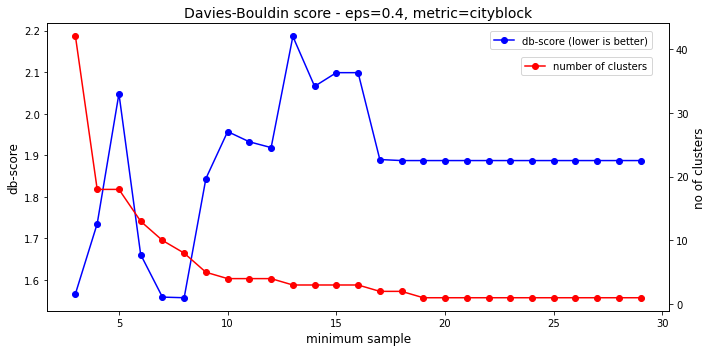

In [206]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 30 # set the range for k's
epsilons = [0.40] # set the epsilons to use
min_samples = range(2,k_range3,1) # set the range for min_samples
metrics = ['cityblock']# set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb2, bestch2, dbscores2, chscores2 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb2[7], dbscores2, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb2[7], bestdb2[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Davies-Bouldin score - eps=0.4, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

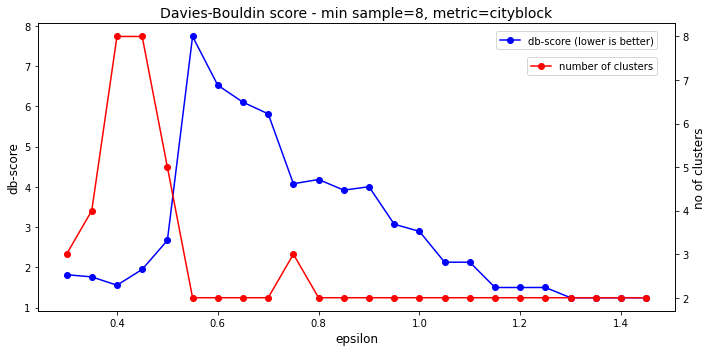

In [207]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 1.5 # set the range for k's
epsilons = np.arange(0.1,k_range3,0.05) # set the range for epsilons
min_samples = [8] # set the min_samples
metrics = ['cityblock'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb3, bestch3, dbscores3, chscores3 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb3[6], dbscores3, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb3[6], bestdb3[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Davies-Bouldin score - min sample=8, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

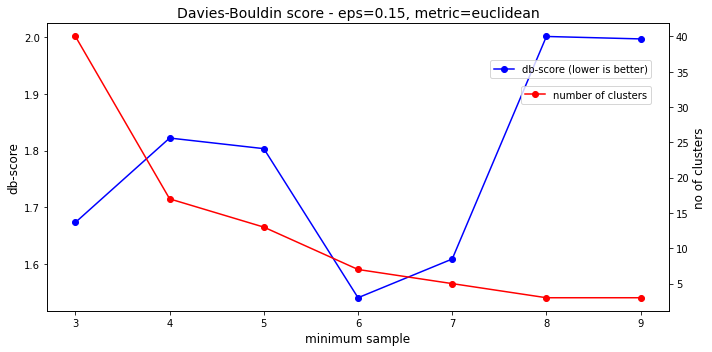

In [208]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 10 # set the range for k's
epsilons = [0.15] # set the epsilon
min_samples = range(2,k_range3,1) # set the range for min_samples
metrics = ['euclidean'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb4, bestch4, dbscores4, chscores4 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb4[7], dbscores4, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.89))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb4[7], bestdb4[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.8))

plt.title('Davies-Bouldin score - eps=0.15, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

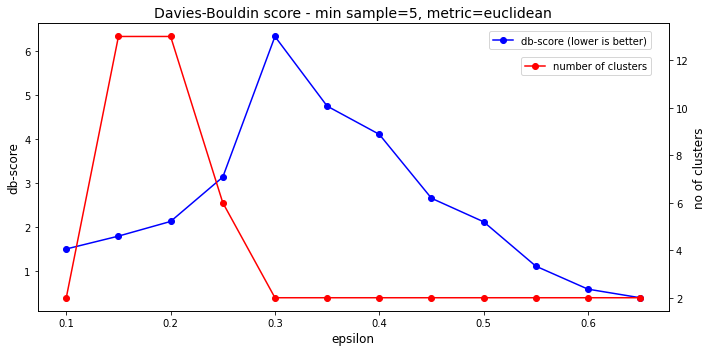

In [209]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 0.7 # set the range for k's
epsilons = np.arange(0.1,k_range3,0.05) # set the range for epsilons
min_samples = [5] # set the min_samples
metrics = ['euclidean'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb5, bestch5, dbscores5, chscores5 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb5[6], dbscores5, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb5[6], bestdb5[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Davies-Bouldin score - min sample=5, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

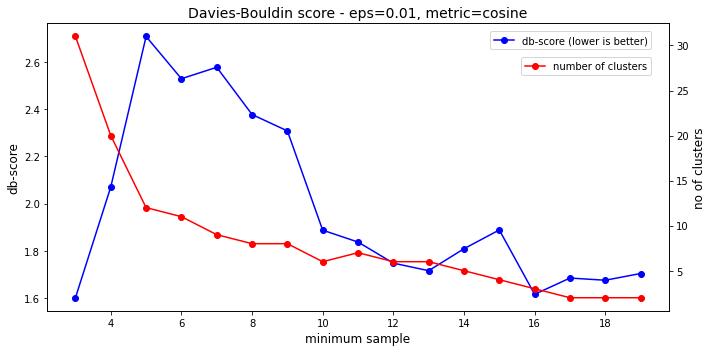

In [210]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 20 # set the range for k's
epsilons = [0.01] # set the epsilons to use
min_samples = range(2,k_range3,1) # set the range for min_samples
metrics = ['cosine'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb6, bestch6, dbscores6, chscores6 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb6[7], dbscores6, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb6[7], bestdb6[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Davies-Bouldin score - eps=0.01, metric=cosine',size=14)
fig.tight_layout()
plt.show()

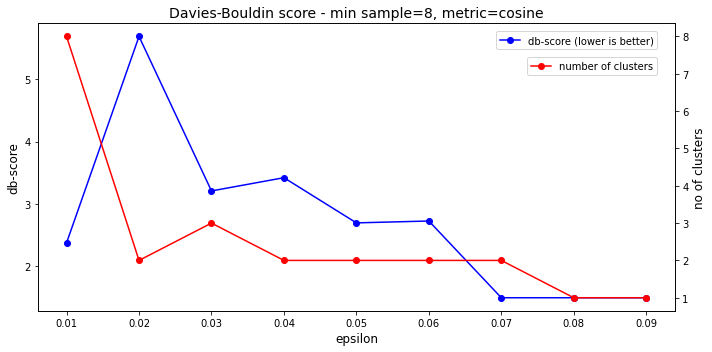

In [211]:
# calculate the Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 0.1 # set the range for k's
epsilons = np.arange(0.01,k_range3,0.01) # set the range for epsilons
min_samples = [8] # set the min_samples
metrics = ['cosine'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb7, bestch7, dbscores7, chscores7 = dbscan_grid(X_norm, epsilons, min_samples, metrics, high_range=50)

# plot the Davies-Bouldin scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('db-score', size=12)
ax1.plot(bestdb7[6], dbscores7, "bo-", label='db-score (lower is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb7[6], bestdb7[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Davies-Bouldin score - min sample=8, metric=cosine',size=14)
fig.tight_layout()
plt.show()

### Second evaluation 

**The Calinksi-Harabasz Score**  
The Calinksi-Harabasz score measures the ratio between the within and the between-cluster dispersions (higher score means dense and well separated clusters).

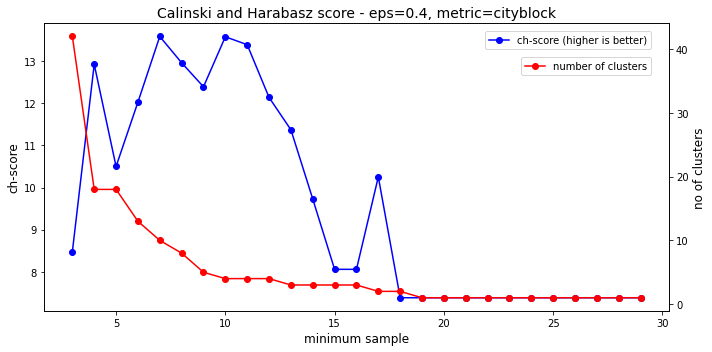

In [212]:
# plot the Calinski-Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch2[7], chscores2, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb2[7], bestdb2[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - eps=0.4, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

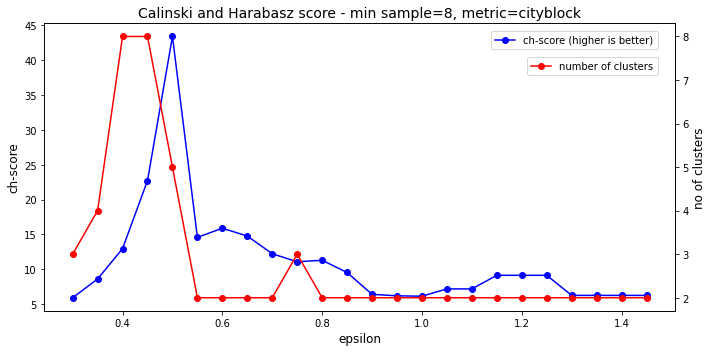

In [213]:
# plot the Calinski- Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch3[6], chscores3, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb3[6], bestdb3[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - min sample=8, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

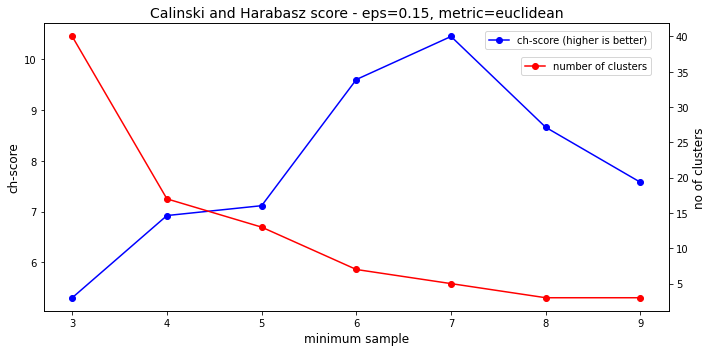

In [214]:
# plot the Calinski- Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch4[7], chscores4, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb4[7], bestdb4[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - eps=0.15, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

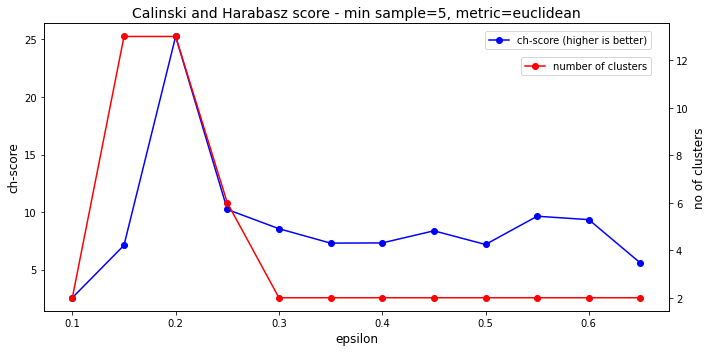

In [215]:
# plot the Calinski- Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch5[6], chscores5, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb5[6], bestdb5[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - min sample=5, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

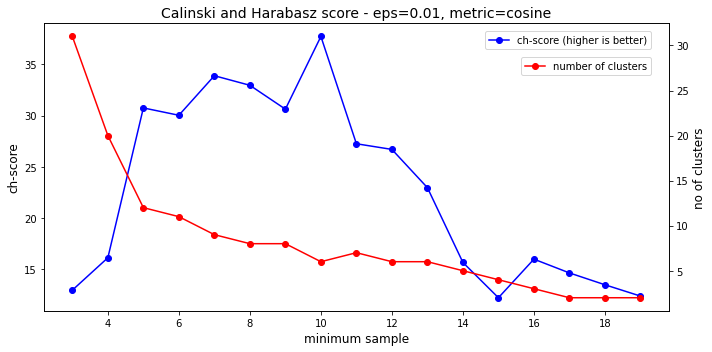

In [216]:
# plot the Calinski- Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch6[7], chscores6, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb6[7], bestdb6[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - eps=0.01, metric=cosine',size=14)
fig.tight_layout()
plt.show()

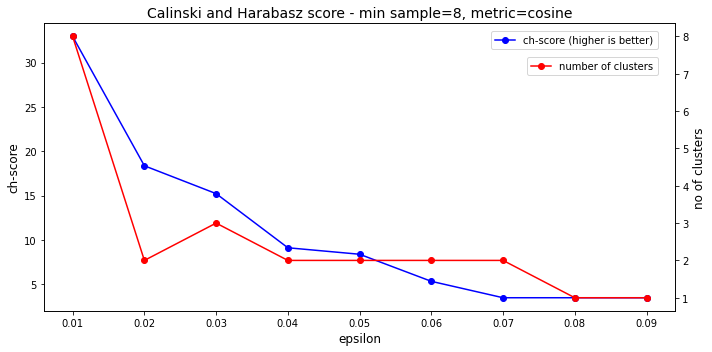

In [217]:
# plot the Calinski- Harabasz scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted 
# for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Calinski-Harabasz scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('ch-score', size=12)
ax1.plot(bestch7[6], chscores7, "bo-", label='ch-score (higher is better)')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb7[6], bestdb7[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Calinski and Harabasz score - min sample=8, metric=cosine',size=14)
fig.tight_layout()
plt.show()

### Plot Clusters  

**t-SNE projections**  
On the t-SNE projections, none of the models produced good clustering, with one cluster scattered around the other clusters (Figure 5.1.3g). Even the best model had this problem.*italicized text*

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 8.34 µs


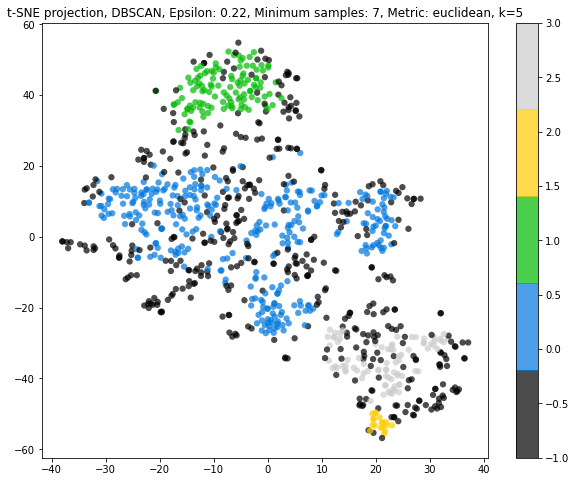

In [218]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.22, Minimum samples: 7, Metric: euclidean'
plot_tsne(X_norm,k=5,label=labels_db1,title='DBSCAN, Epsilon: 0.22, Minimum samples: 7, Metric: euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.44 µs


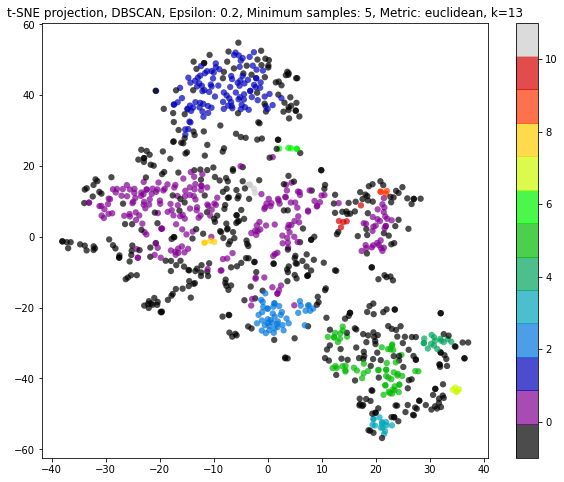

In [219]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.20, Minimum samples: 5, Metric: euclidean
plot_tsne(X_norm,k=13,label=labels_db6,title='DBSCAN, Epsilon: 0.2, Minimum samples: 5, Metric: euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.68 µs


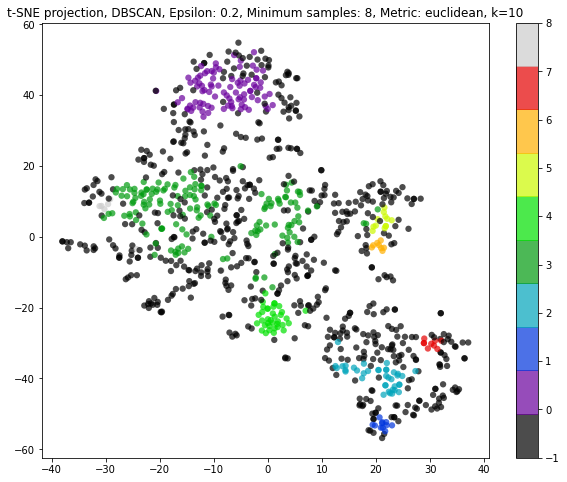

In [220]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.20, Minimum samples: 8, Metric: euclidean
plot_tsne(X_norm,k=10,label=labels_db7,title='DBSCAN, Epsilon: 0.2, Minimum samples: 8, Metric: euclidean')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 6.44 µs


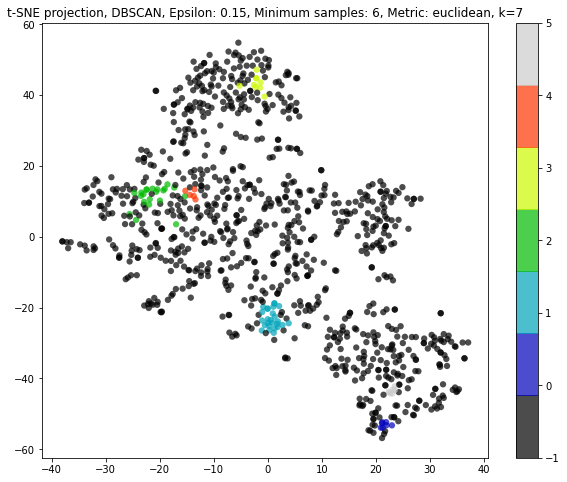

In [221]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.15, Minimum samples: 6, Metric: euclidean
plot_tsne(X_norm,k=7,label=labels_db9,title='DBSCAN, Epsilon: 0.15, Minimum samples: 6, Metric: euclidean')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


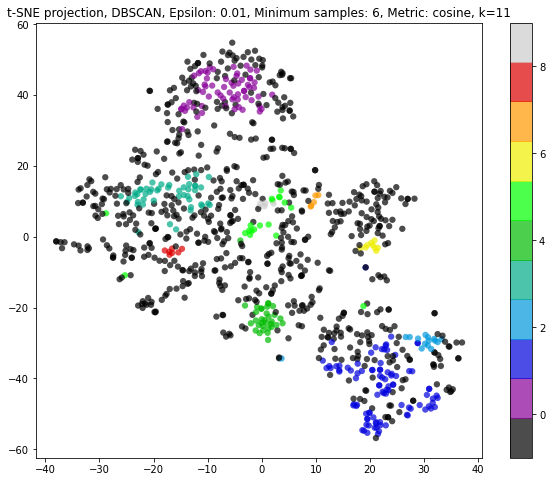

In [222]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.01, Minimum samples: 6, Metric: cosine
plot_tsne(X_norm,k=11,label=labels_db4,title='DBSCAN, Epsilon: 0.01, Minimum samples: 6, Metric: cosine')

CPU times: user 7 µs, sys: 2 µs, total: 9 µs
Wall time: 13.1 µs


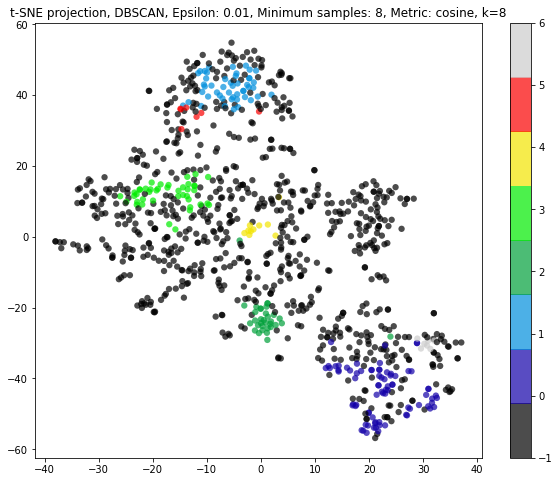

In [223]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.01, Minimum samples: 8, Metric: cosine
plot_tsne(X_norm,k=8,label=labels_db3,title='DBSCAN, Epsilon: 0.01, Minimum samples: 8, Metric: cosine')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.15 µs


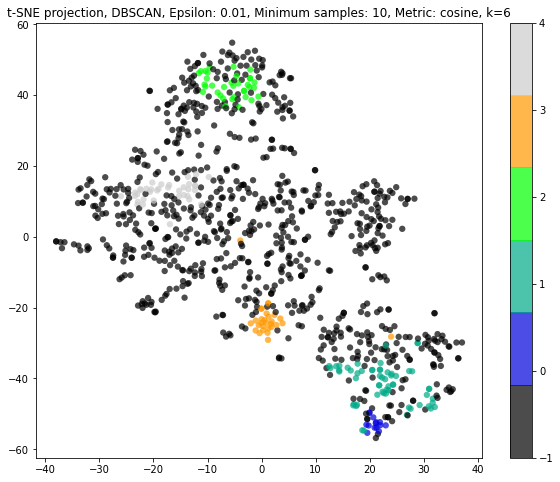

In [224]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.01, Minimum samples: 10, Metric: cosine
plot_tsne(X_norm,k=6,label=labels_db5,title='DBSCAN, Epsilon: 0.01, Minimum samples: 10, Metric: cosine')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs


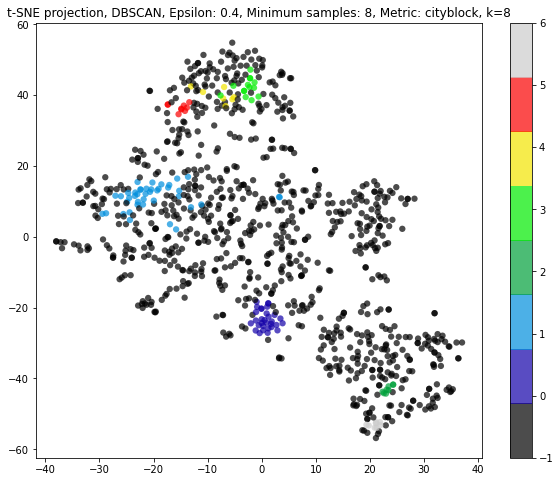

In [225]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.4, Minimum samples: 8, Metric: cityblock
plot_tsne(X_norm,k=8,label=labels_db2,title='DBSCAN, Epsilon: 0.4, Minimum samples: 8, Metric: cityblock')

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.11 µs


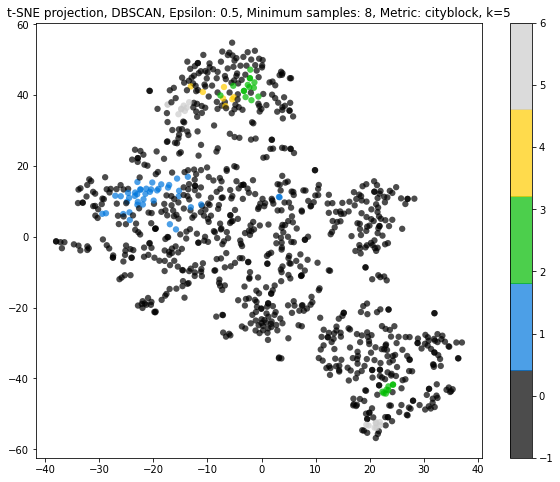

In [226]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.5, Minimum samples: 8, Metric: cityblock
plot_tsne(X_norm,k=5,label=labels_db2,title='DBSCAN, Epsilon: 0.5, Minimum samples: 8, Metric: cityblock')

## 4.2 ICMLA Dataset

### Functions

In [0]:
# function to find the best parameters for DBSCAN
def dbscan_grid(X, epsilons, min_samples, metrics, high_range):  
  from sklearn.cluster import DBSCAN
  from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, completeness_score, homogeneity_score
  
   # set the min and max scores for the below parameters
  dbscore_min = 999999
  chscore_max = 0
  comp_max = 0
  homo_max = 0

  # create empty lists for these variables
  dbscores = []
  chscores = []
  comps = []
  homos = []
  x_epsilons = []
  x_min_samples = []
  nclusters = []

  # iterate over the epsilons and minimum samples
  for eps in epsilons:
    for min_sample in min_samples:
      for metric in metrics:
        # create an instance of the DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_sample, metric=metric)
        # fit the model
        dbscan.fit(X)
        # get the labels
        labels = dbscan.labels_
        # get the number of cluster
        num_cluster = len(np.unique(labels))

        # calculate Davies-Bouldin, Calinski, Completeness and
        # Homogeneity scores if the number
        # of clusters >1 and lower than the high range
        if num_cluster>1  and num_cluster<high_range:
          dbscore = davies_bouldin_score(X, labels)
          chscore = calinski_harabasz_score(X, labels)
          compl = completeness_score(y2, labels)
          homog = homogeneity_score(y2, labels)
          
          # store the minimum dbscores including the parameters
          if dbscore<dbscore_min:
            dbscore_min = dbscore
            eps_min = eps
            sample_min = min_sample
            metric_min = metric
            num_cluster_min = len(np.unique(labels))
            chscore_min = chscore
          
          # store the maximum chscores including the parameters
          if chscore>chscore_max:
            chscore_max = chscore
            eps_max = eps
            sample_max = min_sample
            metric_max = metric
            num_cluster_max = len(np.unique(labels))
            dbscore_max = dbscore
          
          # store the maximum homogeneity including the parameters
          if homog>homo_max:
            homo_max = homog
            eps_maxh = eps
            sample_maxh = min_sample
            metric_maxh = metric
            num_cluster_maxh = len(np.unique(labels))
            comp_maxh = compl 
          
          # store the maximum completeness including the parameters
          if compl>comp_max: 
            comp_max = compl
            eps_maxc = eps
            sample_maxc = min_sample
            metric_maxc = metric
            num_cluster_maxc = len(np.unique(labels))
            homo_maxc = homog
        
        # store the results in the list
        if dbscore_min!=999999: # to ensure at least there is one
          dbscores.append(dbscore)
        
        # store the results in the list
        if chscore_max!=0: # to ensure at least there is one
          chscores.append(chscore)
          x_epsilons.append(eps)
          x_min_samples.append(min_sample)
          nclusters.append(num_cluster)
        
        # store the results in the list
        if comp_max!=0: # to ensure at least there is one
          comps.append(compl)
        
        # store the results in the list
        if homo_max!=0: # to ensure at least there is one
          homos.append(homog)

  # store all results in a list
  bestdb = [dbscore_min, eps_min, sample_min, metric_min, num_cluster_min, chscore_min, x_epsilons, x_min_samples, nclusters]
  bestch = [chscore_max, eps_max, sample_max, metric_max, num_cluster_max, dbscore_max, x_epsilons, x_min_samples, nclusters]
  bestcomp = [comp_max, eps_maxc, sample_maxc, metric_maxc, num_cluster_maxc, homo_maxc, x_epsilons, x_min_samples, nclusters]
  besthomo = [homo_max, eps_maxh, sample_maxh, metric_maxh, num_cluster_maxh, comp_maxh, x_epsilons, x_min_samples, nclusters]

  return bestdb, bestch, dbscores, chscores, comps, homos, bestcomp, besthomo

# function to plot the tsne projection using matplotlib
def plot_tsne(X,k,label,title=None):
  %%time

  from sklearn.manifold import TSNE
  tsne = TSNE(random_state=42)

  X_tsne = tsne.fit_transform(X)

  plt.figure(figsize=(10,8))
  plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=label, 
              edgecolor='none', alpha=0.7, s=40,
              cmap=plt.cm.get_cmap('nipy_spectral', k))
  plt.colorbar()
  title = 't-SNE projection, ' + title + ', k=' + str(k)
  plt.title(title)

### Train DBSCAN clustering 

Over 100 models were trained using the same three distance measures and different epsilon (0.01-5) and min samples (2-15) values.

In [228]:
# set the range for epsilons, the min_samples and the three distance measures to use
# use try-except to catch error when unable to find more than one cluster
# https://www.w3schools.com/python/python_try_except.asp
try:
  X2_data2 = X_combine_pca # set the data
  epsilons = np.arange(0.01,5,0.01) # set the range for epsilons
  min_samples = range(2,15,1) # set the range for min_samples
  metrics = ['euclidean', 'cityblock', 'cosine'] # set the metrics to use

  # train the DBSCAN models using the above parameters and calculate the scores
  bestdb1, bestch1, dbscores1, chscores1 , comps1, homos1, bestcomp1, besthomo1 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

  # print the best scores and parameters
  print("Best parameters based on dbscore:")
  print("Epsilon: {:.2f}".format(bestdb1[1]))
  print("Minimum samples:", bestdb1[2])
  print("Metric:", bestdb1[3])
  print("dbscore: {:.4f}".format(bestdb1[0]))
  print("chscore: {:.4f}".format(bestdb1[5]))
  print("Number of clusters found:", bestdb1[4])

  print("\nBest parameters based on chscore:")
  print("Epsilon: {:.2f}".format(bestch1[1]))
  print("Minimum samples:", bestch1[2])
  print("Metric:", bestch1[3])
  print("chscore: {:.4f}".format(bestch1[0]))
  print("dbscore: {:.4f}".format(bestch1[5]))
  print("Number of clusters found:", bestch1[4])

  print("\nBest parameters based on completeness:")
  print("Epsilon: {:.2f}".format(bestcomp1[1]))
  print("Minimum samples:", bestcomp1[2])
  print("Metric:", bestcomp1[3])
  print("completeness: {:.4f}".format(bestcomp1[0]))
  print("homogeneity: {:.4f}".format(bestcomp1[5]))
  print("Number of clusters found:", bestcomp1[4])

  print("\nBest parameters based on homogeneity:")
  print("Epsilon: {:.2f}".format(besthomo1[1]))
  print("Minimum samples:", besthomo1[2])
  print("Metric:", besthomo1[3])
  print("completeness: {:.4f}".format(besthomo1[5]))
  print("homogeneity: {:.4f}".format(besthomo1[0]))
  print("Number of clusters found:", besthomo1[4])
except:
  print("Unable to find > 1 clusters. Please try different epsilon or min_samples combinations.")

Best parameters based on dbscore:
Epsilon: 1.47
Minimum samples: 6
Metric: euclidean
dbscore: 0.6832
chscore: 2.0651
Number of clusters found: 2

Best parameters based on chscore:
Epsilon: 0.45
Minimum samples: 9
Metric: cosine
chscore: 13.8132
dbscore: 1.8535
Number of clusters found: 2

Best parameters based on completeness:
Epsilon: 0.33
Minimum samples: 5
Metric: cosine
completeness: 0.7542
homogeneity: 0.0749
Number of clusters found: 2

Best parameters based on homogeneity:
Epsilon: 4.63
Minimum samples: 2
Metric: cityblock
completeness: 0.5770
homogeneity: 0.4810
Number of clusters found: 20


In [229]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, completeness_score, homogeneity_score

# fit the best model found above
dbscan1 = DBSCAN(eps=besthomo1[1], min_samples=besthomo1[2], metric=besthomo1[3])
dbscan1.fit(X2_data2)
# get the labels
labels_db1 = dbscan1.labels_
# get the number of clusters found
num_cluster_db1 = len(np.unique(labels_db1)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore1 = davies_bouldin_score(X2_data2, labels_db1)
chscore1 = calinski_harabasz_score(X2_data2, labels_db1)
compl1 = completeness_score(y2, labels_db1)
homog1 = homogeneity_score(y2, labels_db1)
print("Number of clusters found:", num_cluster_db1)
print("Davies Bouldin Score: {:.4f}".format(dbscore1))
print("Calinski Harabasz Score: {:.4f}".format(chscore1))
print("Completeness Score: {:.4f}".format(compl1))
print("Homogeneity Score: {:.4f}".format(homog1))

Number of clusters found: 20
Davies Bouldin Score: 1.7762
Calinski Harabasz Score: 4.8447
Completeness Score: 0.5770
Homogeneity Score: 0.4810


In [230]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters
dbscan2 = DBSCAN(eps=4.1, min_samples=2, metric='cityblock')
dbscan2.fit(X2_data2)
# get the labels
labels_db2 = dbscan2.labels_
# get the number of clusters found
num_cluster_db2 = len(np.unique(labels_db2)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore2 = davies_bouldin_score(X2_data2, labels_db2)
chscore2 = calinski_harabasz_score(X2_data2, labels_db2)
compl2 = completeness_score(y2, labels_db2)
homog2 = homogeneity_score(y2, labels_db2)
print("Number of clusters found:", num_cluster_db2)
print("Davies Bouldin Score: {:.4f}".format(dbscore2))
print("Calinski Harabasz Score: {:.4f}".format(chscore2))
print("Completeness Score: {:.4f}".format(compl2))
print("Homogeneity Score: {:.4f}".format(homog2))

Number of clusters found: 15
Davies Bouldin Score: 1.3710
Calinski Harabasz Score: 3.9215
Completeness Score: 0.6170
Homogeneity Score: 0.3112


In [231]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters  
dbscan3 = DBSCAN(eps=1.14, min_samples=1, metric='euclidean')
dbscan3.fit(X2_data2)
# get the labels
labels_db3 = dbscan3.labels_
# get the number of clusters found
num_cluster_db3 = len(np.unique(labels_db3)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore3 = davies_bouldin_score(X2_data2, labels_db3)
chscore3 = calinski_harabasz_score(X2_data2, labels_db3)
compl3 = completeness_score(y2, labels_db3)
homog3 = homogeneity_score(y2, labels_db3)
print("Number of clusters found:", num_cluster_db3)
print("Davies Bouldin Score: {:.4f}".format(dbscore3))
print("Calinski Harabasz Score: {:.4f}".format(chscore3))
print("Completeness Score: {:.4f}".format(compl3))
print("Homogeneity Score: {:.4f}".format(homog3))

Number of clusters found: 17
Davies Bouldin Score: 1.1678
Calinski Harabasz Score: 2.9110
Completeness Score: 0.6081
Homogeneity Score: 0.2826


In [232]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters  
dbscan4 = DBSCAN(eps=0.42, min_samples=2, metric='cosine')
dbscan4.fit(X2_data2)
# get the labels
labels_db4 = dbscan4.labels_
# get the number of clusters found
num_cluster_db4 = len(np.unique(labels_db4)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore4 = davies_bouldin_score(X2_data2, labels_db4)
chscore4 = calinski_harabasz_score(X2_data2, labels_db4)
compl4 = completeness_score(y2, labels_db4)
homog4 = homogeneity_score(y2, labels_db4)
print("Number of clusters found:", num_cluster_db4)
print("Davies Bouldin Score: {:.4f}".format(dbscore4))
print("Calinski Harabasz Score: {:.4f}".format(chscore4))
print("Completeness Score: {:.4f}".format(compl4))
print("Homogeneity Score: {:.4f}".format(homog4))

Number of clusters found: 15
Davies Bouldin Score: 1.8112
Calinski Harabasz Score: 5.0759
Completeness Score: 0.5697
Homogeneity Score: 0.4071


In [233]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters  
dbscan5 = DBSCAN(eps=4.6, min_samples=2, metric='cityblock')
dbscan5.fit(X2_data2)
# get the labels
labels_db5 = dbscan5.labels_
# get the number of clusters found
num_cluster_db5 = len(np.unique(labels_db5)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore5 = davies_bouldin_score(X2_data2, labels_db5)
chscore5 = calinski_harabasz_score(X2_data2, labels_db5)
compl5 = completeness_score(y2, labels_db5)
homog5 = homogeneity_score(y2, labels_db5)
print("Number of clusters found:", num_cluster_db5)
print("Davies Bouldin Score: {:.4f}".format(dbscore5))
print("Calinski Harabasz Score: {:.4f}".format(chscore5))
print("Completeness Score: {:.4f}".format(compl5))
print("Homogeneity Score: {:.4f}".format(homog5))

Number of clusters found: 20
Davies Bouldin Score: 1.7019
Calinski Harabasz Score: 4.8499
Completeness Score: 0.5727
Homogeneity Score: 0.4615


In [234]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters  
dbscan6 = DBSCAN(eps=1, min_samples=2, metric='euclidean')
dbscan6.fit(X2_data2)
# get the labels
labels_db6 = dbscan6.labels_
# get the number of clusters found
num_cluster_db6 = len(np.unique(labels_db6)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore6 = davies_bouldin_score(X2_data2, labels_db6)
chscore6 = calinski_harabasz_score(X2_data2, labels_db6)
compl6 = completeness_score(y2, labels_db6)
homog6 = homogeneity_score(y2, labels_db6)
print("Number of clusters found:", num_cluster_db6)
print("Davies Bouldin Score: {:.4f}".format(dbscore6))
print("Calinski Harabasz Score: {:.4f}".format(chscore6))
print("Completeness Score: {:.4f}".format(compl6))
print("Homogeneity Score: {:.4f}".format(homog6))

Number of clusters found: 20
Davies Bouldin Score: 1.5103
Calinski Harabasz Score: 4.2190
Completeness Score: 0.5928
Homogeneity Score: 0.4199


In [235]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# fit a model with the below parameters  
dbscan7 = DBSCAN(eps=4.85, min_samples=1, metric='cityblock')
dbscan7.fit(X2_data2)
# get the labels
labels_db7 = dbscan7.labels_
# get the number of clusters found
num_cluster_db7 = len(np.unique(labels_db7)) 

# calculate Davies-Bouldin, Calinski, Completeness and Homogeneity scores 
dbscore7 = davies_bouldin_score(X2_data2, labels_db7)
chscore7 = calinski_harabasz_score(X2_data2, labels_db7)
compl7 = completeness_score(y2, labels_db7)
homog7 = homogeneity_score(y2, labels_db7)
print("Number of clusters found:", num_cluster_db7)
print("Davies Bouldin Score: {:.4f}".format(dbscore7))
print("Calinski Harabasz Score: {:.4f}".format(chscore7))
print("Completeness Score: {:.4f}".format(compl7))
print("Homogeneity Score: {:.4f}".format(homog7))

Number of clusters found: 21
Davies Bouldin Score: 1.1685
Calinski Harabasz Score: 2.3795
Completeness Score: 0.6148
Homogeneity Score: 0.3277


### First evaluation

**The Completeness Score**  
The completeness score measures the degree to which all points of a given class belong to the same cluster (a score of 1 means perfectly complete labeling).

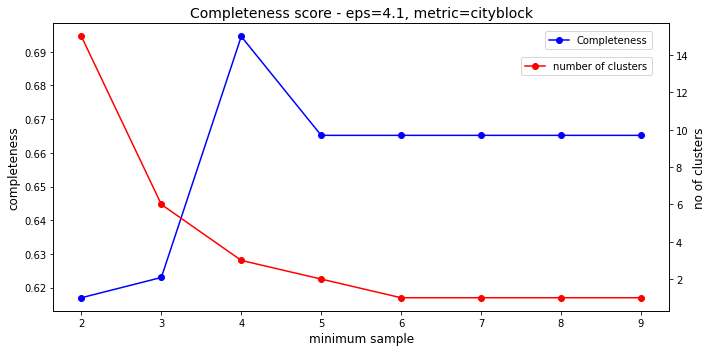

In [236]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 10 # set the range for k's
epsilons = [4.1] # set the epsilons to use
min_samples = range(1,k_range3,1) # set the range for min_samples
metrics = ['cityblock'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb2, bestch2, dbscores2, chscores2, comps2, homos2, bestcomp2, besthomo2 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Davies-Bouldin scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp2[7], comps2, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb2[7], bestdb2[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Completeness score - eps=4.1, metric=cityblock',size=14)
fig.tight_layout()

plt.show()

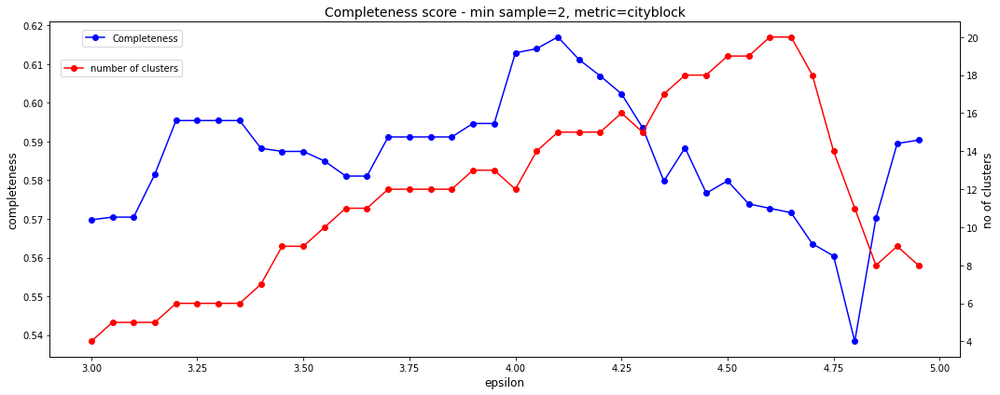

In [237]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 5 # set the range for k's
epsilons = np.arange(3,k_range3,0.05) # set the range for epsilons
min_samples = [2] # # set the min_samples
metrics = ['cityblock'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb3, bestch3, dbscores3, chscores3, comps3, homos3, bestcomp3, besthomo3 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilons
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15, 6)

# plot the Completeness scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp3[6], comps3, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.15, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb3[6], bestdb3[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.15, 0.9))

plt.title('Completeness score - min sample=2, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

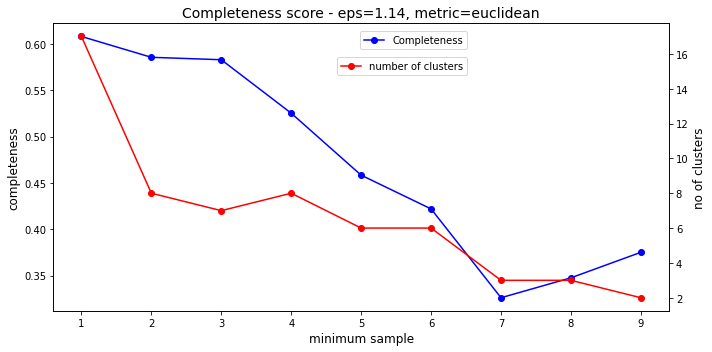

In [238]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 10 # set the range for k's
epsilons = [1.14] # set the epsilons to use
min_samples = range(1,k_range3,1) # set the range for min_samples
metrics = ['euclidean'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb4, bestch4, dbscores4, chscores4, comps4, homos4, bestcomp4, besthomo4 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Completeness scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp4[7], comps4, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.68, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb4[7], bestdb4[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.68, 0.9))

plt.title('Completeness score - eps=1.14, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

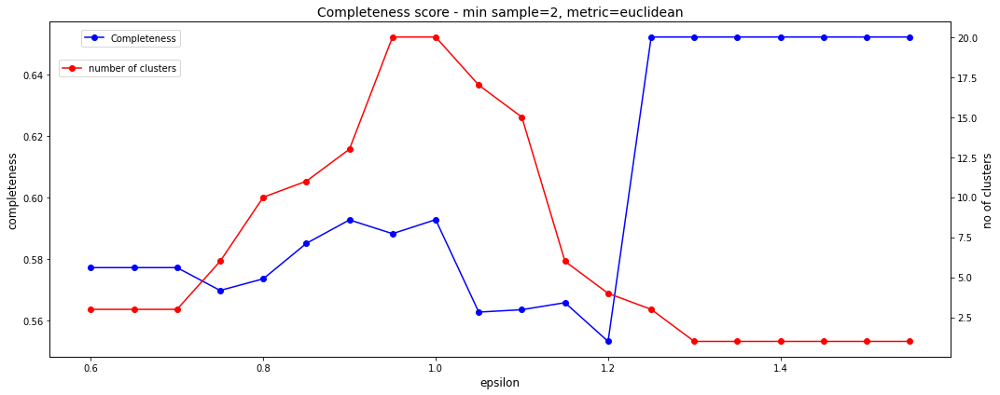

In [239]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 1.6 # set the range for k's
epsilons = np.arange(0.6,k_range3,0.05) # set the range for epsilons
min_samples = [2] # set the range for min_samples
metrics = ['euclidean'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb5, bestch5, dbscores5, chscores5, comps5, homos5, bestcomp5, besthomo5 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilon
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15, 6)

# plot the Completeness scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp5[6], comps5, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.15, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb5[6], bestdb5[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.15, 0.9))

plt.title('Completeness score - min sample=2, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

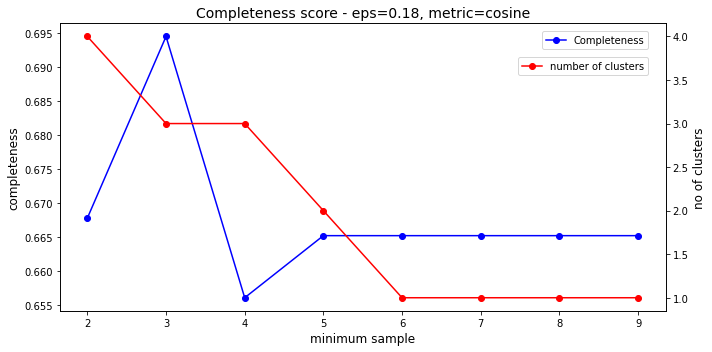

In [240]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 10 # set the range for k's
epsilons = [0.18] # set the epsilons to use
min_samples = range(1,k_range3,1) # set the range for min_samples
metrics = ['cosine'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb6, bestch6, dbscores6, chscores6, comps6, homos6, bestcomp6, besthomo6 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Completeness scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp6[7], comps6, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb6[7], bestdb6[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Completeness score - eps=0.18, metric=cosine',size=14)
fig.tight_layout()
plt.show()

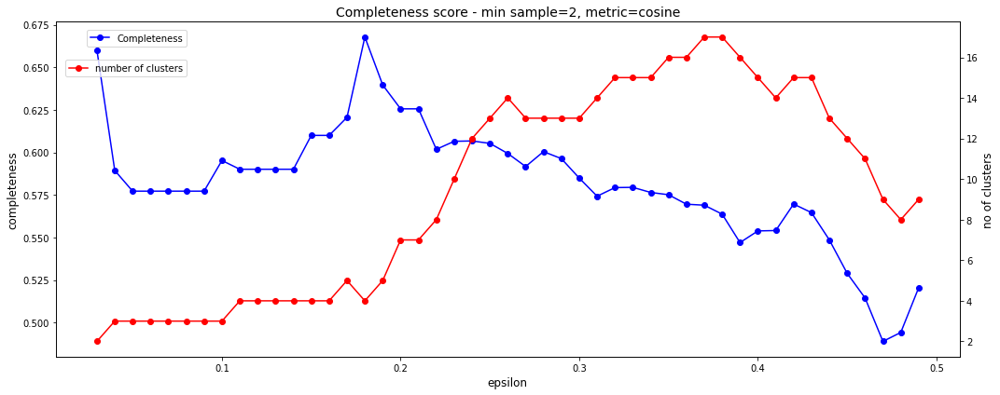

In [241]:
# calculate the Completeness, Homogeneity, Davies-Bouldin and Calinski-Harabasz scores
k_range3 = 0.5 # set the range for k's
epsilons = np.arange(0.01,k_range3,0.01) # set the range for epsilons
min_samples = [2] # set the min_samples
metrics = ['cosine'] # set the metric to use

# train the DBSCAN models using the above parameters and calculate the scores
bestdb7, bestch7, dbscores7, chscores7, comps7, homos7, bestcomp7, besthomo7 = dbscan_grid(X2_data2, epsilons, min_samples, metrics, high_range=50)

# plot the Completeness scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilon
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15,6)

# plot the Completeness scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('completeness', size=12)
ax1.plot(bestcomp7[6], comps7, "bo-", label='Completeness')
ax1.legend(loc='upper right', bbox_to_anchor=(0.15, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb7[6], bestdb7[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.15, 0.9))

plt.title('Completeness score - min sample=2, metric=cosine',size=14)
fig.tight_layout()
plt.show()

### Second evaluation

**The Homogeneity Score**  
The homogeneity score measures the degree to which all of the clusters contain only points of a single class (a score of 1 means perfectly homogeneous labeling).

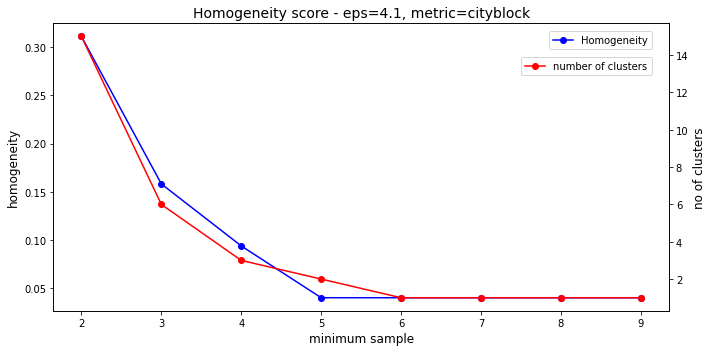

In [242]:
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Homogeneity scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo2[7], homos2, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb2[7], bestdb2[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Homogeneity score - eps=4.1, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

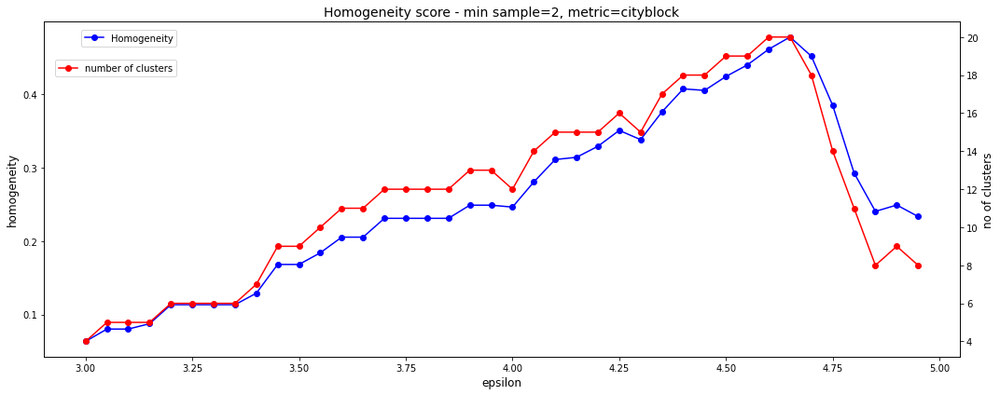

In [243]:
# train the DBSCAN models using the above parameters and calculate the scores
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilon
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15, 6)

# plot the Homogeneity scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo3[6], homos3, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.15, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb3[6], bestdb3[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.15, 0.9))

plt.title('Homogeneity score - min sample=2, metric=cityblock',size=14)
fig.tight_layout()
plt.show()

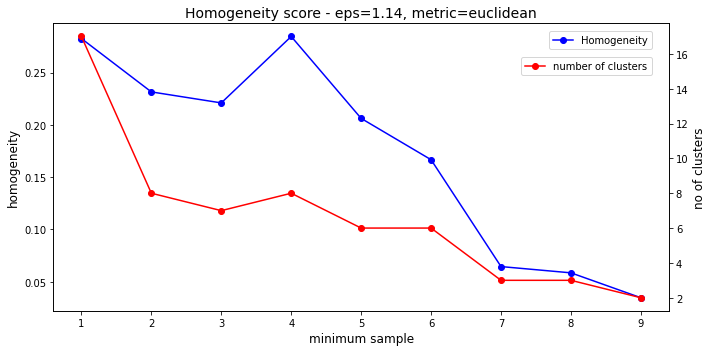

In [244]:
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Homogeneity scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo4[7], homos4, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb4[7], bestdb4[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Homogeneity score - eps=1.14, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

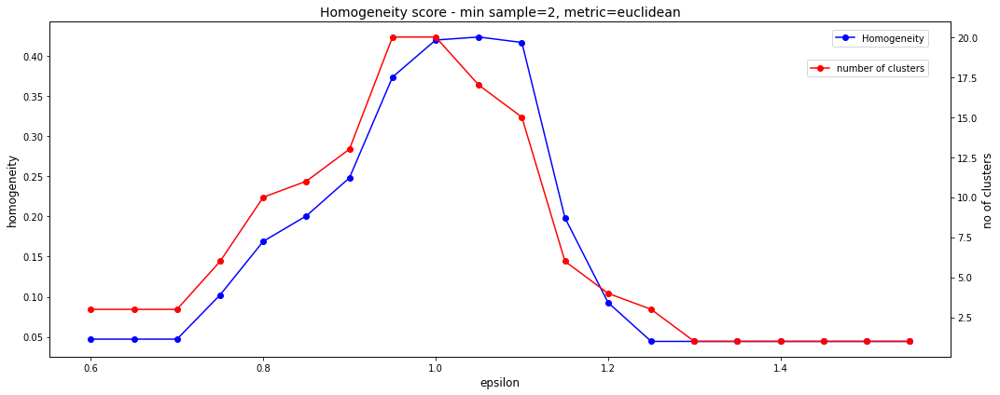

In [245]:
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilon
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15, 6)

# plot the Homogeneity scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo5[6], homos5, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb5[6], bestdb5[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Homogeneity score - min sample=2, metric=euclidean',size=14)
fig.tight_layout()
plt.show()

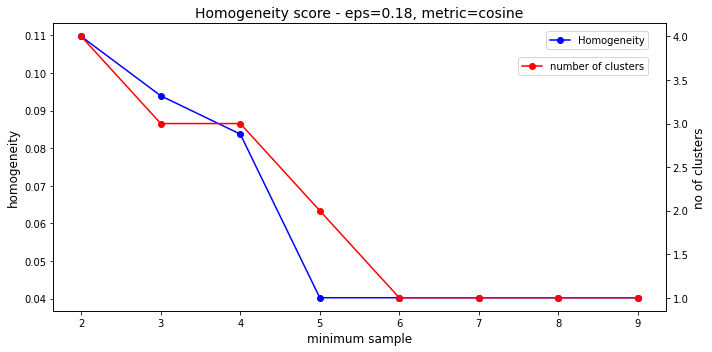

In [246]:
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the min_samples
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)

# plot the Homogeneity scores
ax1.set_xlabel('minimum sample', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo6[7], homos6, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb6[7], bestdb6[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Homogeneity score - eps=0.18, metric=cosine',size=14)
fig.tight_layout()
plt.show()

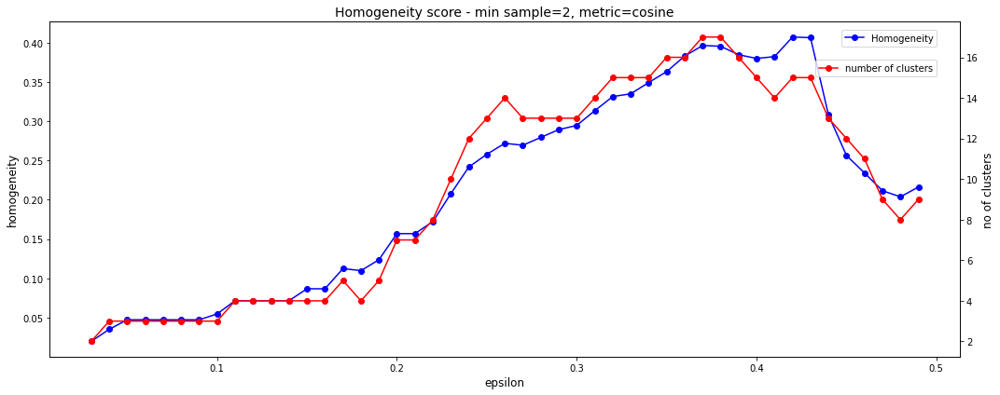

In [247]:
# plot the Homogeneity scores and the number of clusters found using matplotlib
# to see how the scores vary as we vary the epsilon
# adopted from https://matplotlib.org/gallery/api/two_scales.html and adjusted for this plot accordingly
fig, ax1 = plt.subplots()
fig.set_size_inches(15, 6)

# plot the Homogeneity scores
ax1.set_xlabel('epsilon', size=12)
ax1.set_ylabel('homogeneity', size=12)
ax1.plot(besthomo7[6], homos7, "bo-", label='Homogeneity')
ax1.legend(loc='upper right', bbox_to_anchor=(0.98, 0.99))

# plot the number of clusters found
ax2 = ax1.twinx()
ax2.set_ylabel('no of clusters', size=12)
ax2.plot(bestdb7[6], bestdb7[8], "bo-", label='number of clusters',color='red')
ax2.legend(loc='upper right', bbox_to_anchor=(0.98, 0.9))

plt.title('Homogeneity score - min sample=2, metric=cosine',size=14)
fig.tight_layout()
plt.show()

### Plot Clusters  

**t-SNE projections**  
The DBSCAN models do not seem to plot well on the t-SNE projections. The clusters formed were not clearly separated and hard to identify.

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.39 µs


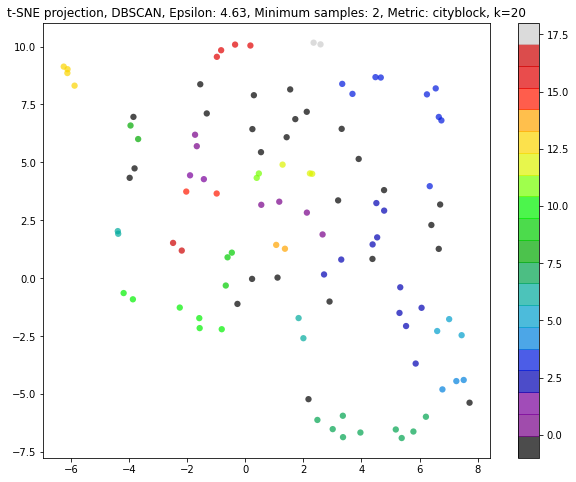

In [248]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 4.63, Minimum samples: 2, Metric: cityblock
plot_tsne(X2_data2,k=20,label=labels_db1,title='DBSCAN, Epsilon: 4.63, Minimum samples: 2, Metric: cityblock')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.63 µs


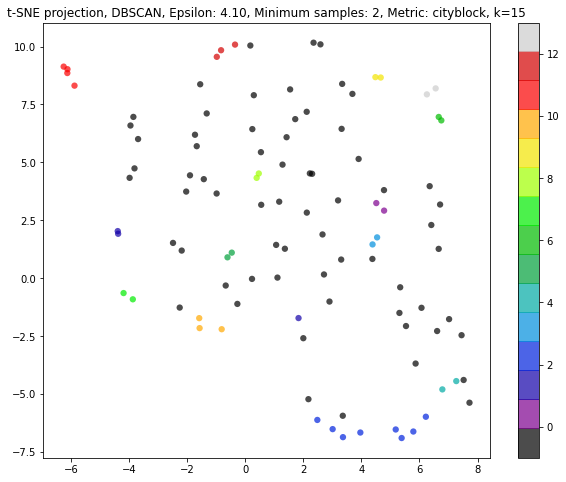

In [249]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 4.10, Minimum samples: 2, Metric: cityblock
plot_tsne(X2_data2,k=15,label=labels_db2,title='DBSCAN, Epsilon: 4.10, Minimum samples: 2, Metric: cityblock')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.96 µs


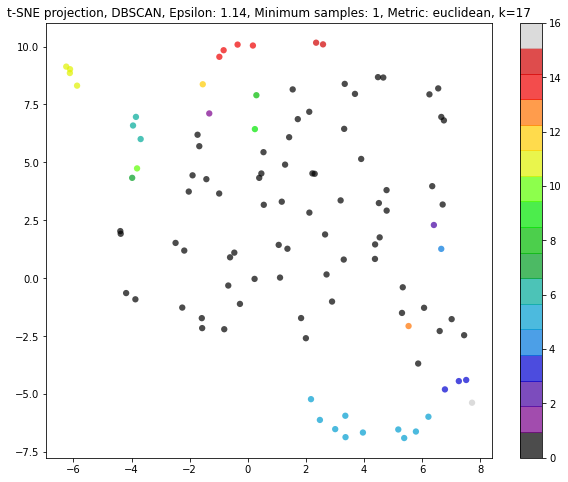

In [250]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 1.14, Minimum samples: 1, Metric: euclidean
plot_tsne(X2_data2,k=17,label=labels_db3,title='DBSCAN, Epsilon: 1.14, Minimum samples: 1, Metric: euclidean')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.96 µs


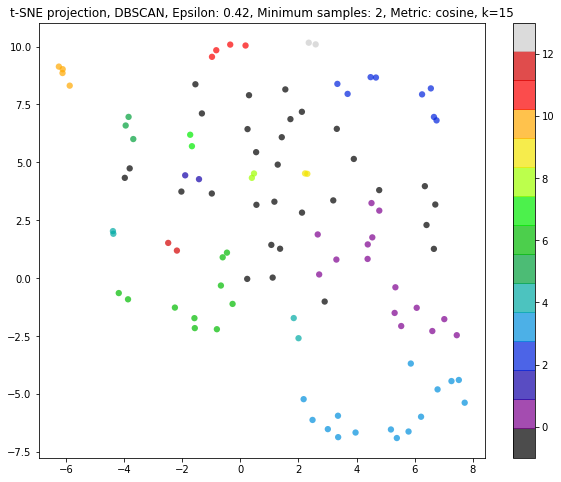

In [251]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 0.42, Minimum samples: 2, Metric: cosine
plot_tsne(X2_data2,k=15,label=labels_db4,title='DBSCAN, Epsilon: 0.42, Minimum samples: 2, Metric: cosine')

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.39 µs


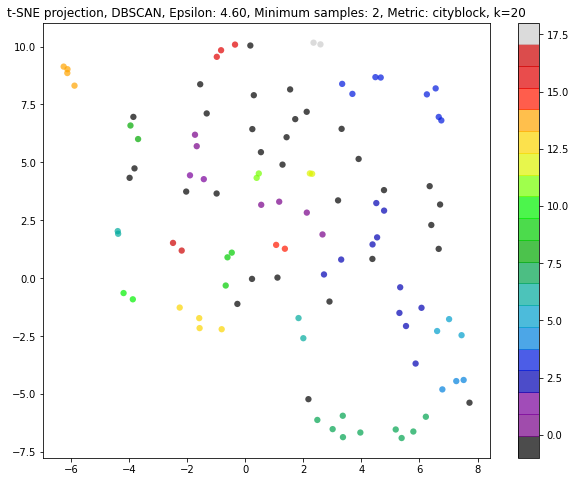

In [252]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 4.60, Minimum samples: 2, Metric: cityblock
plot_tsne(X2_data2,k=20,label=labels_db5,title='DBSCAN, Epsilon: 4.60, Minimum samples: 2, Metric: cityblock')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


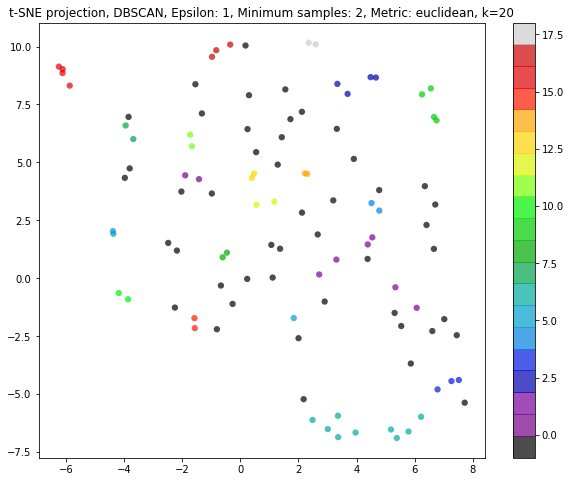

In [253]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 1, Minimum samples: 2, Metric: euclidean
plot_tsne(X2_data2,k=20,label=labels_db6,title='DBSCAN, Epsilon: 1, Minimum samples: 2, Metric: euclidean')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.96 µs


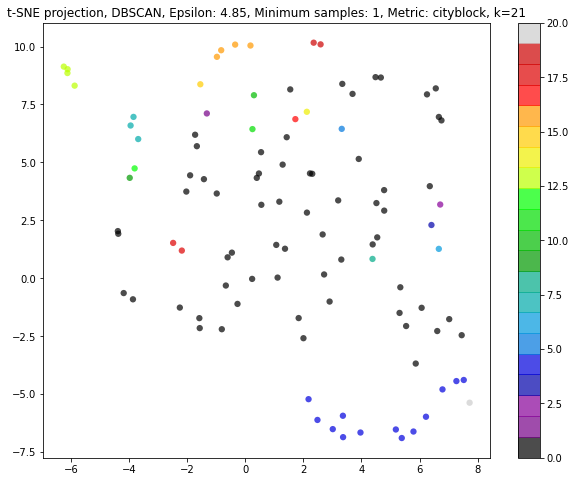

In [254]:
# use tSNE projection to plot the clusters for DBSCAN, Epsilon: 4.85, Minimum samples: 1, Metric: cityblock
plot_tsne(X2_data2,k=21,label=labels_db7,title='DBSCAN, Epsilon: 4.85, Minimum samples: 1, Metric: cityblock')

**Labelling table**

In [255]:
# create a dataframe using pandas to show the resulting clustering
pd.set_option('display.max_rows', 105)
data2_label20 = pd.DataFrame({"label":labels_db1, "session":y2_string})
data2_label20.sort_values(by='label')

,label,session
52,-1,Science and Industry
38,-1,Medicine and Bioinformatics
42,-1,Real-time Systems and Industry
46,-1,Information Retrieval I
103,-1,Machine learning of graphical models in static...
54,-1,Science and Industry
55,-1,Science and Industry
57,-1,Machine Learning II
19,-1,Machine Learning I
62,-1,"Medicine, Science and Music"
